In [3]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns

# 1. Load dataset

In [4]:
gitURL = "https://raw.githubusercontent.com/theegolf/Q-Commerce-Analysis/refs/heads/master/blinkit_marketing_performance.csv"
df = pd.read_csv(gitURL)
df.head(30)

,campaign_id,campaign_name,date,target_audience,channel,impressions,clicks,conversions,spend,revenue_generated,roas
0,548299,New User Discount,2024-11-05,Premium,App,3130,163,78,1431.85,4777.75,3.60
1,390914,Weekend Special,2024-11-05,Inactive,App,3925,494,45,4506.34,6238.11,2.98
2,834385,Festival Offer,2024-11-05,Inactive,Email,7012,370,78,4524.23,2621.00,2.95
3,241523,Flash Sale,2024-11-05,Inactive,SMS,1115,579,86,3622.79,2955.00,2.84
4,595111,Membership Drive,2024-11-05,New Users,Email,7172,795,54,2888.99,8951.81,2.22
5,176344,Category Promotion,2024-11-05,Inactive,App,4333,421,40,2714.78,6697.88,3.89
6,875646,App Push Notification,2024-11-05,Premium,Email,4752,937,21,3584.76,9152.99,2.14
7,5516,Email Campaign,2024-11-05,Premium,Social Media,1559,418,68,1457.88,2156.09,3.92
8,989534,Referral Program,2024-11-05,New Users,SMS,3838,911,45,4808.64,8074.17,1.70
9,243346,New User Discount,2024-11-04,Inactive,SMS,6289,834,14,3746.35,4474.02,2.56


# 2. Explore Dataset

In [5]:
df.shape

(5400, 11)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5400 entries, 0 to 5399
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   campaign_id        5400 non-null   int64  
 1   campaign_name      5400 non-null   object 
 2   date               5400 non-null   object 
 3   target_audience    5400 non-null   object 
 4   channel            5400 non-null   object 
 5   impressions        5400 non-null   int64  
 6   clicks             5400 non-null   int64  
 7   conversions        5400 non-null   int64  
 8   spend              5400 non-null   float64
 9   revenue_generated  5400 non-null   float64
 10  roas               5400 non-null   float64
dtypes: float64(3), int64(4), object(4)
memory usage: 464.2+ KB


In [7]:
df.isnull().sum()

,0
campaign_id,0
campaign_name,0
date,0
target_audience,0
channel,0
impressions,0
clicks,0
conversions,0
spend,0
revenue_generated,0


In [8]:
df.describe()

,campaign_id,impressions,clicks,conversions,spend,revenue_generated,roas
count,5400.000000,5400.000000,5400.000000,5400.000000,5400.000000,5400.000000,5400.000000
mean,501315.219074,5460.668519,550.767593,55.192222,3022.192267,5961.742106,2.740711
std,287611.524258,2571.779820,260.080051,26.150173,1148.732680,2322.242911,0.722986
min,243.000000,1002.000000,100.000000,10.000000,1000.630000,2003.100000,1.500000
25%,249200.000000,3231.500000,322.000000,32.000000,2029.070000,3907.240000,2.120000
50%,505012.500000,5457.500000,555.000000,55.000000,3042.485000,5935.940000,2.725000
75%,752219.250000,7676.250000,772.000000,78.000000,4011.572500,7973.712500,3.370000
max,999950.000000,9999.000000,1000.000000,100.000000,4997.550000,9999.540000,4.000000


In [9]:
df.duplicated()

,0
0,False
1,False
2,False
3,False
4,False
...,...
5395,False
5396,False
5397,False
5398,False


In [10]:
df.apply(lambda x: len(x.unique()))

,0
campaign_id,5400
campaign_name,9
date,600
target_audience,4
channel,4
impressions,4058
clicks,899
conversions,91
spend,5356
revenue_generated,5386


In [11]:
print(df['campaign_name'].value_counts())
print('\n')
print(df['target_audience'].value_counts())
print('\n')
print(df['channel'].value_counts())

campaign_name
New User Discount        600
Weekend Special          600
Festival Offer           600
Flash Sale               600
Membership Drive         600
Category Promotion       600
App Push Notification    600
Email Campaign           600
Referral Program         600
Name: count, dtype: int64


target_audience
New Users    1356
Premium      1355
Inactive     1347
All          1342
Name: count, dtype: int64


channel
App             1374
Email           1343
Social Media    1343
SMS             1340
Name: count, dtype: int64


In [12]:
df['date'] = pd.to_datetime(df['date'])
loc_index = df.columns.get_loc('date')
insert_loc = loc_index + 1
df.insert(insert_loc, 'publish_day', df['date'].dt.day_name())
df

,campaign_id,campaign_name,date,publish_day,target_audience,channel,impressions,clicks,conversions,spend,revenue_generated,roas
0,548299,New User Discount,2024-11-05,Tuesday,Premium,App,3130,163,78,1431.85,4777.75,3.60
1,390914,Weekend Special,2024-11-05,Tuesday,Inactive,App,3925,494,45,4506.34,6238.11,2.98
2,834385,Festival Offer,2024-11-05,Tuesday,Inactive,Email,7012,370,78,4524.23,2621.00,2.95
3,241523,Flash Sale,2024-11-05,Tuesday,Inactive,SMS,1115,579,86,3622.79,2955.00,2.84
4,595111,Membership Drive,2024-11-05,Tuesday,New Users,Email,7172,795,54,2888.99,8951.81,2.22
...,...,...,...,...,...,...,...,...,...,...,...,...
5395,381623,Membership Drive,2023-03-17,Friday,New Users,Email,8331,809,92,2363.07,3710.79,1.64
5396,493317,Category Promotion,2023-03-17,Friday,Premium,Social Media,5216,860,34,3922.53,7701.25,2.01
5397,879292,App Push Notification,2023-03-17,Friday,All,App,8480,734,20,1990.75,6650.41,3.98
5398,461129,Email Campaign,2023-03-17,Friday,New Users,Email,3569,568,10,4246.47,5880.42,2.50


In [13]:
loc_index = df.columns.get_loc('publish_day')
insert_loc = loc_index + 1
df.insert(insert_loc, 'publish_month', df['date'].dt.month)
df

,campaign_id,campaign_name,date,publish_day,publish_month,target_audience,channel,impressions,clicks,conversions,spend,revenue_generated,roas
0,548299,New User Discount,2024-11-05,Tuesday,11,Premium,App,3130,163,78,1431.85,4777.75,3.60
1,390914,Weekend Special,2024-11-05,Tuesday,11,Inactive,App,3925,494,45,4506.34,6238.11,2.98
2,834385,Festival Offer,2024-11-05,Tuesday,11,Inactive,Email,7012,370,78,4524.23,2621.00,2.95
3,241523,Flash Sale,2024-11-05,Tuesday,11,Inactive,SMS,1115,579,86,3622.79,2955.00,2.84
4,595111,Membership Drive,2024-11-05,Tuesday,11,New Users,Email,7172,795,54,2888.99,8951.81,2.22
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5395,381623,Membership Drive,2023-03-17,Friday,3,New Users,Email,8331,809,92,2363.07,3710.79,1.64
5396,493317,Category Promotion,2023-03-17,Friday,3,Premium,Social Media,5216,860,34,3922.53,7701.25,2.01
5397,879292,App Push Notification,2023-03-17,Friday,3,All,App,8480,734,20,1990.75,6650.41,3.98
5398,461129,Email Campaign,2023-03-17,Friday,3,New Users,Email,3569,568,10,4246.47,5880.42,2.50


# 3. Exploratory Data Analysis (EDA)

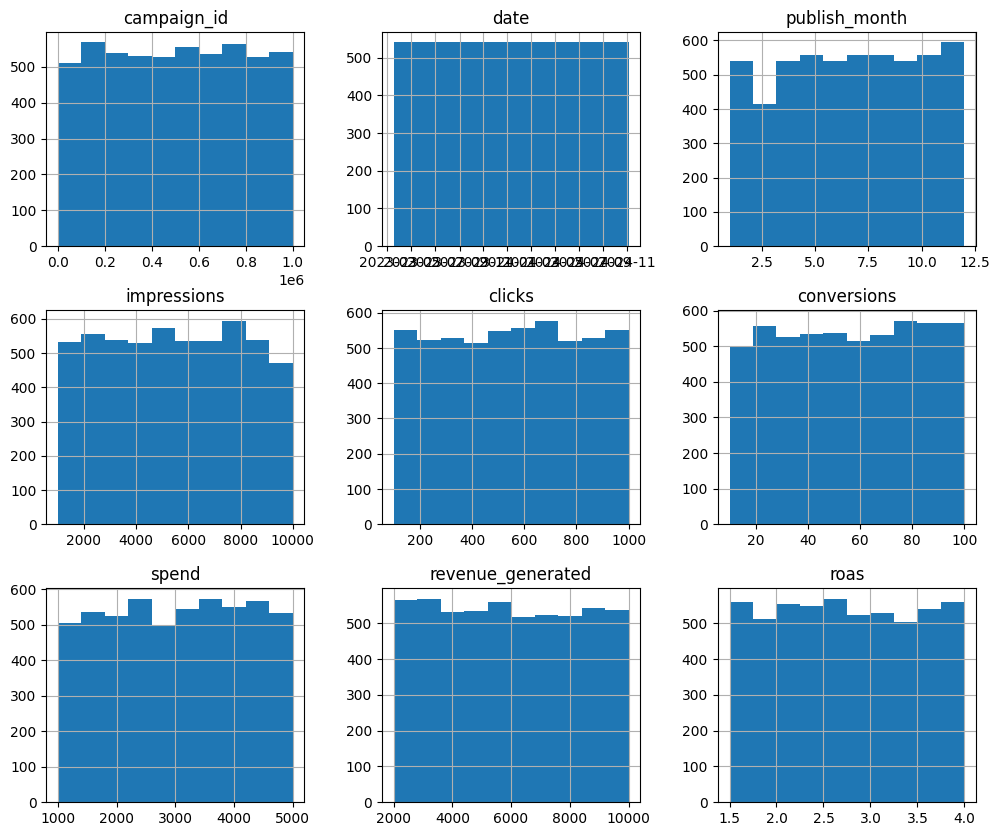

In [14]:
df.hist(figsize=(12,10))
plt.show()

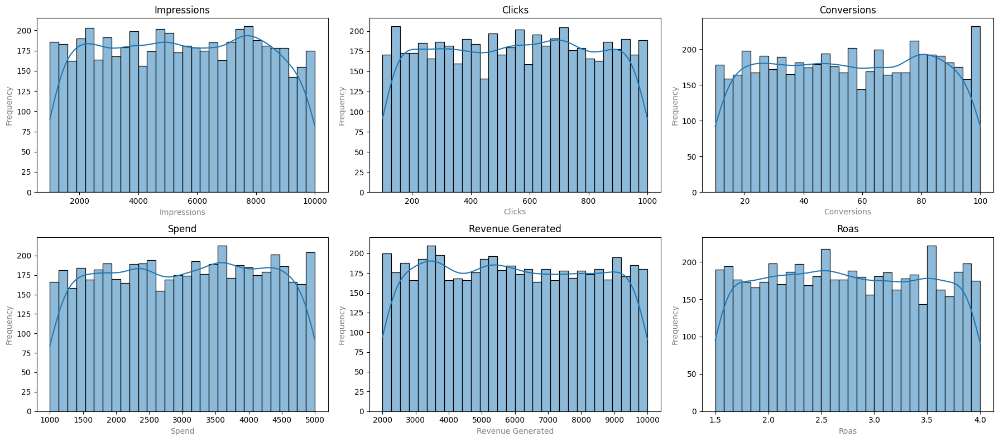

In [15]:
# Get all numeric columns
exclude = ['campaign_id', 'publish_month']
numeric_cols = df.select_dtypes(include='number').columns.tolist()
numeric_cols = [col for col in numeric_cols if col not in exclude]
# Set up the plot grid
num_cols = len(numeric_cols)
n_cols = 3  # You can change this to control columns in the grid
n_rows = (num_cols + n_cols - 1) // n_cols  # Ceiling division

plt.figure(figsize=(6 * n_cols, 4 * n_rows))

# Loop over each numeric column and plot
for i, col in enumerate(numeric_cols, 1):
    plt.subplot(n_rows, n_cols, i)
    sns.histplot(df[col].dropna(), kde=True, bins=30)
    col = col.replace('_', ' ').title()
    plt.title(col)
    plt.xlabel(col, color='gray')
    plt.ylabel('Frequency', color='gray')

plt.tight_layout()
plt.show()


### 3.1 Correlation Analysis

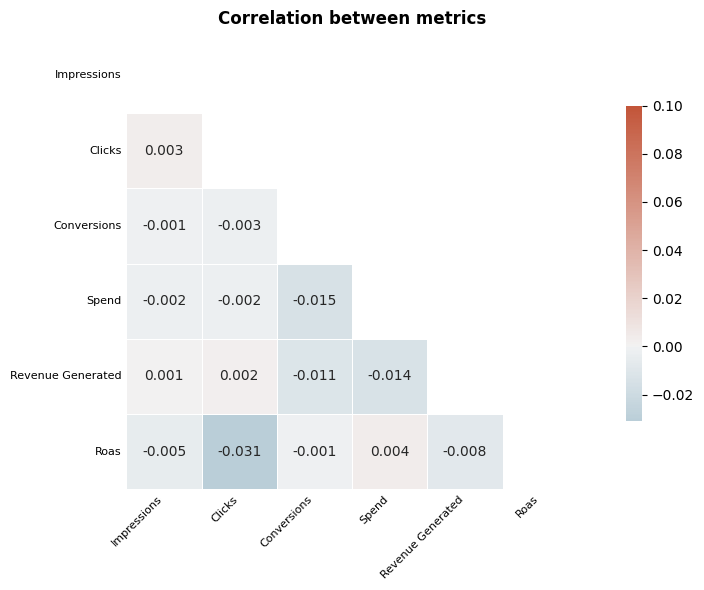

In [16]:
cor_df = df.copy()
numeric_df = cor_df.select_dtypes(include='number')
numeric_df = numeric_df.drop(['campaign_id', 'publish_month'], axis=1)

corr_matrix = numeric_df.corr()
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

formatted_col = [col.replace('_', ' ').title() for col in corr_matrix.columns]
formatted_idx = [idx.replace('_', ' ').title() for idx in corr_matrix.index]

f, ax = plt.subplots(figsize=(10, 6))
cmap = sns.diverging_palette(230, 20, as_cmap=True)

sns.heatmap(
    corr_matrix,
    mask=mask,
    cmap=cmap,
    vmax=0.1,
    center=0,
    square=True,
    linewidths=.5,
    cbar_kws={"shrink": .7},
    annot=True,
    fmt=".3f"
    )
plt.title('Correlation between metrics', fontweight='bold', pad=10)

ax.tick_params(axis='both', length=0)
ax.set_xticklabels(formatted_col, rotation=45, ha='right', fontsize=8)
ax.set_yticklabels(formatted_idx, rotation=0, fontsize=8)

plt.tight_layout()
plt.show()

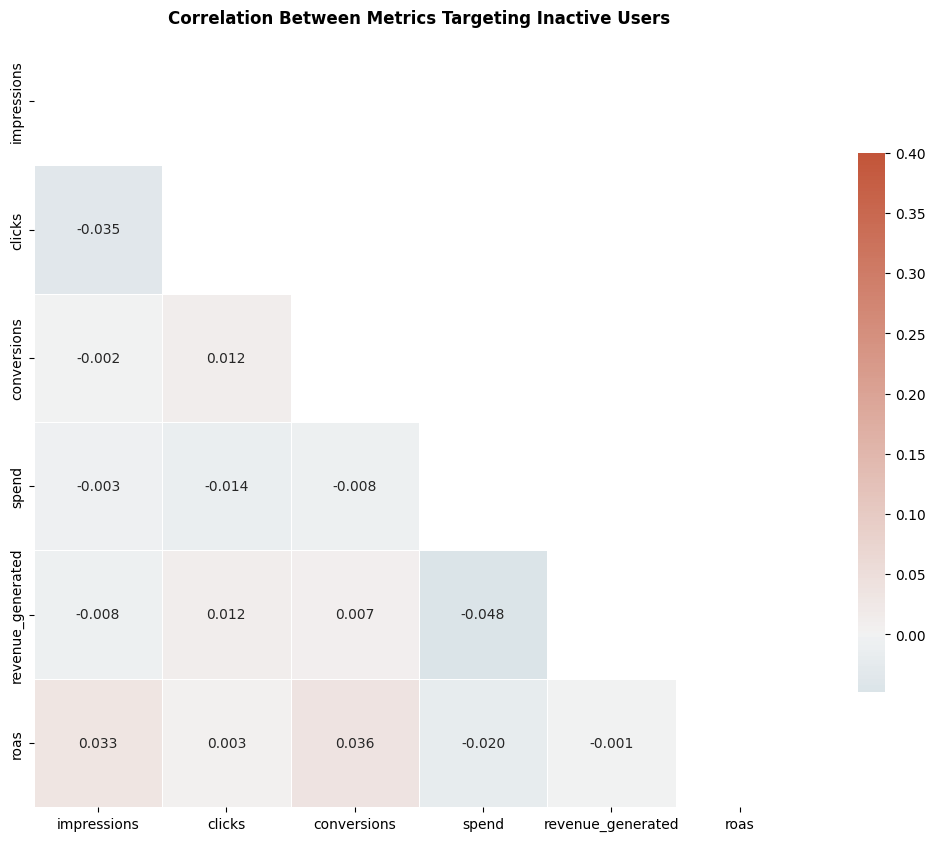

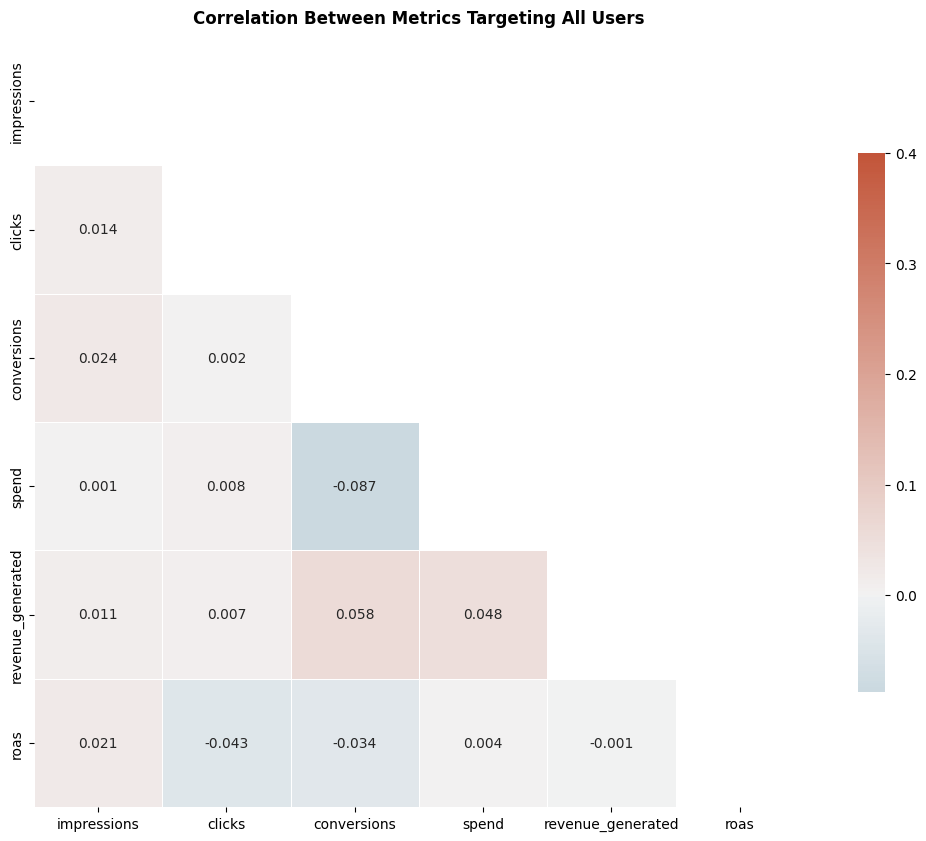

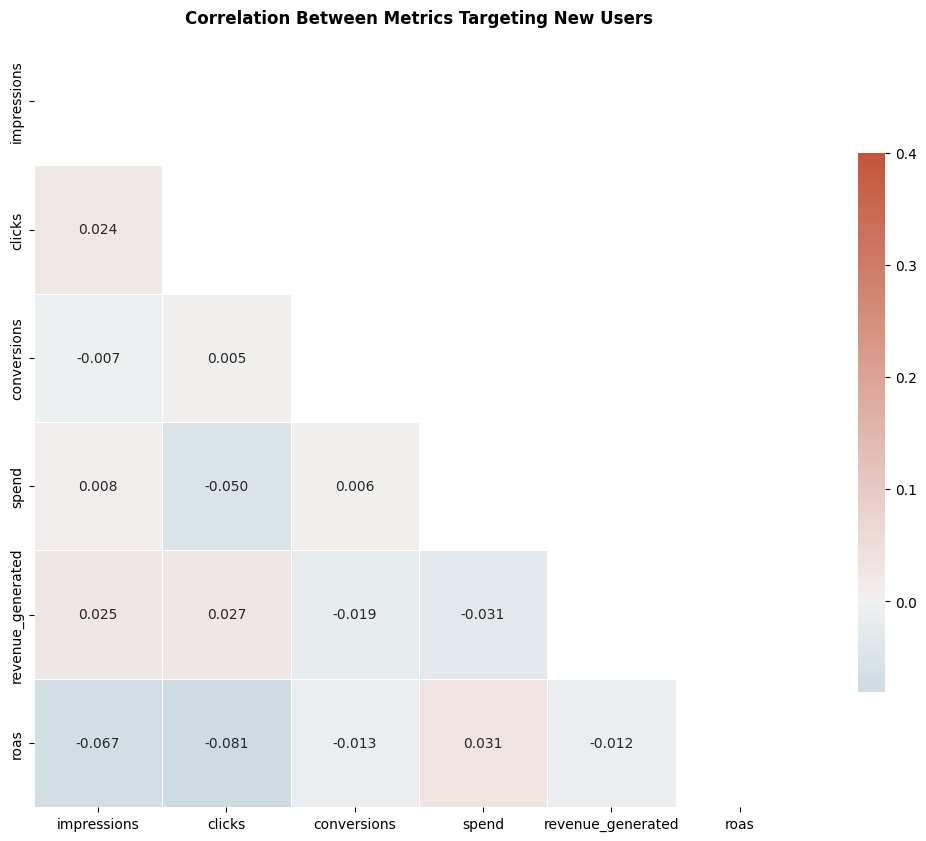

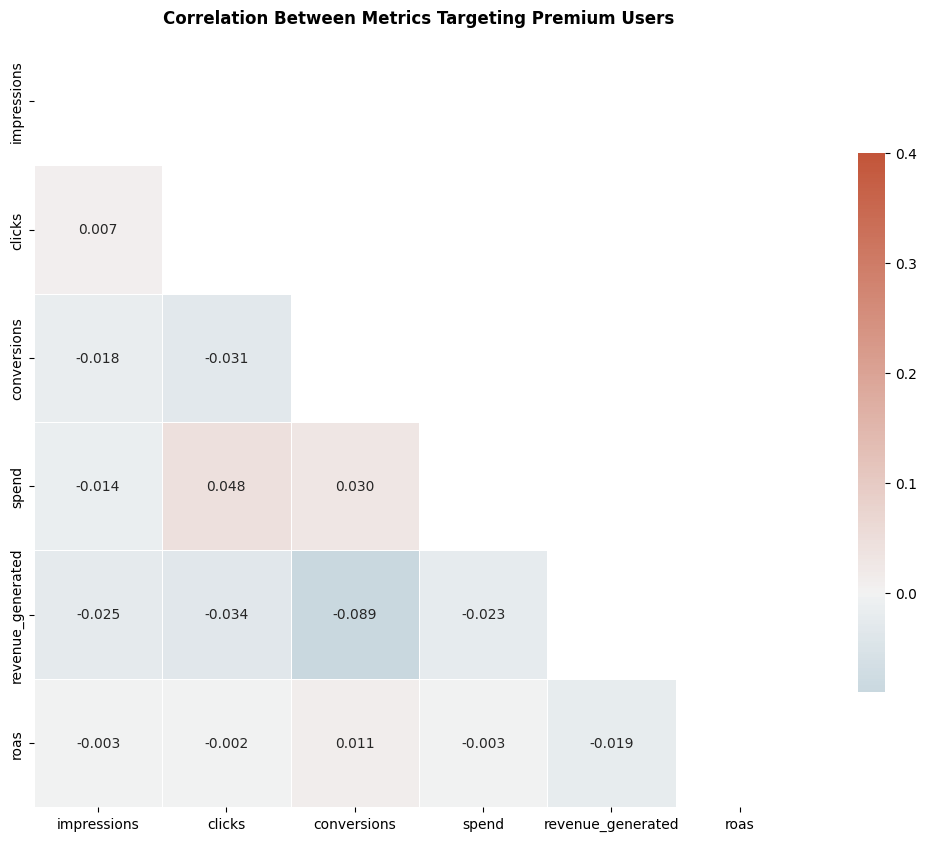

In [17]:
targets = {'All', 'Inactive', 'New Users', 'Premium'}

for target in targets:
    target_df = cor_df.loc[df['target_audience'] == target]
    numeric_df = target_df.select_dtypes(include='number')
    numeric_df = numeric_df.drop(['campaign_id', 'publish_month'], axis=1)
    corr_matrix = numeric_df.corr()
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
    f, ax = plt.subplots(figsize=(14, 10))
    cmap = sns.diverging_palette(230, 20, as_cmap=True)
    sns.heatmap(
        corr_matrix,
        mask=mask,
        cmap=cmap,
        vmax=0.4,
        center=0,
        square=True,
        linewidths=.5,
        cbar_kws={"shrink": .7},
        annot=True,
        fmt=".3f"
        )
    target = target.split()[0]
    plt.title(f'Correlation Between Metrics Targeting {target} Users', fontweight='bold', pad=10)

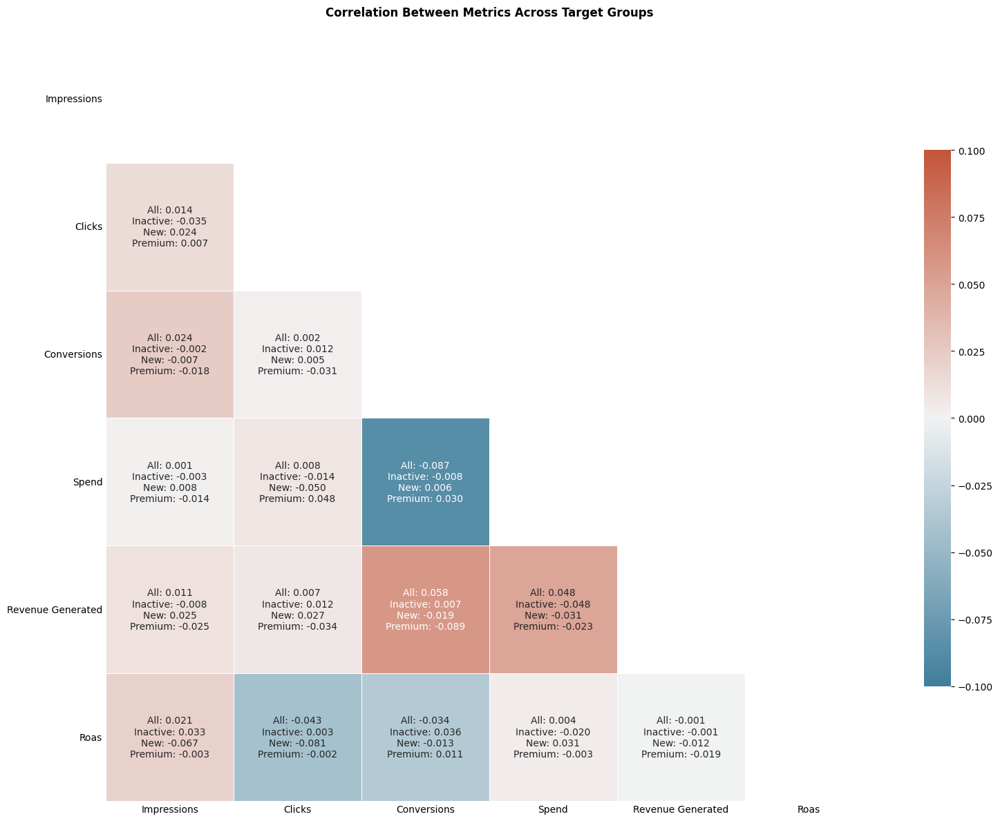

In [18]:
# First, calculate correlation matrices for each target group
targets = ['All', 'Inactive', 'New Users', 'Premium']
corr_matrices = {}

for target in targets:
    target_df = cor_df.loc[df['target_audience'] == target]
    numeric_df = target_df.select_dtypes(include='number')
    numeric_df = numeric_df.drop(['campaign_id', 'publish_month'], axis=1)
    corr_matrices[target] = numeric_df.corr()

# Get the structure from any correlation matrix
base_corr = list(corr_matrices.values())[0]
metrics = base_corr.columns

# Clean up metric names (remove underscores, capitalize)
def clean_metric_name(name):
    return name.replace('_', ' ').title()

# Create cleaned labels
clean_labels = [clean_metric_name(metric) for metric in metrics]
reference_corr = corr_matrices['All']

# Create the plot with LOWER triangle (left side)
mask = np.triu(np.ones_like(reference_corr, dtype=bool))  # Upper triangle + diagonal masked
f, ax = plt.subplots(figsize=(16, 12))
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Create annotation matrix for LOWER triangle
annot_matrix = np.empty_like(reference_corr, dtype=object)
for i in range(len(metrics)):
    for j in range(len(metrics)):
        if i > j:  # LOWER triangle only
            values = []
            for target in targets:
                val = corr_matrices[target].iloc[i, j]
                target_short = target.split()[0] if ' ' in target else target
                values.append(f"{target_short}: {val:.3f}")
            annot_matrix[i, j] = '\n'.join(values)
        else:
            annot_matrix[i, j] = ""

sns.heatmap(
    reference_corr,
    mask=mask,  # This now masks the upper triangle
    cmap=cmap,
    vmax=0.1,
    vmin=-0.1,
    center=0,
    square=True,
    linewidths=.5,
    cbar_kws={"shrink": .7},
    annot=annot_matrix,
    fmt='',  # Important: use empty format since using custom annotations
    annot_kws={'fontsize': 10},
    xticklabels=clean_labels,
    yticklabels=clean_labels
)
ax.tick_params(axis='both', length=0)
plt.yticks(rotation=0)
plt.title('Correlation Between Metrics Across Target Groups', fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

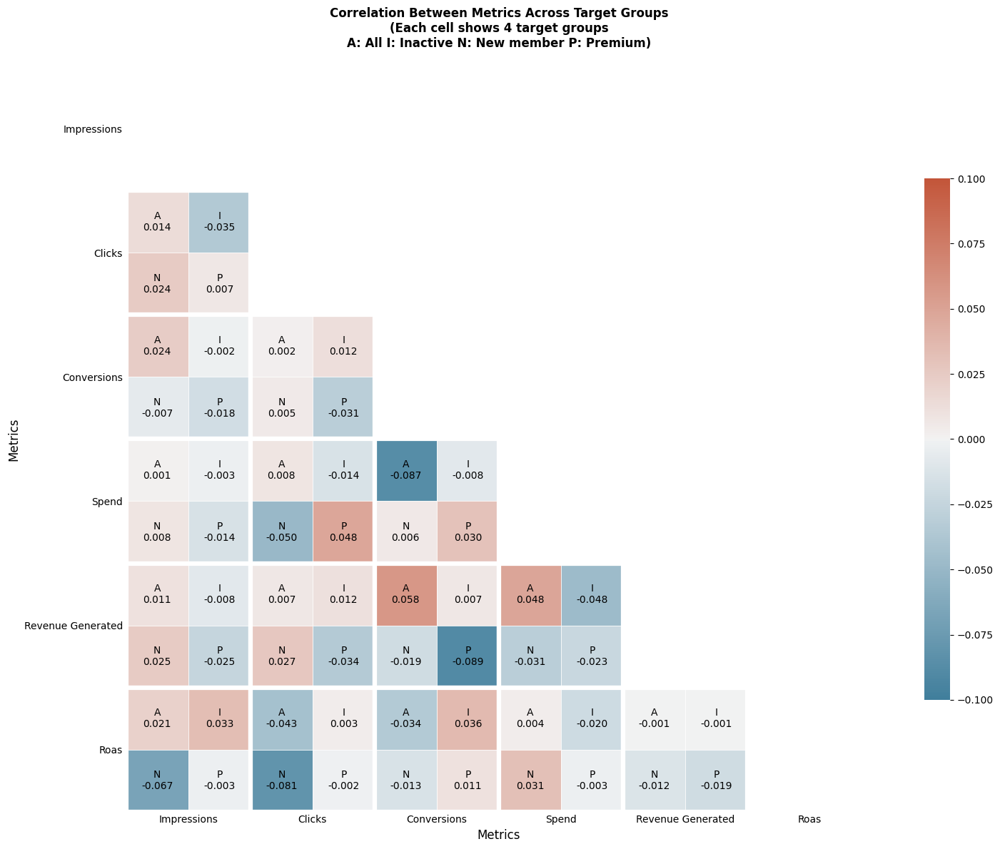

In [19]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.patches import Rectangle

# Calculate correlation matrices for each target group
targets = ['All', 'Inactive', 'New Users', 'Premium']
corr_matrices = {}

for target in targets:
    target_df = cor_df.loc[df['target_audience'] == target]
    numeric_df = target_df.select_dtypes(include='number')
    numeric_df = numeric_df.drop(['campaign_id', 'publish_month'], axis=1)
    corr_matrices[target] = numeric_df.corr()

base_corr = list(corr_matrices.values())[0]
metrics = base_corr.columns

# Clean up metric names
def clean_metric_name(name):
    return name.replace('_', ' ').title()

clean_labels = [clean_metric_name(metric) for metric in metrics]

# Create the plot
f, ax = plt.subplots(figsize=(16, 12))

# Define quadrant positions within each cell
# Each cell is 1x1, so quadrants are 0.5x0.5
quadrant_positions = [
    (0, 0.5),    # Top-left: All
    (0.5, 0.5),  # Top-right: Inactive
    (0, 0),      # Bottom-left: New Users
    (0.5, 0)     # Bottom-right: Premium
]

# Color map
cmap = sns.diverging_palette(230, 20, as_cmap=True)
norm = plt.Normalize(vmin=-0.1, vmax=0.1)

# Draw quadrants for each cell in lower triangle
for i in range(len(metrics)):
    for j in range(len(metrics)):
        if i > j:  # Lower triangle only
            for idx, (target, (dx, dy)) in enumerate(zip(targets, quadrant_positions)):
                corr_val = corr_matrices[target].iloc[i, j]
                color = cmap(norm(corr_val))

                # Create rectangle for this quadrant
                rect = Rectangle(
                    (j + dx, len(metrics) - 1 - i + dy),
                    0.5, 0.5,
                    facecolor=color,
                    edgecolor='white',
                    linewidth=0.5
                )
                ax.add_patch(rect)

                # Add text annotation
                target_short = target.split()[0] if ' ' in target else target
                ax.text(
                    j + dx + 0.25, len(metrics) - 1 - i + dy + 0.25,
                    f"{target_short[0]}\n{corr_val:.3f}",
                    ha='center', va='center',
                    fontsize=10
                )
            # Draw outer border for used cell (1x1 square)
            cell_x = j
            cell_y = len(metrics) - 1 - i
            border = Rectangle((cell_x, cell_y), 1, 1,
                               fill=False, edgecolor='white', linewidth=4.5)
            ax.add_patch(border)

# Set up the plot
ax.set_xlim(0, len(metrics))
ax.set_ylim(0, len(metrics))
ax.set_xticks(np.arange(len(metrics)) + 0.5)
ax.set_yticks(np.arange(len(metrics)) + 0.5)
ax.set_xticklabels(clean_labels, rotation=0)
ax.set_yticklabels(clean_labels[::-1])  # Reverse for proper order
ax.tick_params(axis='both', length=0)
ax.set_aspect('equal')

# Remove outer frame
for spine in ax.spines.values():
    spine.set_visible(False)

# Add colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, shrink=0.7)
cbar.outline.set_visible(False)

plt.title('Correlation Between Metrics Across Target Groups\n(Each cell shows 4 target groups\nA: All I: Inactive N: New member P: Premium)', fontweight='bold', pad=20)
plt.xlabel('Metrics', fontsize=12)
plt.ylabel('Metrics', fontsize=12)

plt.tight_layout()
plt.show()

### 3.2. Box Plot

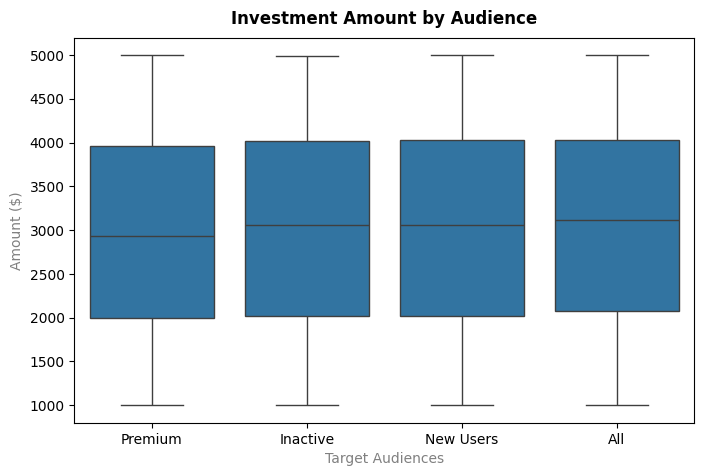

In [20]:
plt.figure(figsize=(8, 5))

sns.boxplot(x='target_audience', y='spend', data=df)

plt.title('Investment Amount by Audience', fontweight='bold', pad=10)
plt.xlabel('Target Audiences', fontsize=10, color='gray')
plt.ylabel('Amount ($)', fontsize=10, color='gray')

plt.show()

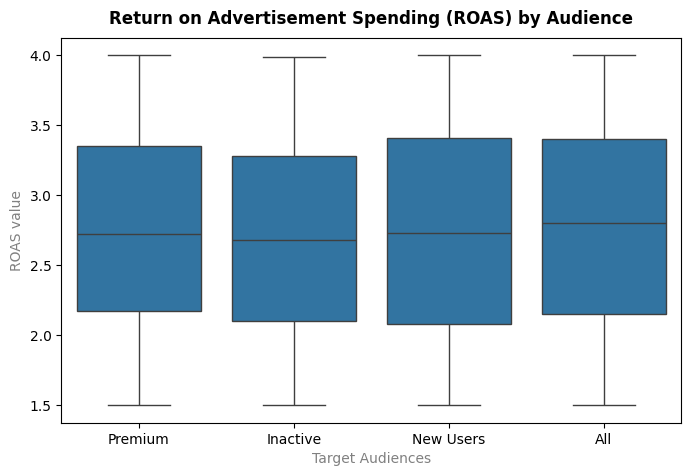

In [21]:
plt.figure(figsize=(8, 5))

sns.boxplot(x='target_audience', y='roas', data=df)

plt.title('Return on Advertisement Spending (ROAS) by Audience', fontweight='bold', pad=10)
plt.xlabel('Target Audiences', fontsize=10, color='gray')
plt.ylabel('ROAS value', fontsize=10, color='gray')

plt.show()

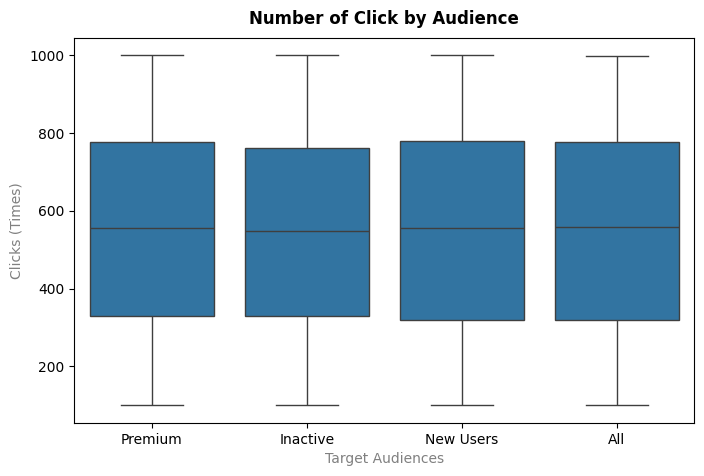

In [22]:
plt.figure(figsize=(8, 5))

sns.boxplot(x='target_audience', y='clicks', data=df)

plt.title('Number of Click by Audience', fontweight='bold', pad=10)
plt.xlabel('Target Audiences', fontsize=10, color='gray')
plt.ylabel('Clicks (Times)', fontsize=10, color='gray')

plt.show()

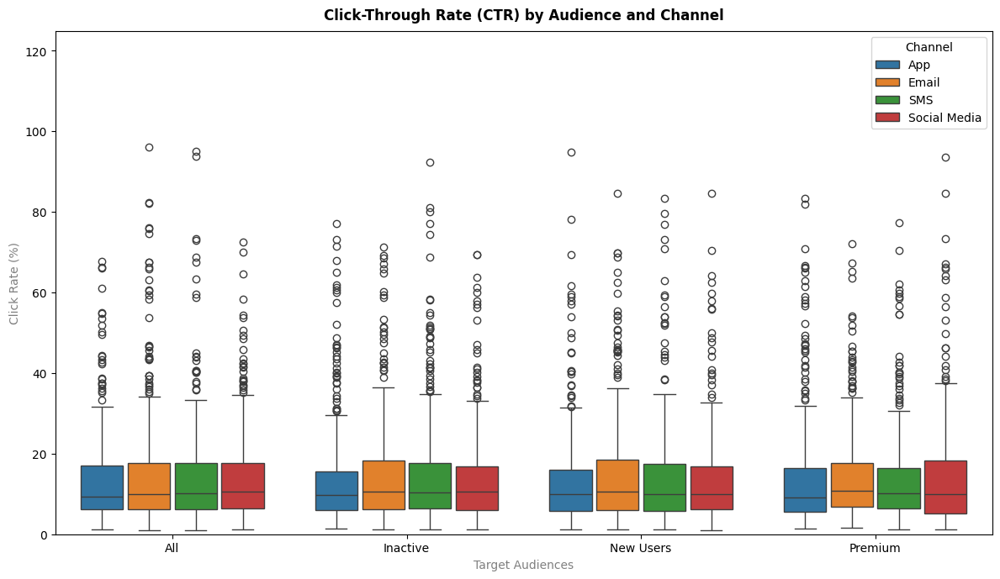

In [23]:
plt.figure(figsize=(12, 7))

df['ctr'] = df['clicks'] / df['impressions'] * 100
max_rate = df['ctr'].max()
sorted_audiences = sorted(df['target_audience'].unique())
sns.boxplot(x='target_audience', y='ctr', data=df, hue='channel', gap=.1, order=sorted_audiences)

plt.title('Click-Through Rate (CTR) by Audience and Channel', fontweight='bold', pad=10)
plt.xlabel('Target Audiences', fontsize=10, color='gray')
plt.ylabel('Click Rate (%)', fontsize=10, color='gray')
plt.legend(title='Channel', loc='upper right')
plt.ylim(0, max_rate * 1.3)
plt.tight_layout()
plt.show()

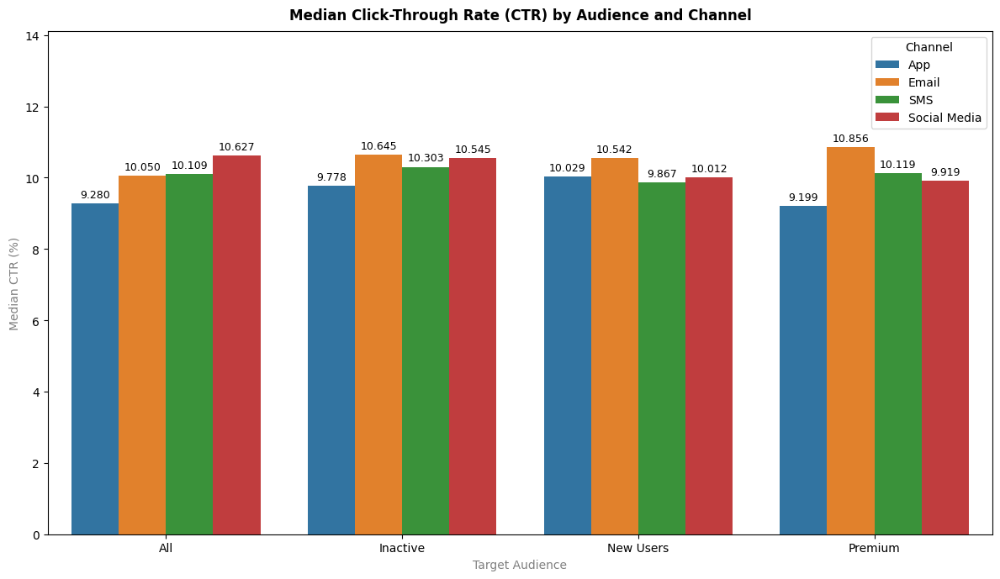

In [24]:
grouped_ctr = df.groupby(['target_audience', 'channel'])['ctr'].median().reset_index()

plt.figure(figsize=(12, 7))
barplot = sns.barplot(data=grouped_ctr, x='target_audience', y='ctr', hue='channel')

for container in barplot.containers:
    barplot.bar_label(container, fmt='%.3f', label_type='edge', fontsize=9, padding=3)


plt.title('Median Click-Through Rate (CTR) by Audience and Channel', fontweight='bold', pad=10)
plt.xlabel('Target Audience', fontsize=10, color='gray')
plt.ylabel('Median CTR (%)', fontsize=10, color='gray')
plt.ylim(0, grouped_ctr['ctr'].max() * 1.3)
plt.legend(title='Channel', loc='upper right')
plt.tight_layout()
plt.show()

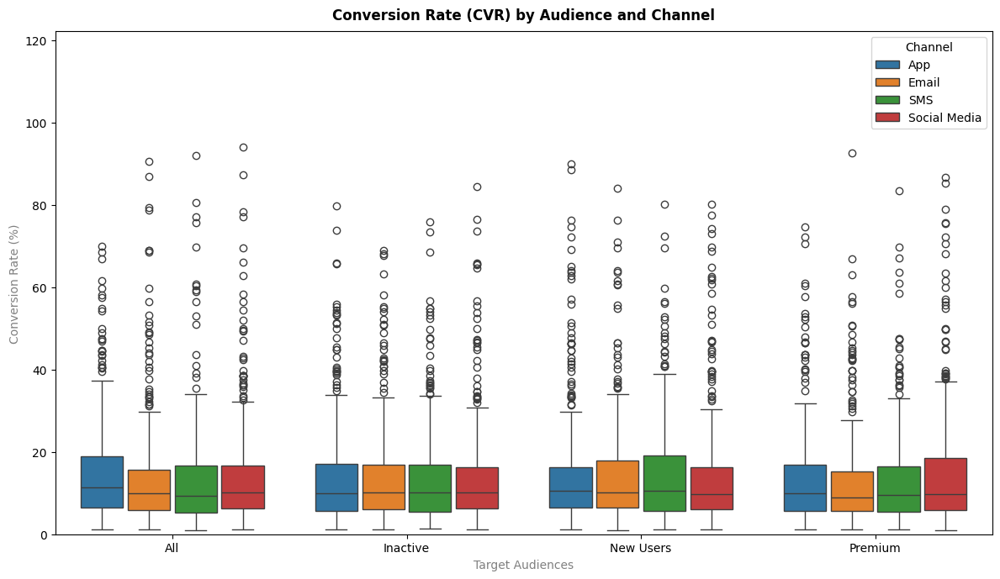

In [25]:
plt.figure(figsize=(12, 7))

df['conversion_rate'] = df['conversions'] / df['clicks'] * 100
min_rate = df['conversion_rate'].min()
max_rate = df['conversion_rate'].max()
sorted_audiences = sorted(df['target_audience'].unique())

sns.boxplot(x='target_audience', y='conversion_rate', data=df, hue='channel', gap=.1, order=sorted_audiences)

plt.title('Conversion Rate (CVR) by Audience and Channel', fontweight='bold', pad=10)
plt.xlabel('Target Audiences', fontsize=10, color='gray')
plt.ylabel('Conversion Rate (%)', fontsize=10, color='gray')
plt.ylim(0, max_rate * 1.3)
plt.legend(title='Channel', loc='upper right')
plt.tight_layout()
plt.show()

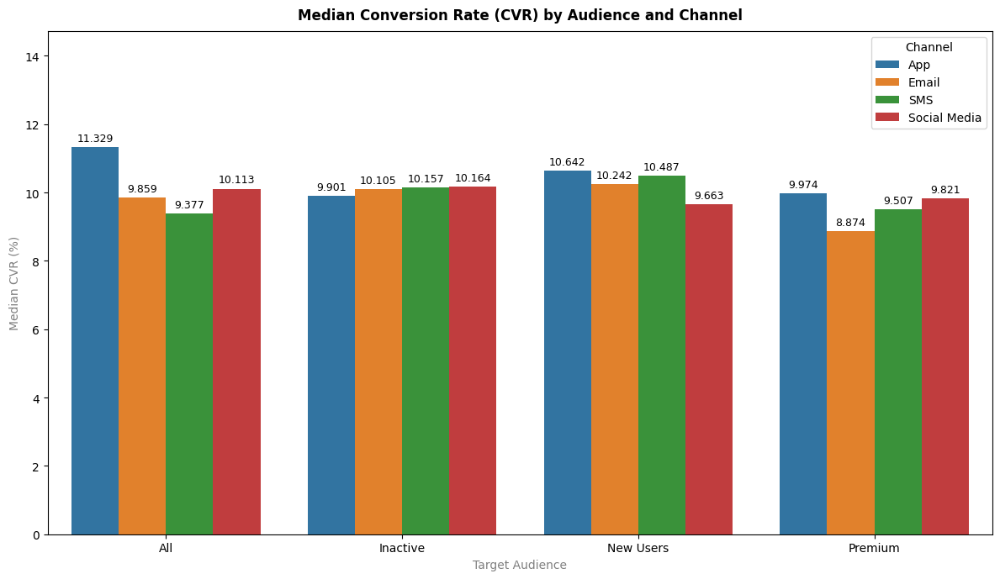

In [26]:
grouped_cvr = df.groupby(['target_audience', 'channel'])['conversion_rate'].median().reset_index()

plt.figure(figsize=(12, 7))
barplot = sns.barplot(data=grouped_cvr, x='target_audience', y='conversion_rate', hue='channel')

for container in barplot.containers:
    barplot.bar_label(container, fmt='%.3f', label_type='edge', fontsize=9, padding=3)


plt.title('Median Conversion Rate (CVR) by Audience and Channel', fontweight='bold', pad=10)
plt.xlabel('Target Audience', fontsize=10, color='gray')
plt.ylabel('Median CVR (%)', fontsize=10, color='gray')
plt.ylim(0, grouped_cvr['conversion_rate'].max() * 1.3)
plt.legend(title='Channel', loc='upper right')
plt.tight_layout()
plt.show()

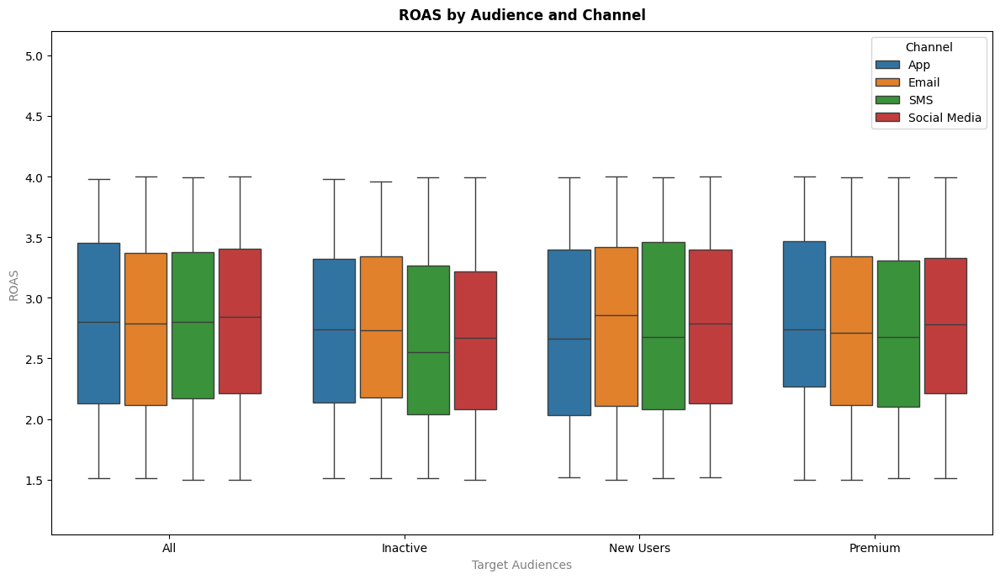

In [27]:
plt.figure(figsize=(12, 7))
min_rate = df['roas'].min()
max_rate = df['roas'].max()
sorted_audiences = sorted(df['target_audience'].unique())
sns.boxplot(x='target_audience', y='roas', data=df, hue='channel', gap=.1, order=sorted_audiences)

plt.title('ROAS by Audience and Channel', fontweight='bold', pad=10)
plt.xlabel('Target Audiences', fontsize=10, color='gray')
plt.ylabel('ROAS', fontsize=10, color='gray')
plt.ylim(min_rate*0.7, max_rate * 1.3)
plt.legend(title='Channel', loc='upper right')
plt.tight_layout()
plt.show()

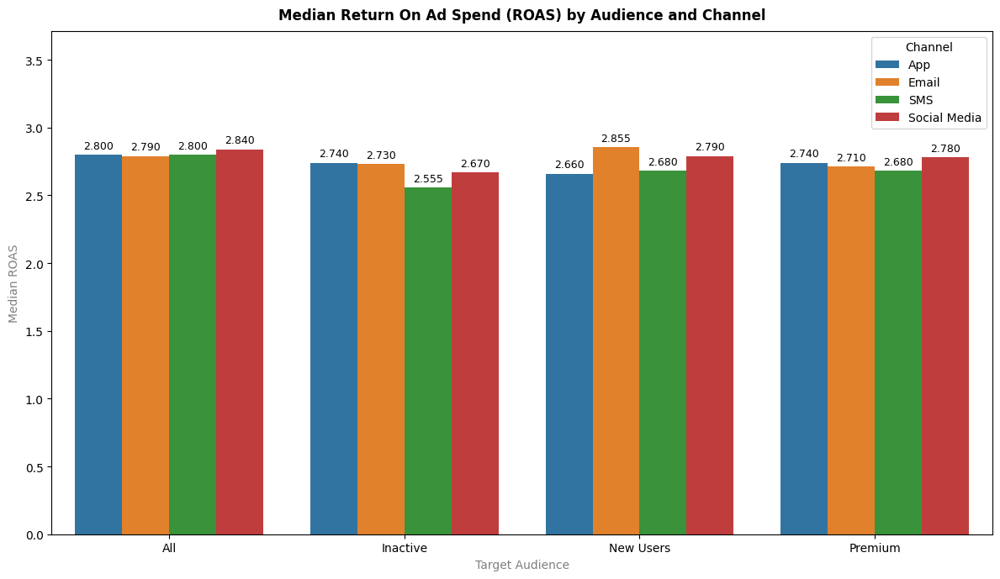

In [28]:
grouped_roas = df.groupby(['target_audience', 'channel'])['roas'].median().reset_index()

plt.figure(figsize=(12, 7))
barplot = sns.barplot(data=grouped_roas, x='target_audience', y='roas', hue='channel')

for container in barplot.containers:
    barplot.bar_label(container, fmt='%.3f', label_type='edge', fontsize=9, padding=3)


plt.title('Median Return On Ad Spend (ROAS) by Audience and Channel', fontweight='bold', pad=10)
plt.xlabel('Target Audience', fontsize=10, color='gray')
plt.ylabel('Median ROAS', fontsize=10, color='gray')
plt.ylim(0, grouped_roas['roas'].max() * 1.3)
plt.legend(title='Channel', loc='upper right')
plt.tight_layout()
plt.show()

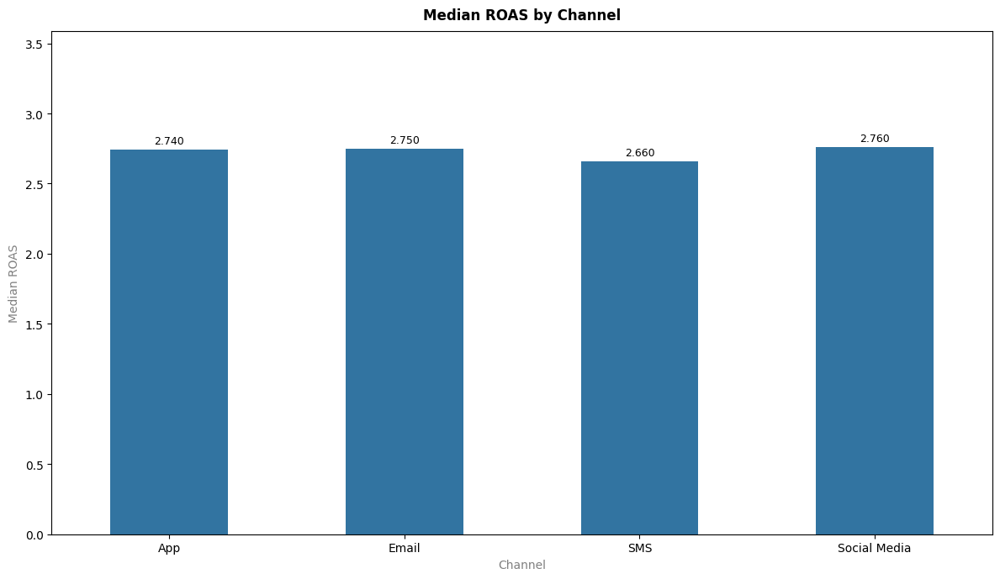

In [29]:
grouped_roas = df.groupby('channel')['roas'].median().reset_index()

plt.figure(figsize=(12, 7))
barplot = sns.barplot(data=grouped_roas, x='channel', y='roas', width=0.5)

for container in barplot.containers:
    barplot.bar_label(container, fmt='%.3f', label_type='edge', fontsize=9, padding=3)

plt.title('Median ROAS by Channel', fontweight='bold', pad=10)
plt.xlabel('Channel', fontsize=10, color='gray')
plt.ylabel('Median ROAS', fontsize=10, color='gray')
plt.ylim(0, grouped_roas['roas'].max() * 1.3)

# Remove legend (only one metric is shown)
barplot.get_legend().remove() if barplot.get_legend() else None

plt.tight_layout()
plt.show()

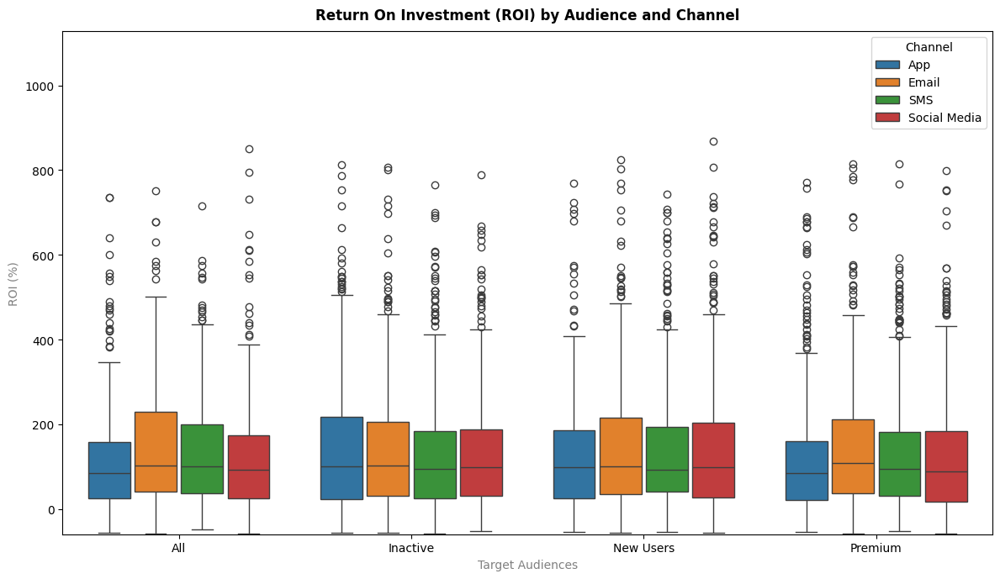

In [30]:
plt.figure(figsize=(12, 7))

df['roi'] = (df['revenue_generated'] - df['spend']) * 100/ df['spend']
min_rate = df['roi'].min()
max_rate = df['roi'].max()
sorted_audiences = sorted(df['target_audience'].unique())

sns.boxplot(x='target_audience', y='roi', data=df, hue='channel', gap=.1, order=sorted_audiences)

plt.title('Return On Investment (ROI) by Audience and Channel', fontweight='bold', pad=10)
plt.xlabel('Target Audiences', fontsize=10, color='gray')
plt.ylabel('ROI (%)', fontsize=10, color='gray')
plt.ylim(min_rate - (0.5), max_rate * 1.3)
plt.legend(title='Channel', loc='upper right')
plt.tight_layout()
plt.show()

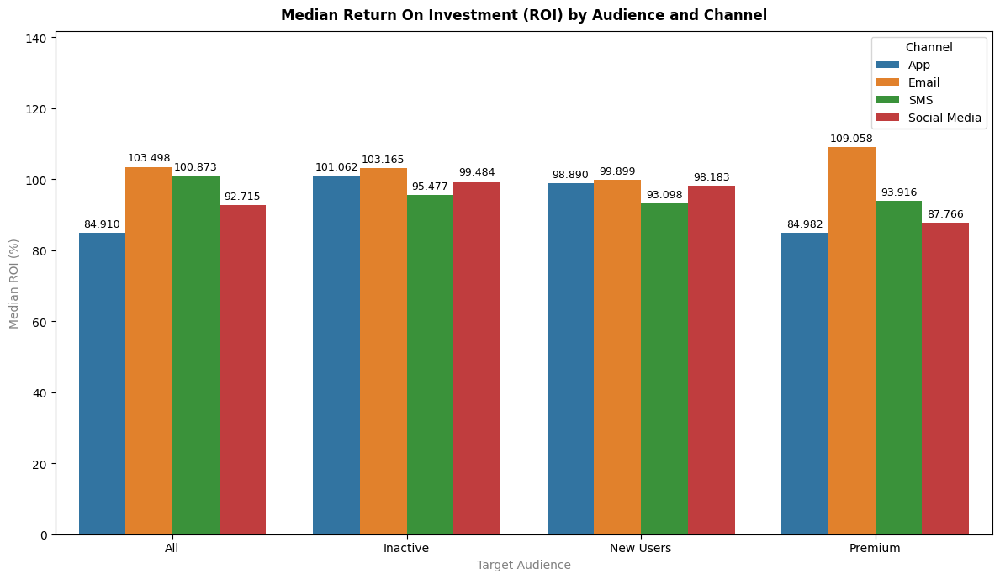

In [31]:
grouped_roi = df.groupby(['target_audience', 'channel'])['roi'].median().reset_index()

plt.figure(figsize=(12, 7))
barplot = sns.barplot(data=grouped_roi, x='target_audience', y='roi', hue='channel')

for container in barplot.containers:
    barplot.bar_label(container, fmt='%.3f', label_type='edge', fontsize=9, padding=3)


plt.title('Median Return On Investment (ROI) by Audience and Channel', fontweight='bold', pad=10)
plt.xlabel('Target Audience', fontsize=10, color='gray')
plt.ylabel('Median ROI (%)', fontsize=10, color='gray')
plt.ylim(0, grouped_roi['roi'].max() * 1.3)
plt.legend(title='Channel', loc='upper right')
plt.tight_layout()
plt.show()

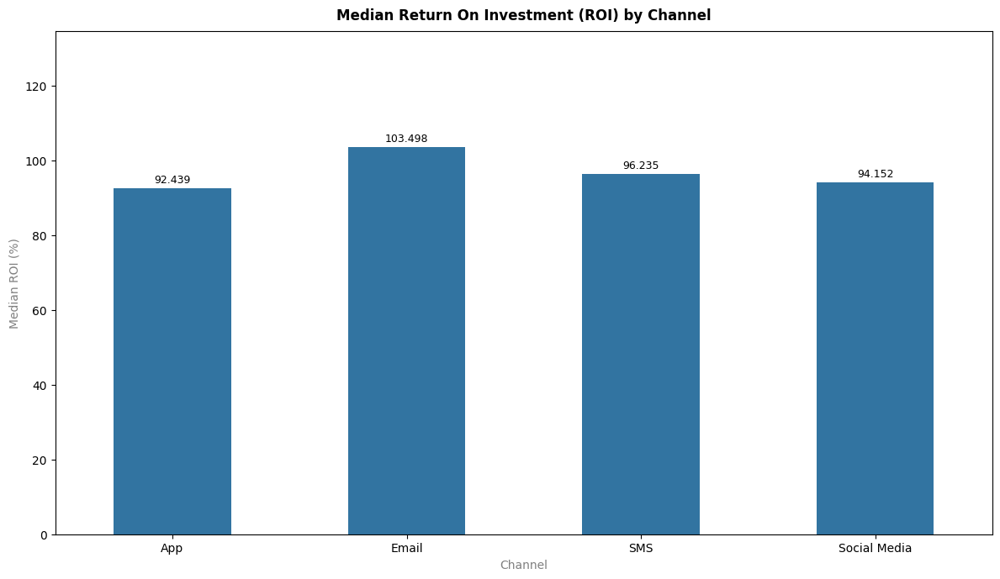

In [32]:
grouped_roi = df.groupby('channel')['roi'].median().reset_index()

plt.figure(figsize=(12, 7))
barplot = sns.barplot(data=grouped_roi, x='channel', y='roi', width=0.5)

for container in barplot.containers:
    barplot.bar_label(container, fmt='%.3f', label_type='edge', fontsize=9, padding=3)

plt.title('Median Return On Investment (ROI) by Channel', fontweight='bold', pad=10)
plt.xlabel('Channel', fontsize=10, color='gray')
plt.ylabel('Median ROI (%)', fontsize=10, color='gray')
plt.ylim(0, grouped_roi['roi'].max() * 1.3)

# Remove legend (only one metric is shown)
barplot.get_legend().remove() if barplot.get_legend() else None

plt.tight_layout()
plt.show()

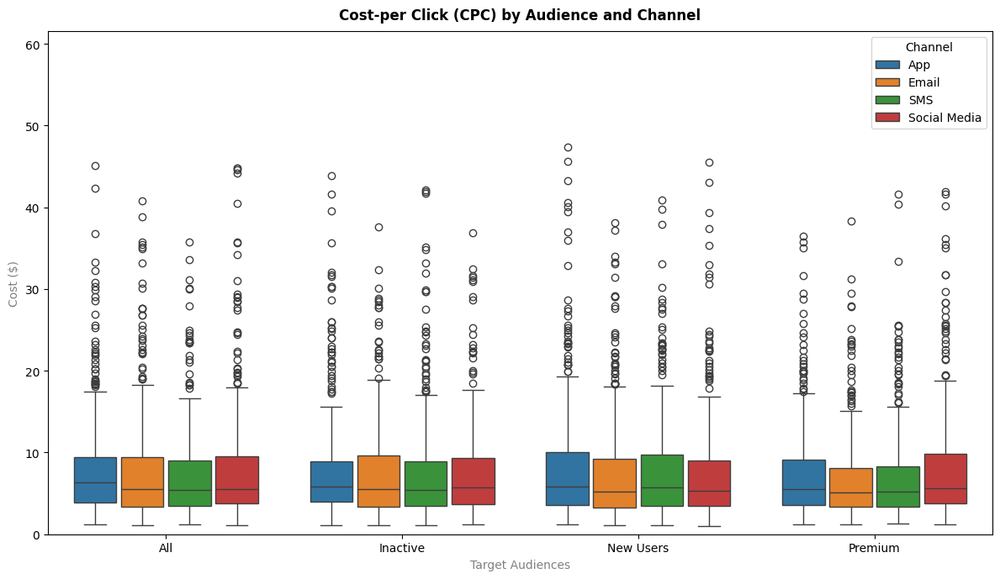

In [33]:
plt.figure(figsize=(12, 7))

df['cpc'] = df['spend'] / df['clicks']
min_rate = df['cpc'].min()
max_rate = df['cpc'].max()
sorted_audiences = sorted(df['target_audience'].unique())
sns.boxplot(x='target_audience', y='cpc', data=df, hue='channel', gap=.1, order=sorted_audiences)

plt.title('Cost-per Click (CPC) by Audience and Channel', fontweight='bold', pad=10)
plt.xlabel('Target Audiences', fontsize=10, color='gray')
plt.ylabel('Cost ($)', fontsize=10, color='gray')
plt.ylim(0, max_rate * 1.3)
plt.legend(title='Channel', loc='upper right')
plt.tight_layout()
plt.show()

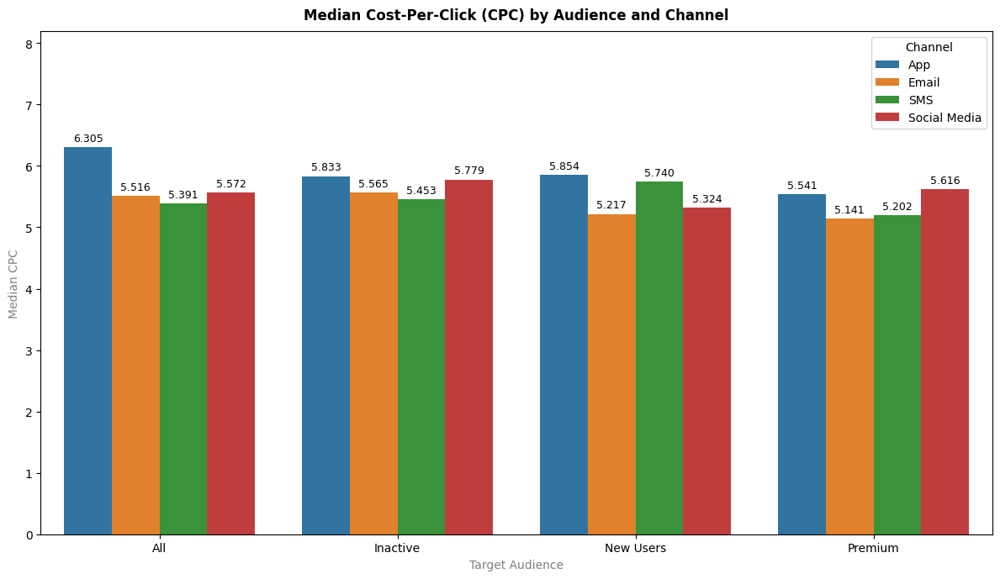

In [34]:
grouped_cpc = df.groupby(['target_audience', 'channel'])['cpc'].median().reset_index()

plt.figure(figsize=(12, 7))
barplot = sns.barplot(data=grouped_cpc, x='target_audience', y='cpc', hue='channel')

for container in barplot.containers:
    barplot.bar_label(container, fmt='%.3f', label_type='edge', fontsize=9, padding=3)


plt.title('Median Cost-Per-Click (CPC) by Audience and Channel', fontweight='bold', pad=10)
plt.xlabel('Target Audience', fontsize=10, color='gray')
plt.ylabel('Median CPC', fontsize=10, color='gray')
plt.ylim(0, grouped_cpc['cpc'].max() * 1.3)
plt.legend(title='Channel', loc='upper right')
plt.tight_layout()
plt.show()

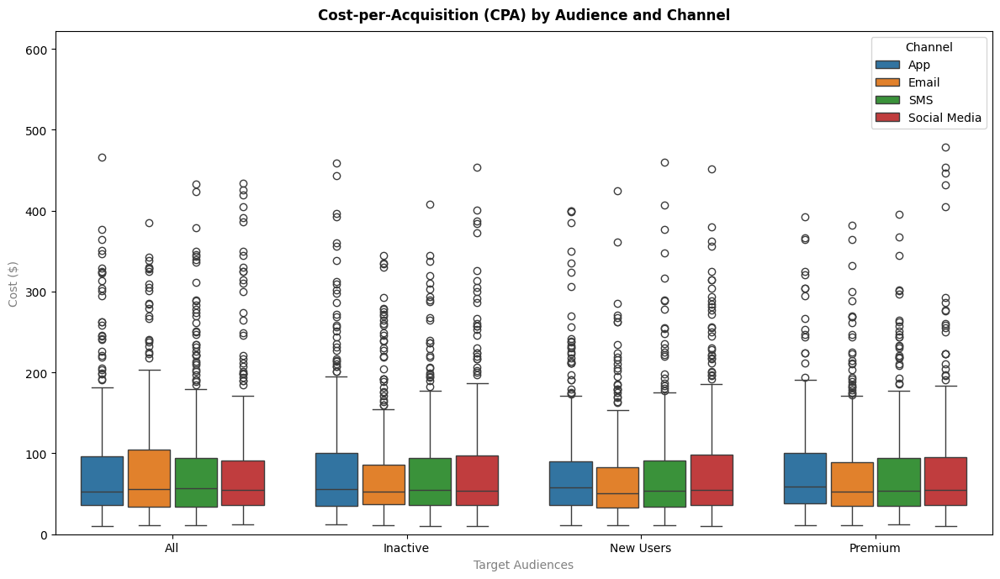

In [35]:
plt.figure(figsize=(12, 7))

df['cost_per_conversion'] = df['spend'] / df['conversions']
min_rate = df['cost_per_conversion'].min()
max_rate = df['cost_per_conversion'].max()
sorted_audiences = sorted(df['target_audience'].unique())
sns.boxplot(x='target_audience', y='cost_per_conversion', data=df, hue='channel', gap=.1, order=sorted_audiences)

plt.title('Cost-per-Acquisition (CPA) by Audience and Channel', fontweight='bold', pad=10)
plt.xlabel('Target Audiences', fontsize=10, color='gray')
plt.ylabel('Cost ($)', fontsize=10, color='gray')
plt.ylim(0, max_rate * 1.3)
plt.legend(title='Channel', loc='upper right')
plt.tight_layout()
plt.show()

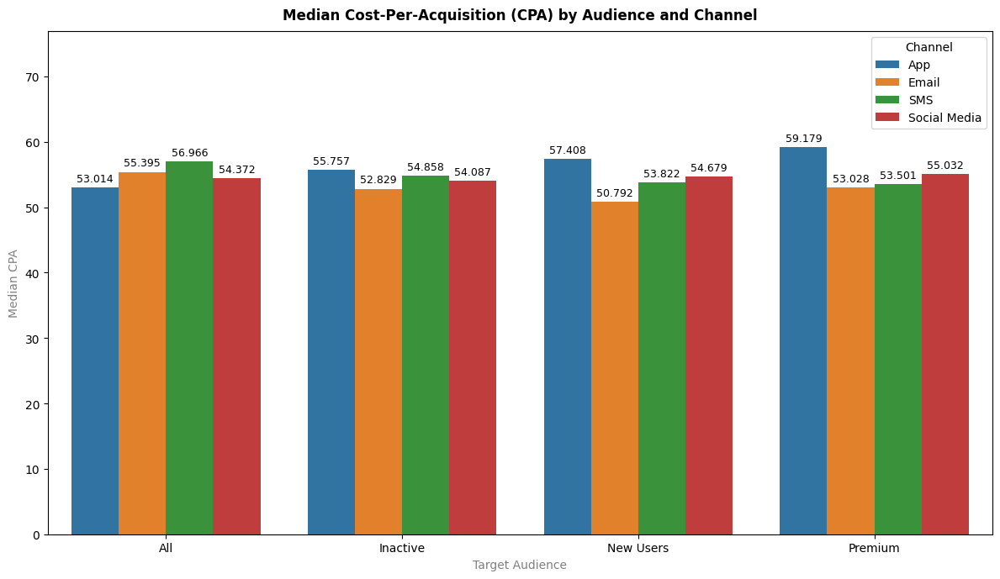

In [36]:
grouped_cpa = df.groupby(['target_audience', 'channel'])['cost_per_conversion'].median().reset_index()

plt.figure(figsize=(12, 7))
barplot = sns.barplot(data=grouped_cpa, x='target_audience', y='cost_per_conversion', hue='channel')

for container in barplot.containers:
    barplot.bar_label(container, fmt='%.3f', label_type='edge', fontsize=9, padding=3)


plt.title('Median Cost-Per-Acquisition (CPA) by Audience and Channel', fontweight='bold', pad=10)
plt.xlabel('Target Audience', fontsize=10, color='gray')
plt.ylabel('Median CPA', fontsize=10, color='gray')
plt.ylim(0, grouped_cpa['cost_per_conversion'].max() * 1.3)
plt.legend(title='Channel', loc='upper right')
plt.tight_layout()
plt.show()

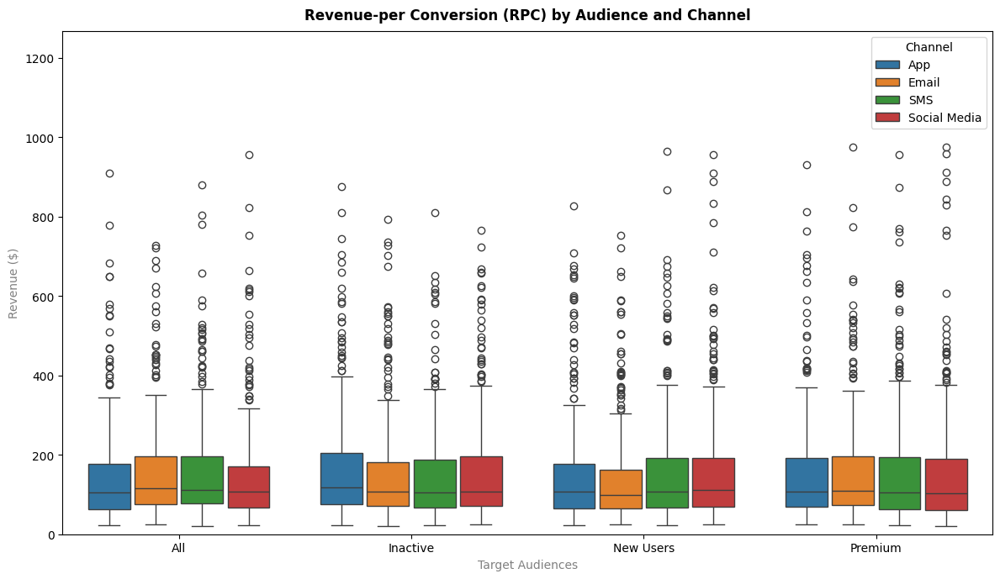

In [37]:
plt.figure(figsize=(12, 7))

df['revenue_per_conversion'] = df['revenue_generated'] / df['conversions']
min_rate = df['revenue_per_conversion'].min()
max_rate = df['revenue_per_conversion'].max()
sorted_audiences = sorted(df['target_audience'].unique())
sns.boxplot(x='target_audience', y='revenue_per_conversion', data=df, hue='channel', gap=.1, order=sorted_audiences)

plt.title('Revenue-per Conversion (RPC) by Audience and Channel', fontweight='bold', pad=10)
plt.xlabel('Target Audiences', fontsize=10, color='gray')
plt.ylabel('Revenue ($)', fontsize=10, color='gray')
plt.ylim(0, max_rate * 1.3)
plt.legend(title='Channel', loc='upper right')
plt.tight_layout()
plt.show()

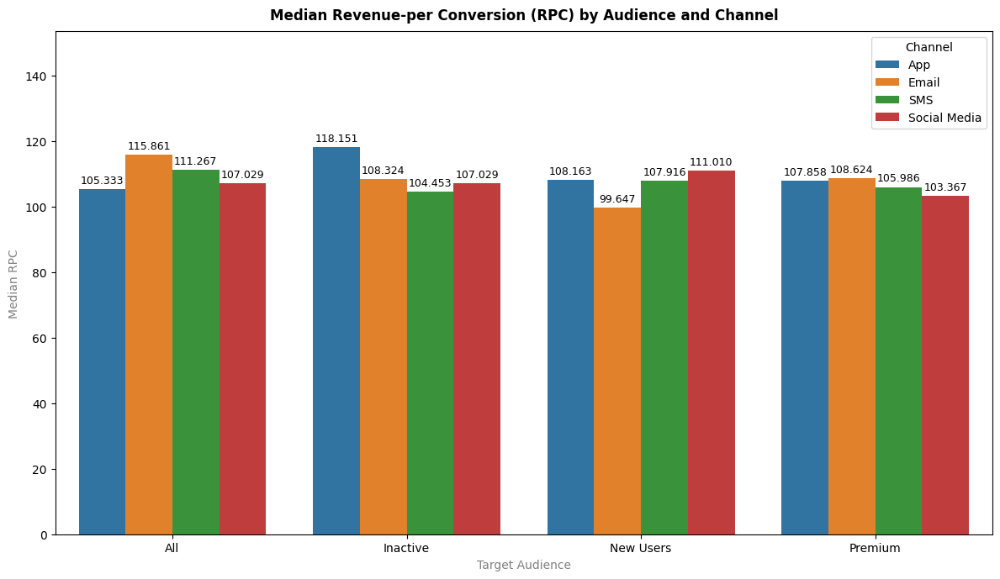

In [38]:
grouped_rpc = df.groupby(['target_audience', 'channel'])['revenue_per_conversion'].median().reset_index()

plt.figure(figsize=(12, 7))
barplot = sns.barplot(data=grouped_rpc, x='target_audience', y='revenue_per_conversion', hue='channel')

for container in barplot.containers:
    barplot.bar_label(container, fmt='%.3f', label_type='edge', fontsize=9, padding=3)


plt.title('Median Revenue-per Conversion (RPC) by Audience and Channel', fontweight='bold', pad=10)
plt.xlabel('Target Audience', fontsize=10, color='gray')
plt.ylabel('Median RPC', fontsize=10, color='gray')
plt.ylim(0, grouped_rpc['revenue_per_conversion'].max() * 1.3)
plt.legend(title='Channel', loc='upper right')
plt.tight_layout()
plt.show()

In [39]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5400 entries, 0 to 5399
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   campaign_id             5400 non-null   int64         
 1   campaign_name           5400 non-null   object        
 2   date                    5400 non-null   datetime64[ns]
 3   publish_day             5400 non-null   object        
 4   publish_month           5400 non-null   int32         
 5   target_audience         5400 non-null   object        
 6   channel                 5400 non-null   object        
 7   impressions             5400 non-null   int64         
 8   clicks                  5400 non-null   int64         
 9   conversions             5400 non-null   int64         
 10  spend                   5400 non-null   float64       
 11  revenue_generated       5400 non-null   float64       
 12  roas                    5400 non-null   float64 

### 3.3 Performance metric and correlations

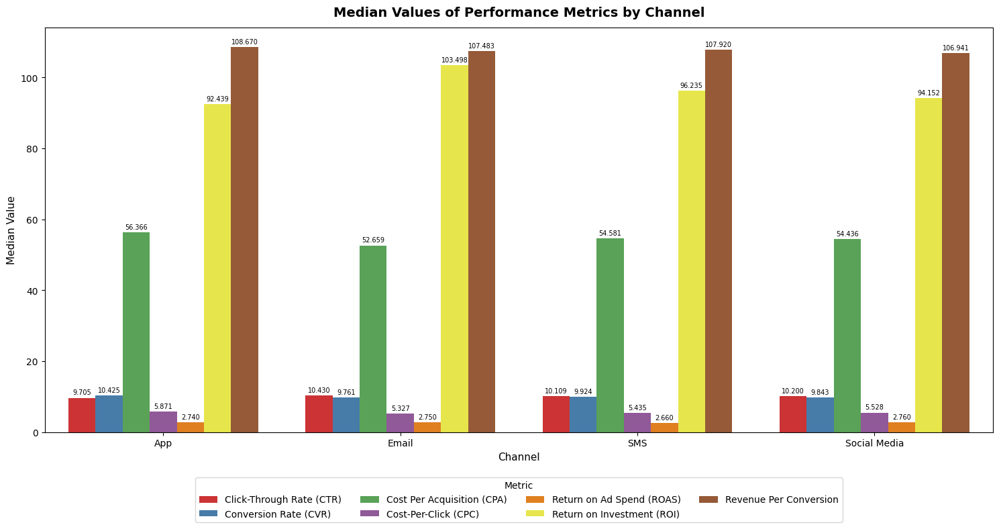

In [40]:
metric_name_map = {
    'ctr': 'Click-Through Rate (CTR)',
    'cpc': 'Cost-Per-Click (CPC)',
    'conversion_rate': 'Conversion Rate (CVR)',
    'cost_per_conversion': 'Cost Per Acquisition (CPA)',
    'revenue_per_conversion': 'Revenue Per Conversion',
    'roas': 'Return on Ad Spend (ROAS)',
    'roi': 'Return on Investment (ROI)'
}

# Step 1: List of metric columns (raw names in df)
metrics = list(metric_name_map.keys())

# Step 2: Melt to long format
df_melted = df.melt(id_vars='channel', value_vars=metrics, var_name='metric', value_name='value')

# Step 3: Map metric names to readable names
df_melted['metric'] = df_melted['metric'].map(metric_name_map)

# Step 4: Group by channel and display name to get median
grouped = df_melted.groupby(['channel', 'metric'])['value'].median().reset_index()

# Step 5: Plotting
plt.figure(figsize=(15, 8))
barplot = sns.barplot(data=grouped, x='channel', y='value', hue='metric', palette='Set1')

# Add labels
for container in barplot.containers:
    barplot.bar_label(container, fmt='%.3f', label_type='edge', fontsize=7, padding=2)

# Titles and axis formatting
plt.title('Median Values of Performance Metrics by Channel', fontsize=14, fontweight='bold', pad=12)
plt.xlabel('Channel', fontsize=11)
plt.ylabel('Median Value', fontsize=11)
plt.legend(
    title='Metric',
    loc='upper center',
    bbox_to_anchor=(0.5, -0.1),
    ncol=4,
    frameon=True
)

plt.tight_layout()
plt.show()


Text(0.5, 1.0, 'Correlation between metrics')

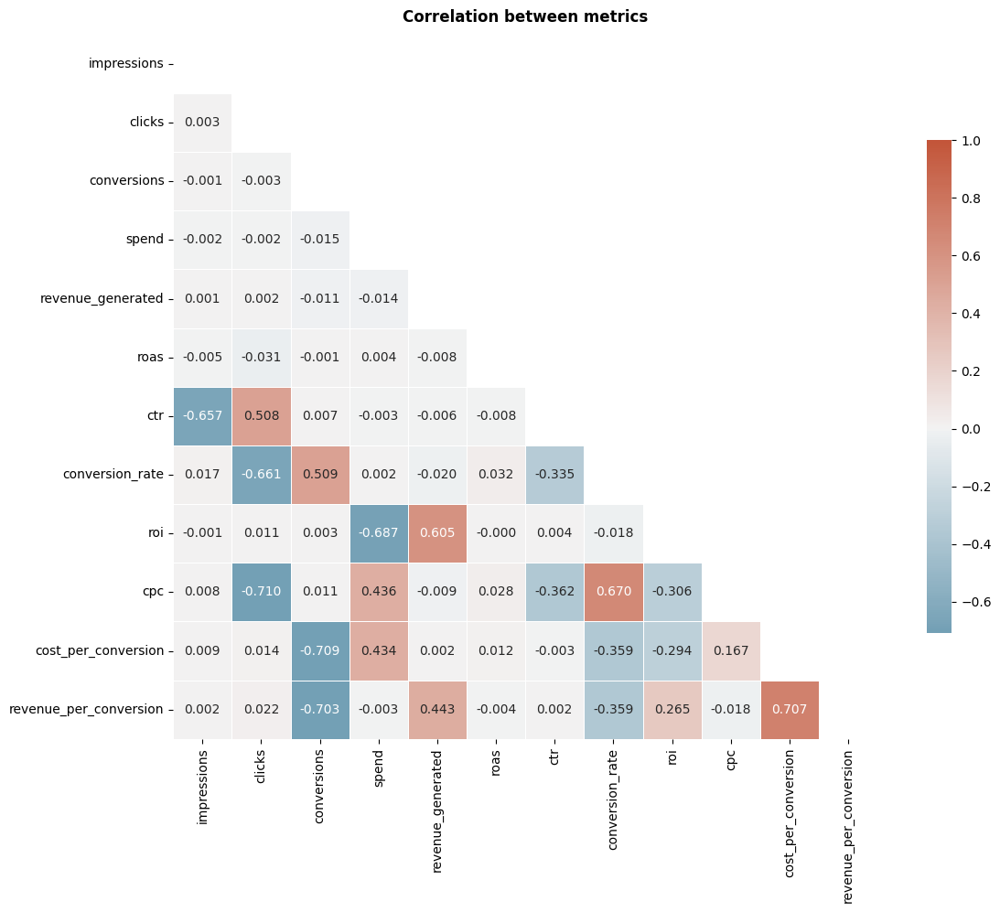

In [41]:
numeric_df = df.select_dtypes(include='number')
numeric_df = numeric_df.drop(['campaign_id', 'publish_month'], axis=1)
corr_matrix = numeric_df.corr()
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
f, ax = plt.subplots(figsize=(14, 10))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(
    corr_matrix,
    mask=mask,
    cmap=cmap,
    vmax=1,
    center=0,
    square=True,
    linewidths=.5,
    cbar_kws={"shrink": .7},
    annot=True,
    fmt=".3f"
    )
plt.title('Correlation between metrics', fontweight='bold', pad=10)

# 4. Segmentation Analysis

### 4.1 Performance by audience groups

In [42]:
audience_performance = df.groupby(['target_audience', 'channel']).agg({
    'campaign_id': 'count',
    'roas': 'mean',
    'roi': 'median',
    'ctr': 'median',
    'conversion_rate': 'median',
    'cost_per_conversion': 'median',
    'spend': ['mean', 'sum'],
    'revenue_generated': ['mean', 'sum'],
}).round(3)

audience_performance.rename(columns={'campaign_id': 'frequency'}, level=0, inplace=True)

audience_performance[('profit', 'sum')] = (audience_performance[('revenue_generated', 'sum')] - audience_performance[('spend', 'sum')]).round(3)

audience_performance

frequency   roas      roi     ctr  \
                                 count   mean   median  median   
target_audience channel                                          
All             App                355  2.767   84.910   9.280   
                Email              343  2.754  103.498  10.050   
                SMS                310  2.752  100.873  10.109   
                Social Media       334  2.793   92.715  10.627   
Inactive        App                363  2.732  101.062   9.778   
                Email              325  2.748  103.165  10.645   
                SMS                342  2.648   95.477  10.303   
                Social Media       317  2.673   99.484  10.545   
New Users       App                350  2.726   98.890  10.029   
                Email              328  2.778   99.899  10.542   
                SMS                333  2.746   93.098   9.867   
                Social Media       345  2.765   98.183  10.012   
Premium         App                306  2.799   84.982   9.199   
                Email              347  2.717  109.058  10.856   
                SMS                355  2.700   93.916  10.119   
                Social Media       347  2.761   87.766   9.919   

                             conversion_rate cost_per_conversion     spend  \
                                      median              median      mean   
target_audience channel                                                      
All             App                   11.329              53.014  3168.203   
                Email                  9.859              55.395  3003.416   
                SMS                    9.377              56.966  2937.737   
                Social Media          10.113              54.372  3127.921   
Inactive        App                    9.901              55.757  3025.790   
                Email                 10.105              52.829  3019.063   
                SMS                   10.157              54.858  3031.649   
                Social Media          10.164              54.087  3031.213   
New Users       App                   10.642              57.408  3067.626   
                Email                 10.242              50.792  2958.788   
                SMS                   10.487              53.822  3003.264   
                Social Media           9.663              54.679  3008.913   
Premium         App                    9.974              59.179  2995.542   
                Email                  8.874              53.028  2926.911   
                SMS                    9.507              53.501  2960.559   
                Social Media           9.821              55.032  3073.974   

                                         revenue_generated              \
                                     sum              mean         sum   
target_audience channel                                                  
All             App           1124712.11          5769.861  2048300.57   
                Email         1030171.63          6166.708  2115181.01   
                SMS            910698.39          5935.589  1840032.73   
                Social Media  1044725.47          5913.545  1975123.98   
Inactive        App           1098361.94          6069.604  2203266.15   
                Email          981195.58          6127.077  1991300.12   
                SMS           1036823.79          5872.374  2008352.02   
                Social Media   960894.55          6002.753  1902872.72   
New Users       App           1073668.99          5912.662  2069431.60   
                Email          970482.57          6041.406  1981581.28   
                SMS           1000086.88          6032.213  2008727.05   
                Social Media  1038074.93          6036.982  2082758.95   
Premium         App            916635.71          5732.066  1754012.17   
                Email         1015638.26          6055.531  2101269.17   
                SMS           105

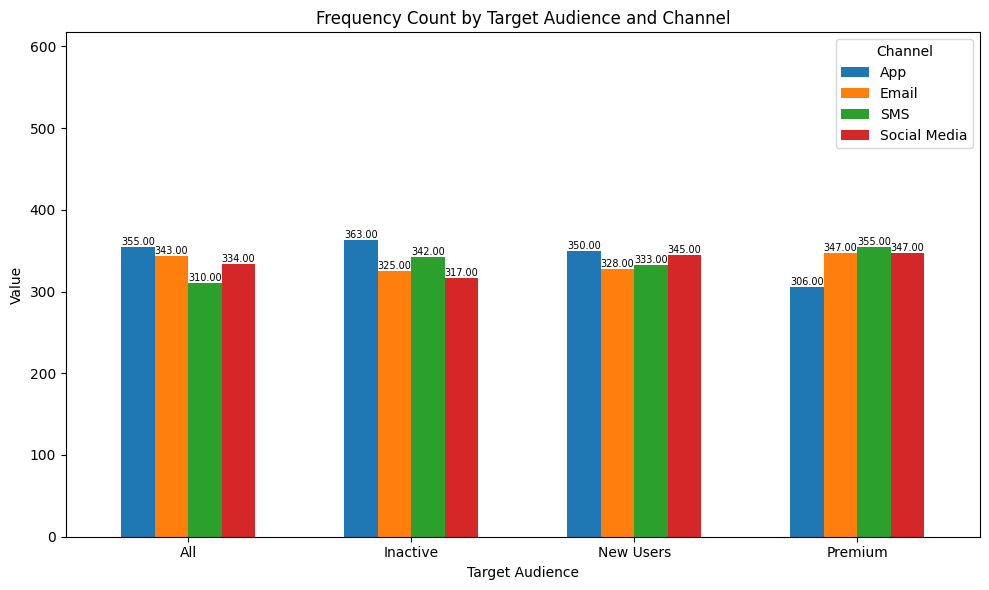

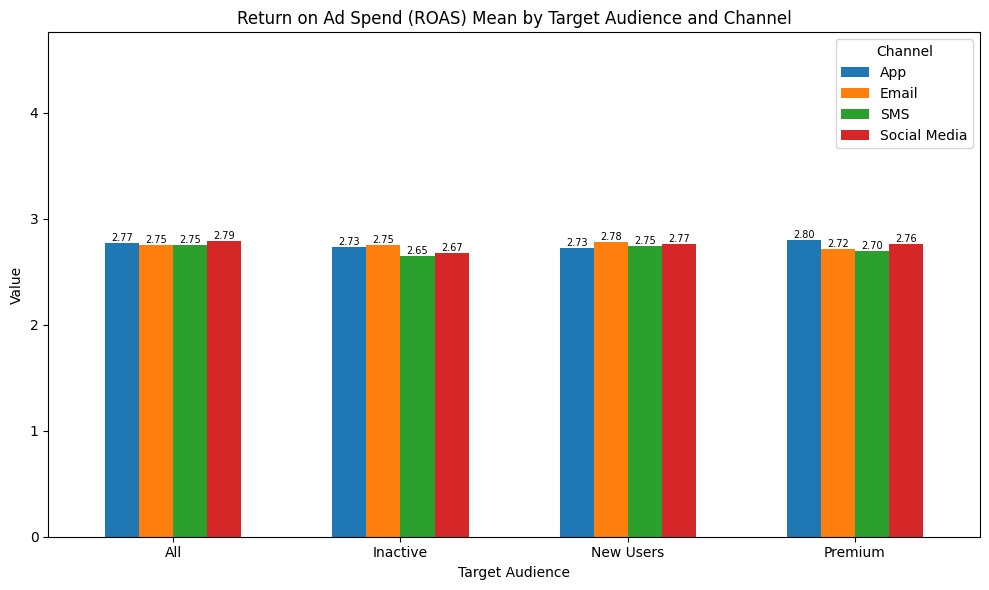

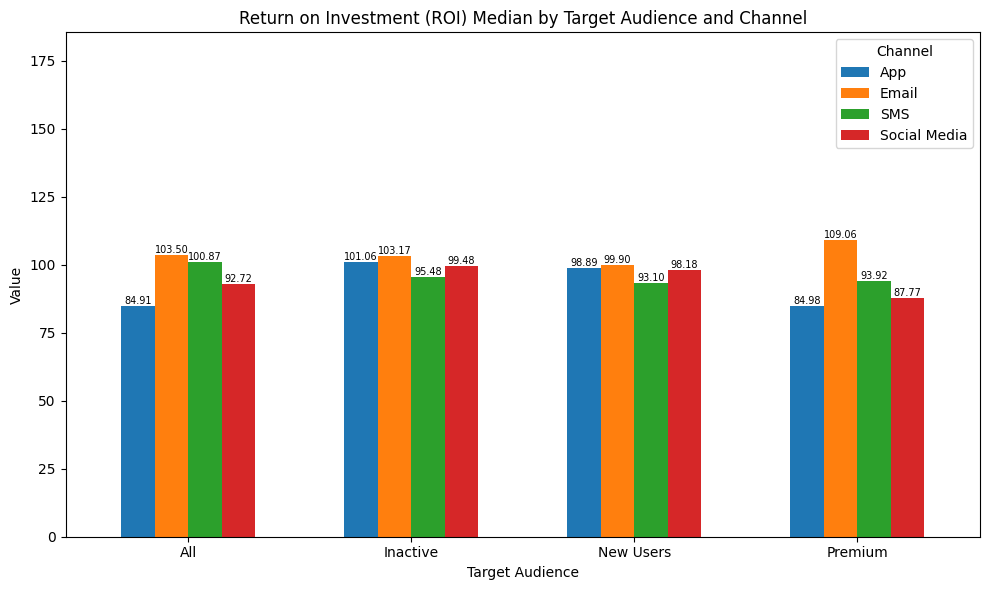

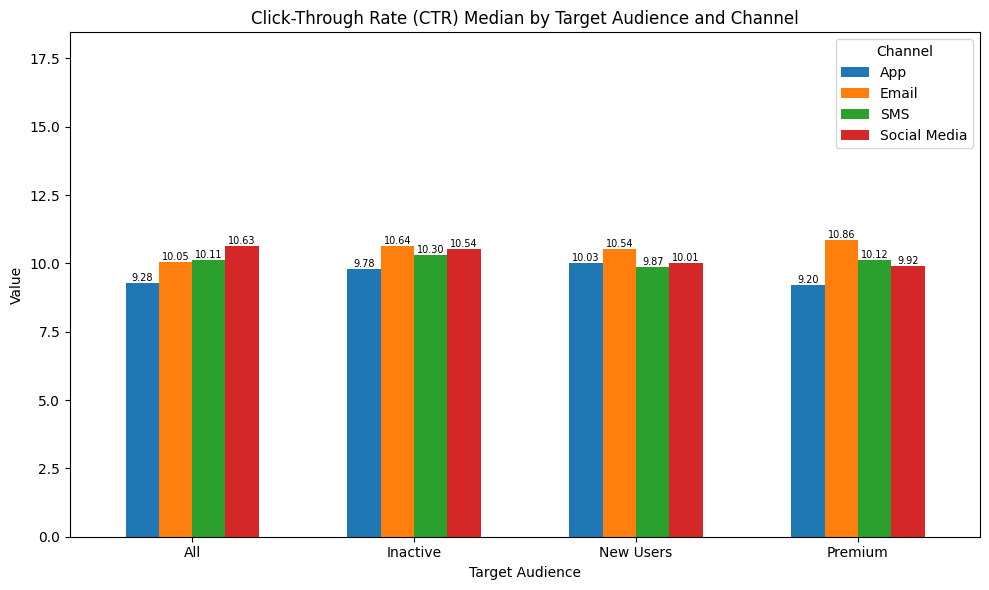

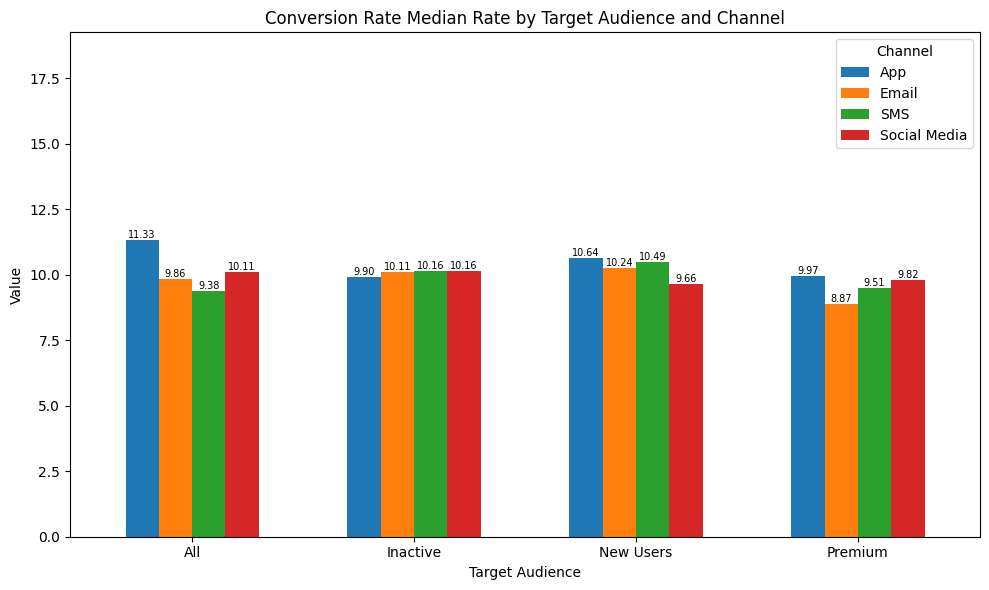

...

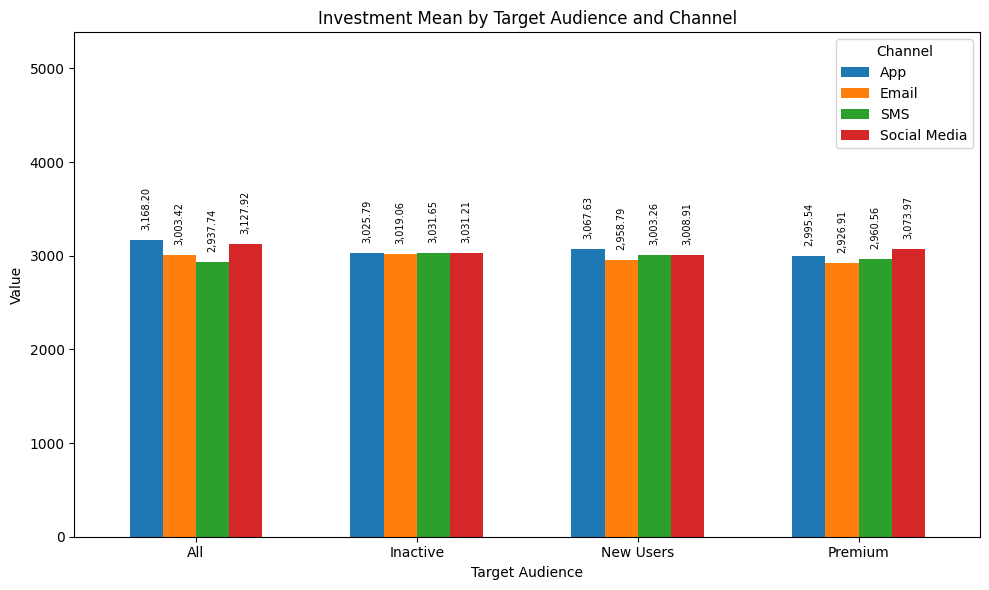

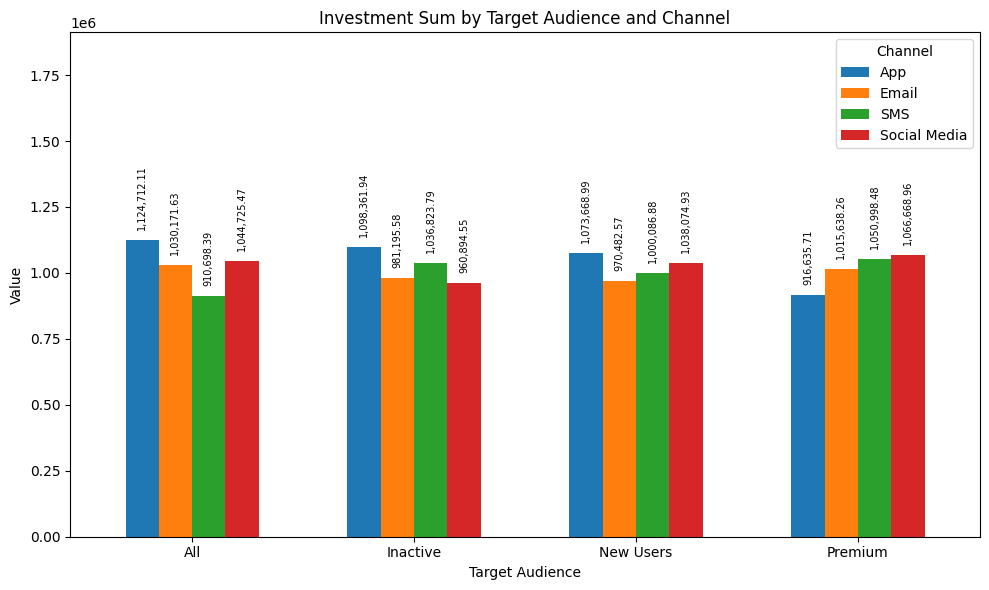

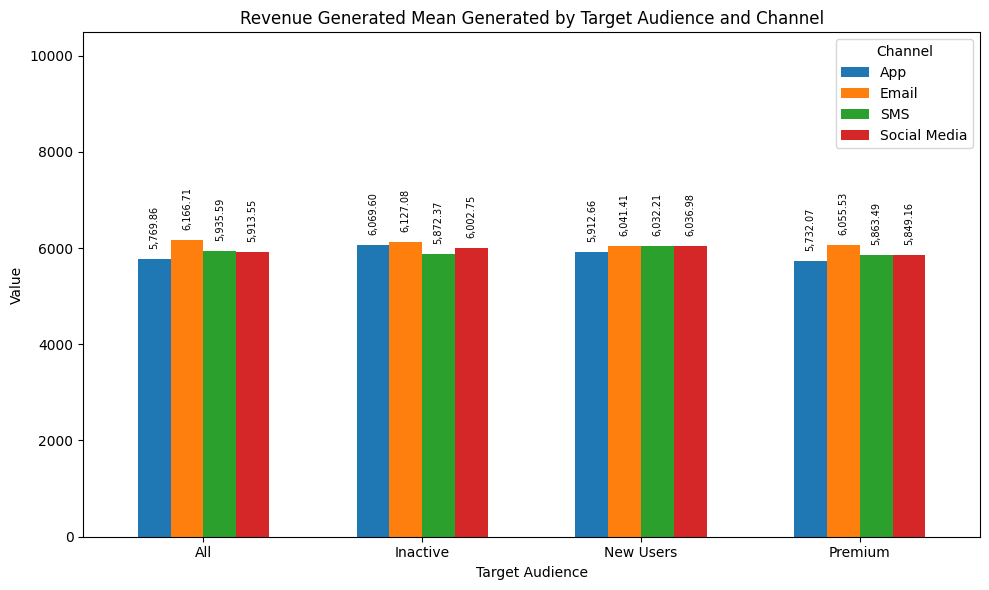

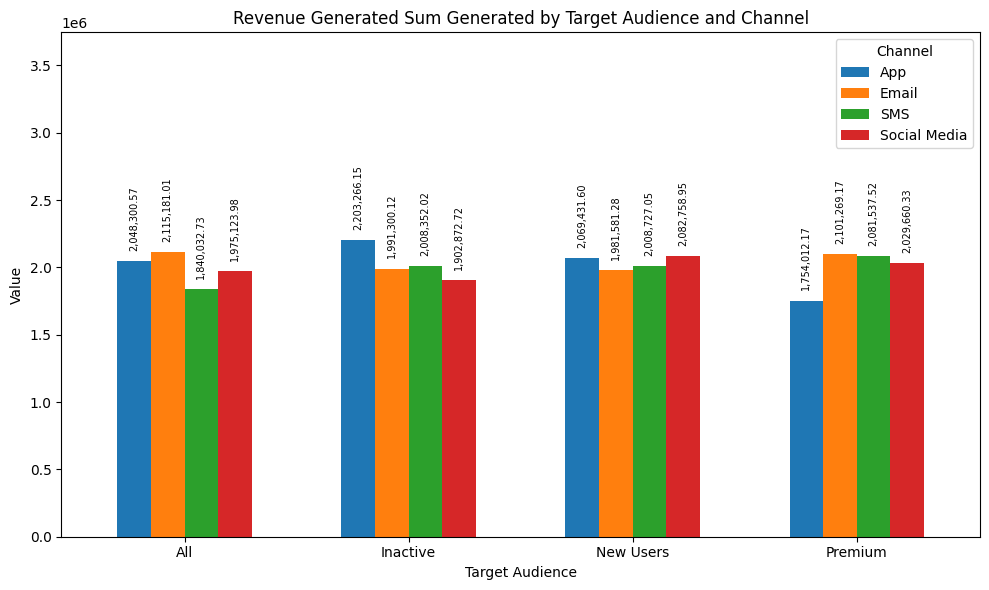

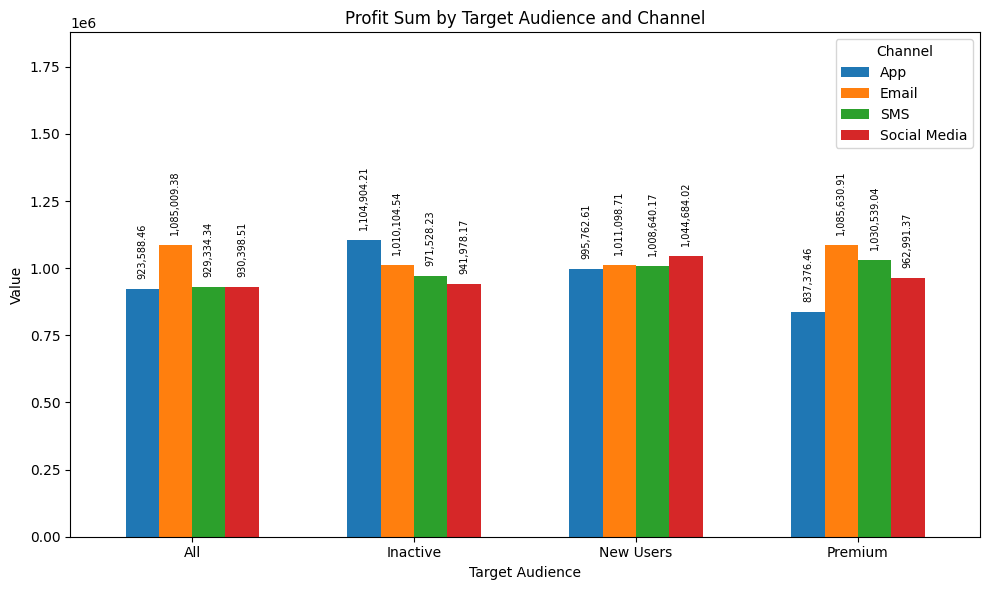

In [43]:
audience_performance = df.groupby(['target_audience', 'channel']).agg({
    'campaign_id': 'count',
    'roas': 'mean',
    'roi': 'median',
    'ctr': 'median',
    'conversion_rate': 'median',
    'cost_per_conversion': 'median',
    'spend': ['mean', 'sum'],
    'revenue_generated': ['mean', 'sum']
}).round(3)

metric_name_map = {
    'ctr': 'Click-Through Rate (CTR)',
    'cpc': 'Cost-Per-Click (CPC)',
    'conversion_rate': 'Conversion Rate (CVR)',
    'cost_per_conversion': 'Cost Per Acquisition (CPA)',
    'frequency': 'Frequency',
    'profit': 'Profit',
    'revenue_generated': 'Revenue Generated',
    'revenue_per_conversion': 'Revenue Per Conversion',
    'roas': 'Return on Ad Spend (ROAS)',
    'roi': 'Return on Investment (ROI)',
    'spend': 'Investment'
}

audience_performance.rename(columns={'campaign_id': 'frequency'}, level=0, inplace=True)

audience_performance[('profit', 'sum')] = (audience_performance[('revenue_generated', 'sum')] - audience_performance[('spend', 'sum')]).round(3)

# Step 1: Flatten multi-index columns
audience_performance.columns = [
    '_'.join(col).strip() if isinstance(col, tuple) else col
    for col in audience_performance.columns
]

# Step 2: Reset index and rename
audience_performance = audience_performance.reset_index()
audience_performance.columns.values[0:2] = ['target_audience', 'channel']

# Step 3: Metrics to plot
metrics = [
    'frequency_count',
    'roas_mean',
    'roi_median',
    'ctr_median',
    'conversion_rate_median',
    'cost_per_conversion_median',
    'spend_mean',
    'spend_sum',
    'revenue_generated_mean',
    'revenue_generated_sum',
    'profit_sum'
]

# Step 4: Plot with labels
for metric in metrics:
    if metric not in audience_performance.columns:
        print(f"⚠️ Skipping '{metric}': not found in columns.")
        continue

    # Pivot for plotting
    pivot_df = audience_performance.pivot(index='target_audience', columns='channel', values=metric)

    # Plot
    ax = pivot_df.plot(kind='bar', figsize=(10, 6), width=0.6)
    base_metric = metric.split('_')[0]
    agg_metric = metric.split('_')[1].title()
    pretty_name = metric_name_map.get(base_metric, metric.replace('_', ' ').title())
    plt.title(f'{pretty_name +" "+agg_metric} by Target Audience and Channel')
    plt.ylabel('Value')
    plt.xlabel('Target Audience')
    plt.xticks(rotation=0)
    plt.legend(title='Channel')

    # Set dynamic y-limit
    y_max = pivot_df.max().max()
    plt.ylim(0, y_max * 1.7)

    # 💬 Add value labels above each bar
    for container in ax.containers:
        for bar in container:
            height = bar.get_height()
            if not pd.isna(height):
                label = f'{height:,.2f}'  # commas added here
                rotation = 0 if len(label) < 7 else 90

                x = bar.get_x() + bar.get_width() / 2
                if rotation == 90:
                    y = height + 0.02 * (ax.get_ylim()[1] - ax.get_ylim()[0])
                else:
                    y = height

                ax.text(
                    x,
                    y,
                    label,
                    ha='center',
                    va='bottom',
                    fontsize=7,
                    color='black',
                    rotation=rotation
                )


    plt.tight_layout()
    plt.show()


### 4.2 Campaign performance by target groups

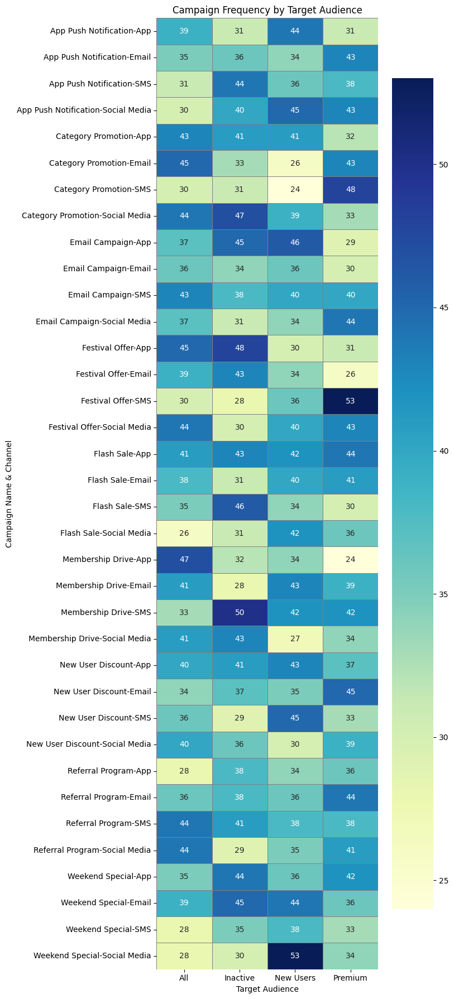

In [44]:
campaign_target = pd.pivot_table(df, index='target_audience', columns=['campaign_name', 'channel'], values='campaign_id', aggfunc='count')
campaign_target = campaign_target.T

plt.figure(figsize=(8, 18))  # Adjust size as needed

sns.heatmap(
    campaign_target,
    annot=True,       # Show numbers in cells
    fmt='g',          # Format as integer
    cmap='YlGnBu',    # Color map
    linewidths=0.5,   # Grid lines
    linecolor='gray'
)

plt.title("Campaign Frequency by Target Audience")
plt.xlabel("Target Audience")
plt.ylabel("Campaign Name & Channel")
plt.tight_layout()
plt.show()

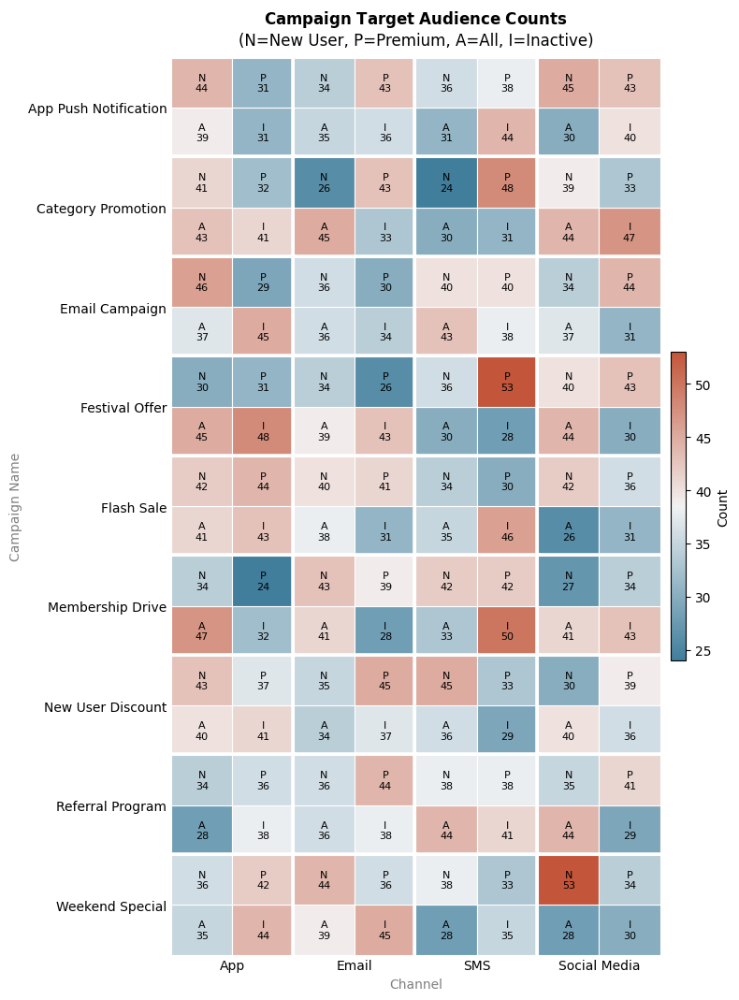

In [45]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.patches import Rectangle

# Assume campaign_target is your pivot table from:
campaign_target = pd.pivot_table(df, index='target_audience', columns=['campaign_name', 'channel'], values='campaign_id', aggfunc='count')
campaign_target = campaign_target.T

# Your target audience groups (4 quadrants)
target_audiences = sorted(list(campaign_target.columns))  # e.g. ['A', 'B', 'C', 'D']

# Extract campaign_name and channel from the MultiIndex rows
campaign_names = campaign_target.index.get_level_values('campaign_name').unique()
channels = campaign_target.index.get_level_values('channel').unique()

# Sort them so order is consistent
campaign_names = sorted(campaign_names)
channels = sorted(channels)

# Map campaigns and channels to integer positions for y and x axes
campaign_to_y = {c: i for i, c in enumerate(campaign_names)}
channel_to_x = {ch: i for i, ch in enumerate(channels)}

# Prepare the figure
fig, ax = plt.subplots(figsize=(len(channels)*2, len(campaign_names)*1.2))

# Define quadrant positions within each cell (0.5 x 0.5 squares)
quadrant_positions = [
    (0, 0.5),    # top-left
    (0.5, 0.5),  # top-right
    (0, 0),      # bottom-left
    (0.5, 0)     # bottom-right
]

# Define a colormap for counts, normalize by min/max values in your data for good coloring
all_values = campaign_target.values.flatten()
vmin = np.nanmin(all_values)
vmax = np.nanmax(all_values)

# If your data can have zero counts or large range, adjust vmin/vmax accordingly:
norm = plt.Normalize(vmin=vmin, vmax=vmax)
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# For each campaign/channel cell
for (campaign, channel), row in campaign_target.iterrows():
    y = campaign_to_y[campaign]
    x = channel_to_x[channel]

    # Draw 1x1 square border around the cell
    border = Rectangle((x, y), 1, 1, fill=False, edgecolor='white', linewidth=4)
    ax.add_patch(border)

    # Draw the 4 quadrants inside cell
    for i, target in enumerate(target_audiences):
        dx, dy = quadrant_positions[i]
        val = row[target]

        # If value is NaN, skip coloring and text
        if np.isnan(val):
            facecolor = 'lightgrey'
            val_text = 'NA'
        else:
            facecolor = cmap(norm(val))
            val_text = str(int(val))

        # Draw rectangle for quadrant
        rect = Rectangle((x + dx, y + dy), 0.5, 0.5,
                         facecolor=facecolor, edgecolor='white', linewidth=0.8)
        ax.add_patch(rect)

        # Add text inside quadrant: "target\nvalue"
        ax.text(x + dx + 0.25, y + dy + 0.25,
                f"{target[0].title()}\n{val_text}",
                ha='center', va='center', fontsize=8, color='black' if facecolor != 'lightgrey' else 'black')

# Set axis limits and labels
ax.set_xlim(0, len(channels))
ax.set_ylim(0, len(campaign_names))
ax.invert_yaxis()

ax.set_xticks(np.arange(len(channels)) + 0.5)
ax.set_xticklabels(channels, rotation=0)
ax.set_yticks(np.arange(len(campaign_names)) + 0.5)
ax.set_yticklabels(campaign_names)

ax.set_xlabel("Channel", color='gray')
ax.set_ylabel("Campaign Name", color='gray')
plt.title(r"$\bf{Campaign\ Target\ Audience\ Counts}$" + "\n(N=New User, P=Premium, A=All, I=Inactive)", pad=10)


# Remove grid, ticks, and frame for cleaner look
ax.tick_params(length=0)
for spine in ax.spines.values():
    spine.set_visible(False)

# Add colorbar for counts
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array(all_values)
cbar = plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
cbar.set_label('Count')

plt.tight_layout()
plt.show()


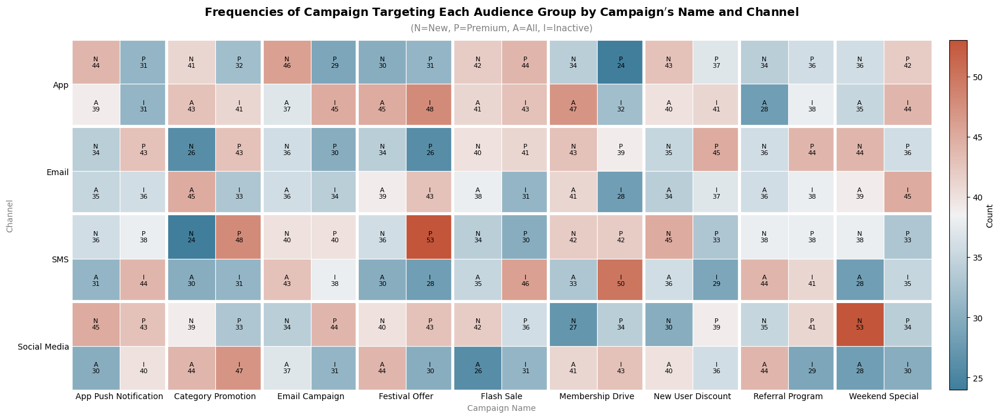

In [46]:
from matplotlib.patches import Rectangle
# Step 1: Create pivot table
campaign_target = pd.pivot_table(
    df,
    index='target_audience',
    columns=['campaign_name', 'channel'],
    values='campaign_id',
    aggfunc='count'
)

# Step 2: Get sorted lists
target_audiences = sorted(campaign_target.index.tolist())  # e.g. ['A', 'I', 'N', 'P']
campaign_names = sorted(campaign_target.columns.get_level_values('campaign_name').unique())
channels = sorted(campaign_target.columns.get_level_values('channel').unique())

# Map positions
campaign_to_x = {c: i for i, c in enumerate(campaign_names)}
channel_to_y = {ch: i for i, ch in enumerate(channels)}

# Step 3: Set up figure and quadrant layout
fig, ax = plt.subplots(figsize=(len(campaign_names)*1.9, len(channels)*1.8))

quadrant_positions = [
    (0, 0.5),    # top-left (A)
    (0.5, 0.5),  # top-right (I)
    (0, 0),      # bottom-left (N)
    (0.5, 0)     # bottom-right (P)
]

# Normalize values for colormap
all_values = campaign_target.values.flatten()
vmin = np.nanmin(all_values)
vmax = np.nanmax(all_values)
norm = plt.Normalize(vmin=vmin, vmax=vmax)
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Step 4: Plot heatmap with horizontal layout
for (campaign, channel) in campaign_target.columns:
    x = campaign_to_x[campaign]
    y = channel_to_y[channel]

    # Draw 1x1 square border
    border = Rectangle((x, y), 1, 1, fill=False, edgecolor='white', linewidth=6)
    ax.add_patch(border)

    # Plot each of the 4 quadrants
    for i, target in enumerate(target_audiences):
        dx, dy = quadrant_positions[i]
        val = campaign_target.loc[target, (campaign, channel)] if (campaign, channel) in campaign_target.columns and target in campaign_target.index else np.nan

        facecolor = 'lightgrey' if np.isnan(val) else cmap(norm(val))
        val_text = 'NA' if np.isnan(val) else str(int(val))

        rect = Rectangle((x + dx, y + dy), 0.5, 0.5,
                         facecolor=facecolor, edgecolor='white', linewidth=0.8)
        ax.add_patch(rect)

        # Label in quadrant
        ax.text(x + dx + 0.25, y + dy + 0.25,
                f"{target[0].upper()}\n{val_text}",
                ha='center', va='center', fontsize=8,
                color='black')

# Step 5: Axis settings
ax.set_xlim(0, len(campaign_names))
ax.set_ylim(0, len(channels))
ax.invert_yaxis()

ax.set_xticks(np.arange(len(campaign_names)) + 0.5)
ax.set_xticklabels(campaign_names)
ax.set_yticks(np.arange(len(channels)) + 0.5)
ax.set_yticklabels(channels)

ax.set_xlabel("Campaign Name", color='gray', fontsize=10)
ax.set_ylabel("Channel", color='gray', fontsize=10)
main_title = r"$\bf{Frequencies\ of\ Campaign\ Targeting\ Each\ Audience\ Group\ by\ Campaign's\ Name\ and\ Channel}$"
ax.set_title(main_title, fontsize=14, pad=30)

# Subtitle (smaller, regular font)
fig.text(0.5, 0.92, "(N=New, P=Premium, A=All, I=Inactive)", ha='center', fontsize=11, color='gray')


# Aesthetic cleanup
ax.tick_params(length=0)
for spine in ax.spines.values():
    spine.set_visible(False)

# Colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array(all_values)
cbar = plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
cbar.set_label('Count')

plt.tight_layout()
plt.show()


In [47]:
campaign_target = pd.pivot_table(df, index='target_audience', columns=['campaign_name', 'channel'], values='campaign_id', aggfunc='count')
campaign_target = campaign_target.T
# Group again by campaign/channel for all other metrics
metrics = df.groupby(['campaign_name', 'channel']).agg({
    'roas': 'mean',
    'roi': 'median',
    'ctr': 'median',
    'conversion_rate': 'median',
    'cost_per_conversion': 'median',
    'spend': ['mean', 'sum'],
    'revenue_generated': ['mean', 'sum']
}).round(3)

# Calculate profit
metrics[('profit', 'sum')] = (metrics[('revenue_generated', 'sum')] - metrics[('spend', 'sum')]).round(3)

# Combine frequency breakdown with the other metrics
campaign_performance1 = pd.concat([campaign_target, metrics], axis=1)

campaign_performance1


All  Inactive  New Users  Premium  \
campaign_name         channel                                           
App Push Notification App            39        31         44       31   
                      Email          35        36         34       43   
                      SMS            31        44         36       38   
                      Social Media   30        40         45       43   
Category Promotion    App            43        41         41       32   
                      Email          45        33         26       43   
                      SMS            30        31         24       48   
                      Social Media   44        47         39       33   
Email Campaign        App            37        45         46       29   
                      Email          36        34         36       30   
                      SMS            43        38         40       40   
                      Social Media   37        31         34       44   
Festival Offer        App            45        48         30       31   
                      Email          39        43         34       26   
                      SMS            30        28         36       53   
                      Social Media   44        30         40       43   
Flash Sale            App            41        43         42       44   
                      Email          38        31         40       41   
                      SMS            35        46         34       30   
                      Social Media   26        31         42       36   
Membership Drive      App            47        32         34       24   
                      Email          41        28         43       39   
                      SMS            33        50         42       42   
                      Social Media   41        43         27       34   
New User Discount     App            40        41         43       37   
                      Email          34        37         35       45   
                      SMS            36        29         45       33   
                      Social Media   40        36         30       39   
Referral Program      App            28        38         34       36   
                      Email          36        38         36       44   
                      SMS            44        41         38       38   
                      Social Media   44        29         35       41   
Weekend Special       App            35        44         36       42   
                      Email          39        45         44       36   
                      SMS            28        35         38       33   
                      Social Media   28        30         53       34   

                                    (roas, mean)  (roi, median)  \
campaign_name         channel                                     
App Push Notification App                  2.810        106.504   
                      Email                2.737        102.294   
                      SMS                  2.723        102.502   
                      Social Media         2.773         88.509   
Category Promotion    App                  2.700         86.639   
                      Email                2.752         89.734   
                      SMS                  2.699        108.708   
                      Social Media         2.617         96.268   
Email Campaign        App                  2.830         82.000   
                      Email                2.693        108.853   
                      SMS                  2.788         96.854   
                      Social Media         2.787         99.572   
Festival Offer        App                  2.724         87.823   
                      Email                2.751        107.193   
                      SMS                  2.789         93.722   
                      Social Media         2.799         70.109   
Flash Sale            App                  2.693       

In [48]:
campaign_performance2 = df.groupby(['campaign_name', 'channel']).agg({
    'campaign_id': 'count',
    'roas': 'mean',
    'roi': 'median',
    'ctr': 'median',
    'conversion_rate': 'median',
    'cost_per_conversion': 'median',
    'spend': ['mean', 'sum'],
    'revenue_generated': ['mean', 'sum']
}).round(3)

campaign_performance2.rename(columns={'campaign_id': 'frequency'}, level=0, inplace=True)

campaign_performance2[('profit', 'sum')] = (campaign_performance2[('revenue_generated', 'sum')] - campaign_performance2[('spend', 'sum')]).round(3)

campaign_performance2

frequency   roas      roi     ctr  \
                                       count   mean   median  median   
campaign_name         channel                                          
App Push Notification App                145  2.810  106.504   9.392   
                      Email              148  2.737  102.294  10.740   
                      SMS                149  2.723  102.502  10.532   
                      Social Media       158  2.773   88.509   9.221   
Category Promotion    App                157  2.700   86.639   9.337   
                      Email              147  2.752   89.734  10.479   
                      SMS                133  2.699  108.708  10.909   
                      Social Media       163  2.617   96.268  10.852   
Email Campaign        App                157  2.830   82.000  10.167   
                      Email              136  2.693  108.853  10.935   
                      SMS                161  2.788   96.854  10.313   
                      Social Media       146  2.787   99.572  10.085   
Festival Offer        App                154  2.724   87.823   9.214   
                      Email              142  2.751  107.193   9.390   
                      SMS                147  2.789   93.722  10.089   
                      Social Media       157  2.799   70.109  10.206   
Flash Sale            App                170  2.693   94.651  10.411   
                      Email              150  2.710   98.041   9.572   
                      SMS                145  2.699   93.121  10.399   
                      Social Media       135  2.748  113.321  10.477   
Membership Drive      App                137  2.812   98.243   9.748   
                      Email              151  2.700  105.146  12.077   
                      SMS                167  2.664   96.160  10.068   
                      Social Media       145  2.718   93.706   8.928   
New User Discount     App                161  2.773   87.029  10.145   
                      Email              151  2.729   81.573  10.288   
                      SMS                143  2.702   96.310   9.324   
                      Social Media       145  2.815   99.991  10.037   
Referral Program      App                136  2.758   95.753   9.346   
                      Email              154  2.820  121.388  10.428   
                      SMS                161  2.634   90.970   9.905   
                      Social Media       149  2.769   94.188  11.132   
Weekend Special       App                157  2.705   80.848   9.030   
                      Email              164  2.832  115.939   9.581   
                      SMS                134  2.697   85.301   9.985   
                      Social Media       145  2.727   87.992  10.678   

                                   conversion_rate cost_per_conversion  \
                                            median              median   
campaign_name         channel                                            
App Push Notification App                   10.801              53.053   
                      Email                  9.467              55.112   
                      SMS                    9.479              53.501   
                      Social Media          10.472              55.379   
Category Promotion    App                   10.863              59.334   
                      Email                  8.965              57.546   
                      SMS                   10.351              53.619   
                      Social Media          10.164              51.927   
Email Campaign        App                   11.966              57.189   
                      Email                  8.720              51.399   
                      SMS                    8.815              53.581   
                      Social Media           9.668              57.359   
Festival Offer        App                   10.819              56.057   
                      Email               

In [49]:
# Group by all three as before
grouped = df.groupby(['campaign_name', 'channel', 'target_audience']).agg({
    'campaign_id': 'count',
    'roas': 'mean',
    'roi': 'median',
    'ctr': 'median',
    'conversion_rate': 'median',
    'cost_per_conversion': 'median',
    'spend': ['mean', 'sum'],
    'revenue_generated': ['mean', 'sum']
}).round(3)

# Rename 'campaign_id' to 'frequency'
grouped.rename(columns={'campaign_id': 'frequency'}, level=0, inplace=True)

# Calculate profit
grouped[('profit', 'sum')] = (grouped[('revenue_generated', 'sum')] - grouped[('spend', 'sum')]).round(3)

# Now unstack target_audience to move it to columns
campaign_performance2 = grouped.unstack(level='target_audience')

# Optional: Sort columns for clarity
campaign_performance2 = campaign_performance2.sort_index(axis=1, level=0)
campaign_performance2

conversion_rate                             \
                                            median                              
target_audience                                All Inactive New Users Premium   
campaign_name         channel                                                   
App Push Notification App                   12.214    8.743    10.432  12.825   
                      Email                  9.192    8.726    10.011   9.761   
                      SMS                    9.836   10.863    14.750   7.513   
                      Social Media          11.638   12.438    10.023  10.407   
Category Promotion    App                   11.199    9.501    11.582   9.974   
                      Email                  7.990    8.735    19.282   7.619   
                      SMS                   10.420   10.771    10.151   9.059   
                      Social Media          10.732    9.584    10.366   9.821   
Email Campaign        App                   10.803   10.432    12.251  14.480   
                      Email                  8.448   10.969     8.035   9.347   
                      SMS                   10.108    9.904     8.348   7.484   
                      Social Media           9.555    8.919     9.487  10.713   
Festival Offer        App                   12.040   11.197    11.402   9.102   
                      Email                 11.194    8.867     9.849  11.897   
                      SMS                    7.136    9.821     9.848  12.264   
                      Social Media          11.218    9.946     9.306   7.631   
Flash Sale            App                   12.435    9.116     9.065   9.691   
                      Email                  9.751   10.329    10.194   9.391   
                      SMS                   10.070   11.024    10.770   9.593   
                      Social Media          10.824    9.580     9.411   9.475   
Membership Drive      App                   12.650    9.286     9.189  11.695   
                      Email                 10.127   11.058     9.428   9.403   
                      SMS                   10.755    5.933     9.293  11.599   
                      Social Media           9.201   11.860    11.359   8.587   
New User Discount     App                    8.322   10.641    11.198   7.516   
                      Email                 12.005   10.721    11.163   7.956   
                      SMS                   10.308   10.264    12.323  10.027   
                      Social Media          10.635   10.000     9.494   8.873   
Referral Program      App                   11.106    9.803     9.372   8.779   
                      Email                 10.424   10.344    10.959   9.321   
                      SMS                    8.678   11.247    10.944  10.192   
                      Social Media           9.756   13.006     7.204  11.988   
Weekend Special       App                   12.348   10.887    11.965  10.141   
                      Email                 10.556   13.447    10.169  10.028   
                      SMS                    8.316   11.589     9.490   8.333   
                      Social Media           8.910    8.548     9.133  10.290   

                                   cost_per_conversion                     \
                                                median                      
target_audience                                    All Inactive New Users   
campaign_name         channel                                               
App Push Notification App                       51.407   70.466    48.403   
                      Email                     60.243   53.641    49.941   
                      SMS                       58.277   51.889    54.644   
                      Social Media              51.223   63.364    54.679   
Category Promotion    App                       62.950   53.807    59.312   
                      Email                     62.286   61.776    50.729   
                      SM

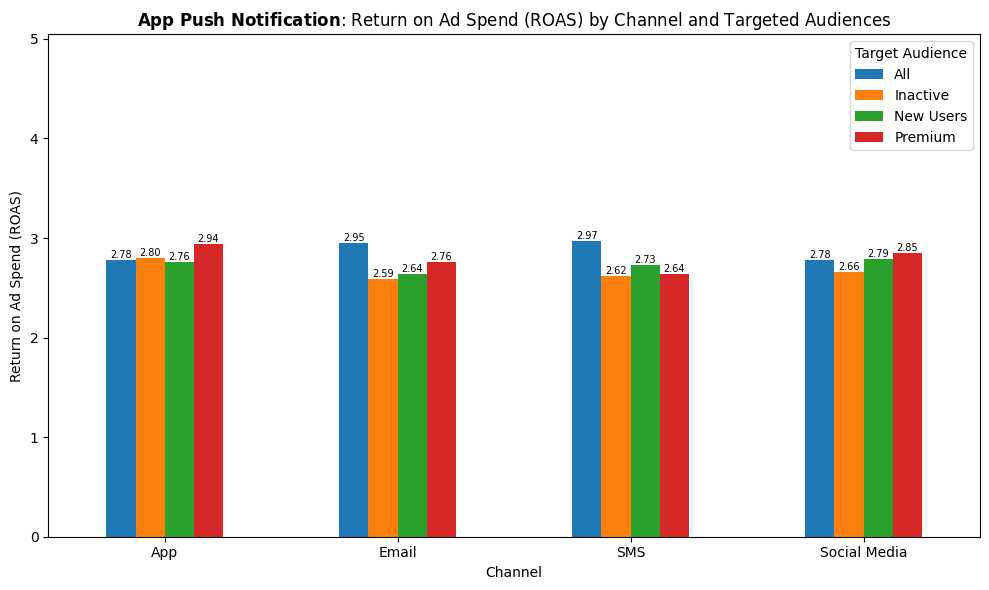

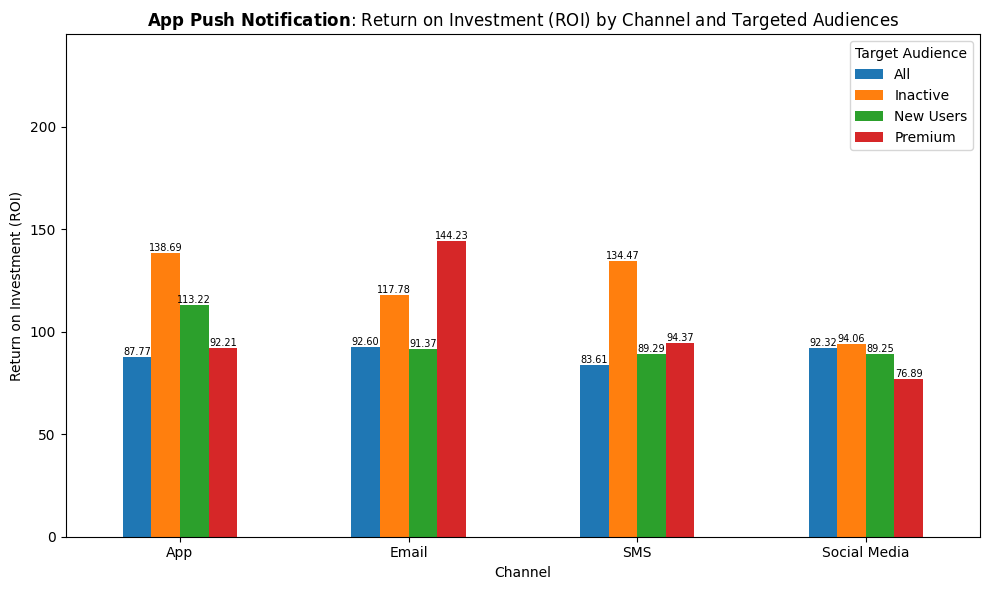

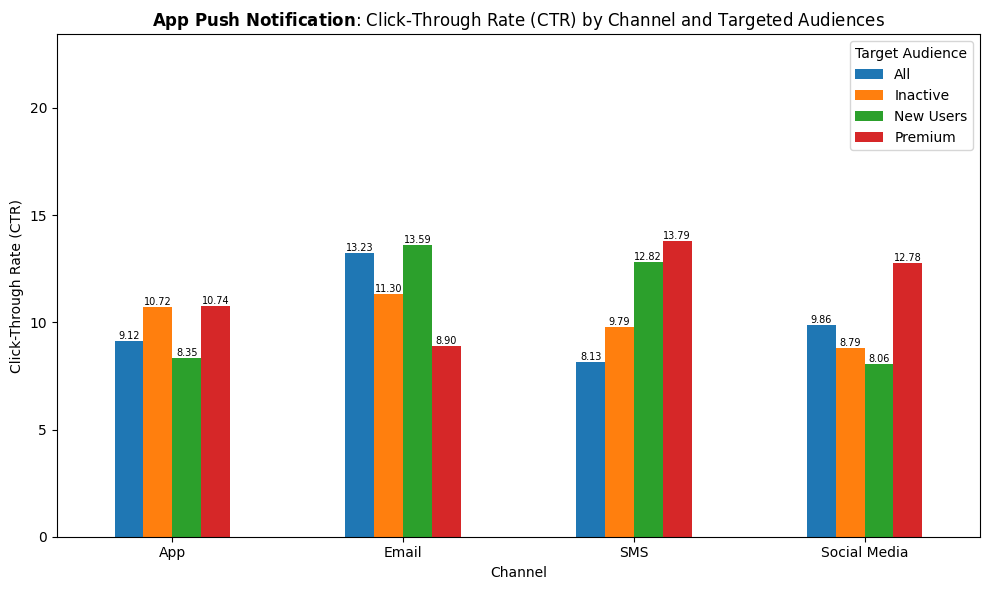

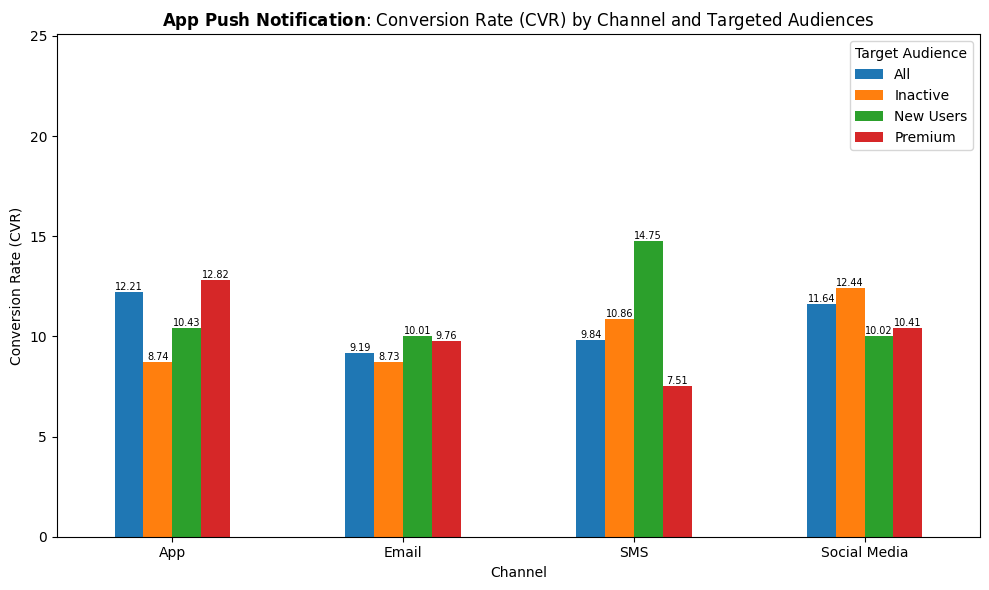

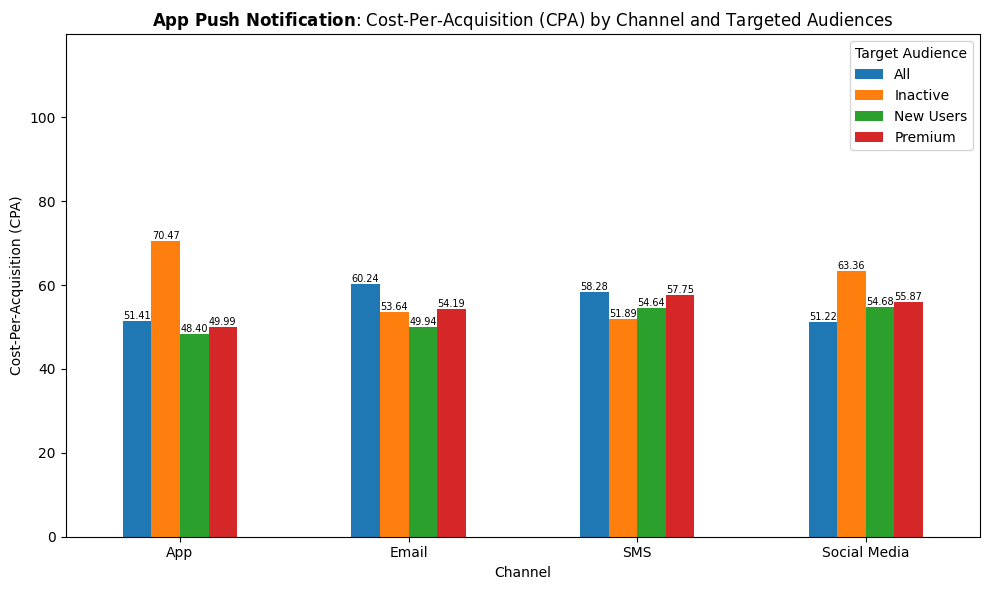

...

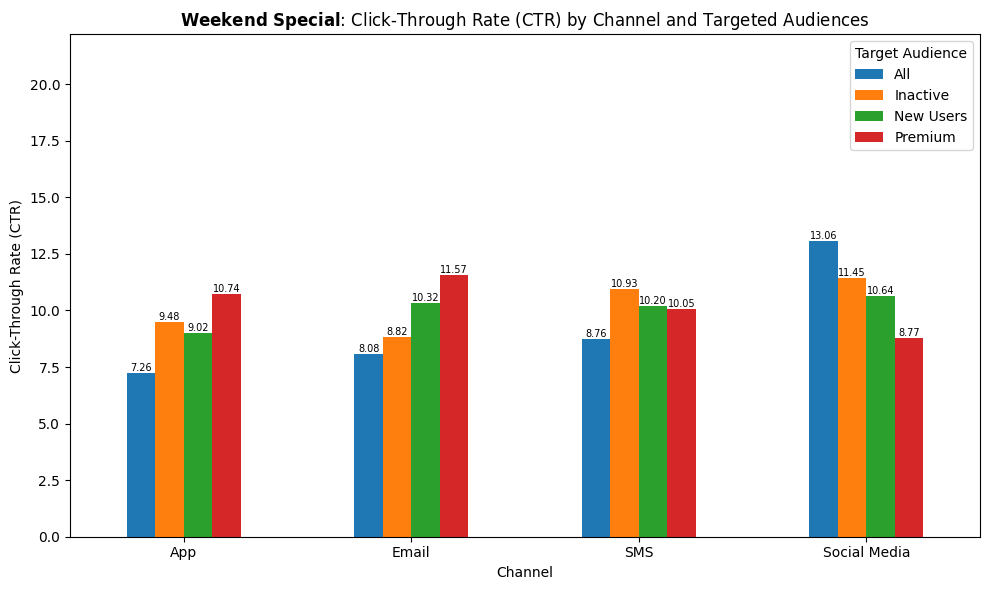

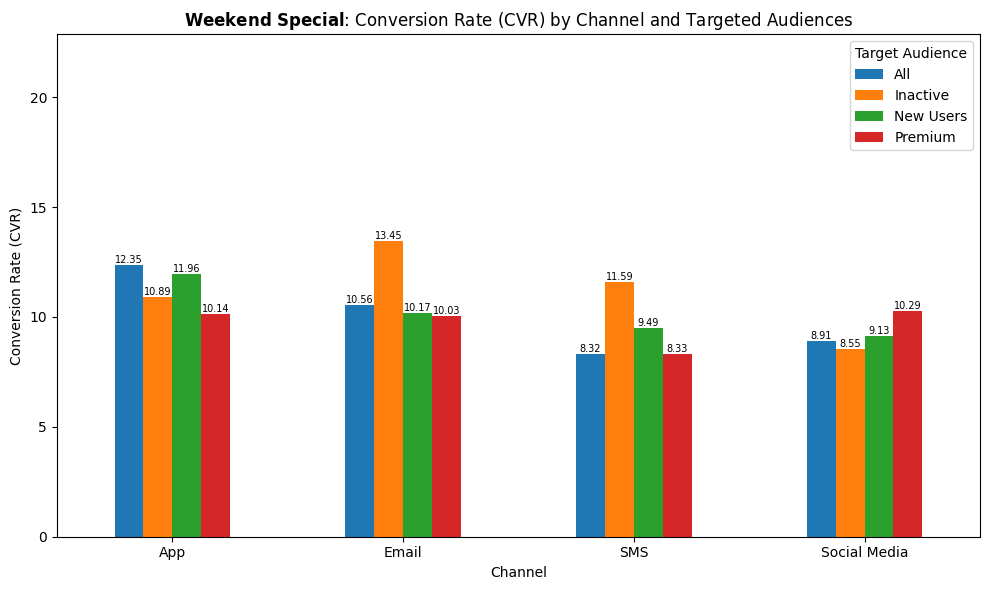

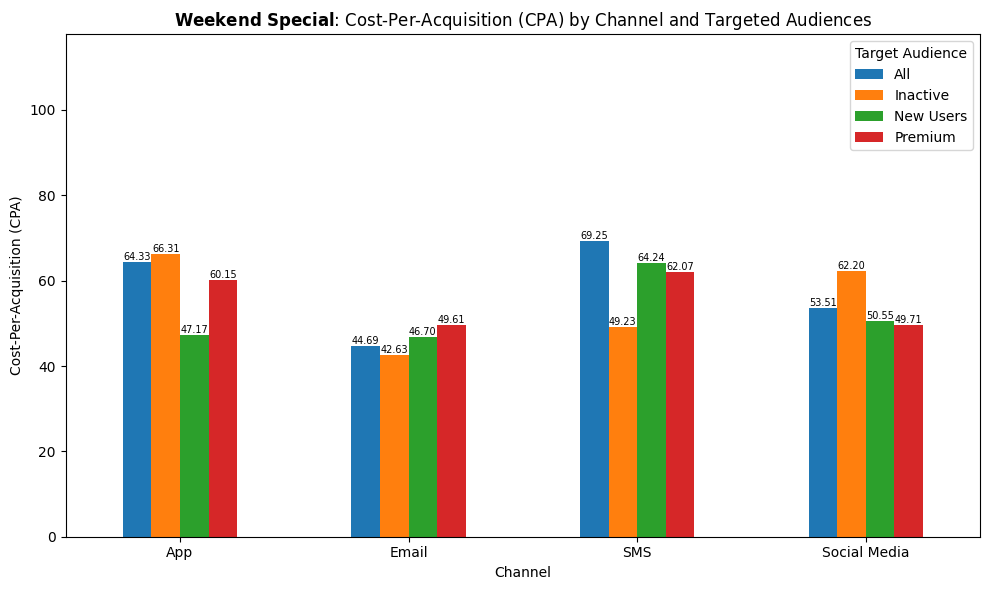

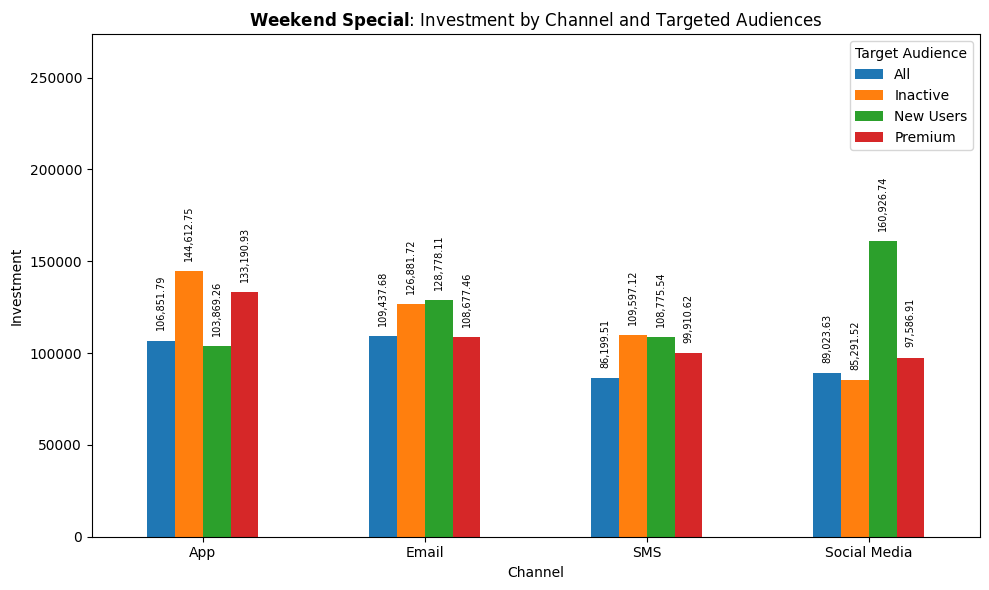

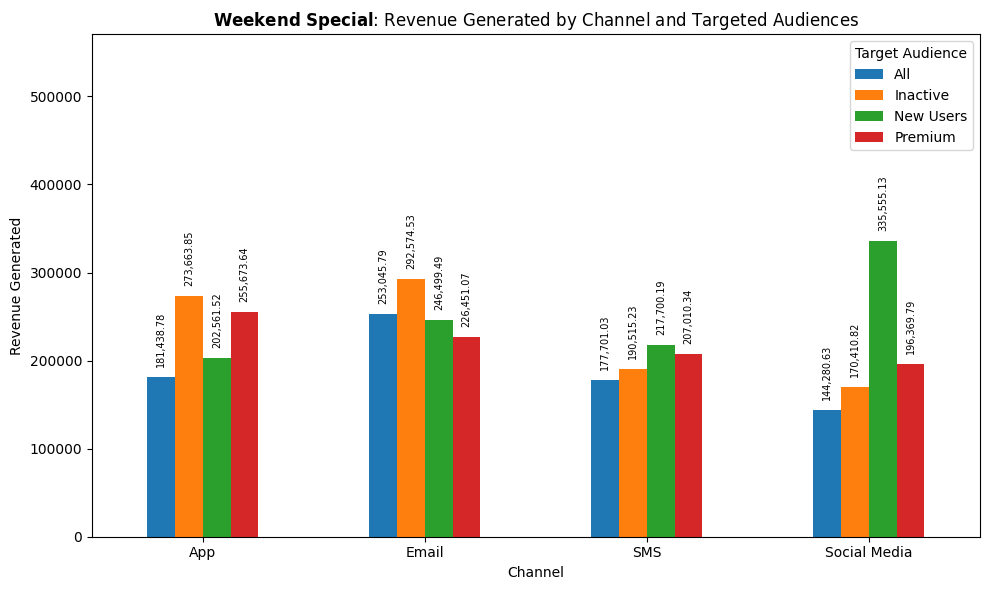

In [50]:
import matplotlib.pyplot as plt
import pandas as pd

# Map internal metric keys to display names
metric_name_map = {
    'ctr': 'Click-Through Rate (CTR)',
    'cpc': 'Cost-Per-Click (CPC)',
    'conversion rate': 'Conversion Rate (CVR)',
    'cost per conversion': 'Cost-Per-Acquisition (CPA)',
    'frequency': 'Frequency',
    'profit': 'Profit',
    'revenue generated': 'Revenue Generated',
    'revenue per conversion': 'Revenue-Per-Conversion (RPC)',
    'roas': 'Return on Ad Spend (ROAS)',
    'roi': 'Return on Investment (ROI)',
    'spend': 'Investment'
}

# Define metrics to visualize (as tuples matching MultiIndex levels)
metric_map = {
    'roas': ('roas', 'mean'),
    'roi': ('roi', 'median'),
    'ctr': ('ctr', 'median'),
    'conversion_rate': ('conversion_rate', 'median'),
    'cost_per_conversion': ('cost_per_conversion', 'median'),
    'spend': ('spend', 'sum'),
    'revenue_generated': ('revenue_generated', 'sum')
}


# Prepare the data
df_plot = campaign_performance2.reset_index()
all_columns = campaign_performance2.columns
target_audiences = sorted({col[2] for col in campaign_performance2.columns})

# Loop through each campaign
for campaign_name in df_plot['campaign_name'].unique():
    df_campaign = df_plot[df_plot['campaign_name'] == campaign_name]

    for metric_label, col_prefix in metric_map.items():
        plot_data = []

        for ta in target_audiences:
            col_name = (col_prefix[0], col_prefix[1], ta)

            if col_name in df_campaign.columns:
                temp_df = pd.DataFrame({
                    'channel': df_campaign['channel'].values,
                    'target_audience': ta,
                    'value': df_campaign[col_name].values
                })
                plot_data.append(temp_df)

        if not plot_data:
            continue

        df_metric = pd.concat(plot_data)
        pivot_df = df_metric.pivot(index='channel', columns='target_audience', values='value')

        # Plot
        ax = pivot_df.plot(kind='bar', figsize=(10, 6))

        # Label formatting
        lookup_key = metric_label.replace('_', ' ')
        display_name = metric_name_map.get(lookup_key, lookup_key.title())

        campaign_name_escaped = r'\ '.join(campaign_name.title().split(' '))
        campaign_name_math = fr"$\mathbf{{{campaign_name_escaped}}}$"  # \mathbf is better supported for bold math text
        plt.title(f"{campaign_name_math}: {display_name} by Channel and Targeted Audiences")

        plt.xlabel("Channel")
        plt.ylabel(display_name)
        plt.xticks(rotation=0)
        plt.legend(title='Target Audience')
        y_max = pivot_df.max().max()
        plt.ylim(0, y_max * 1.7)
        plt.tight_layout()

        # 🔍 Add value labels to bars
        for container in ax.containers:
            for bar in container:
                height = bar.get_height()
                if not pd.isna(height):
                    label = f'{height:,.2f}' if metric_label != 'frequency' else f'{height:.0f}'
                    rotation = 0 if len(label) < 7 else 90

                    x = bar.get_x() + bar.get_width() / 2
                    y = height + 0.02 * (ax.get_ylim()[1] - ax.get_ylim()[0]) if rotation == 90 else height

                    ax.text(
                        x, y, label,
                        ha='center', va='bottom',
                        fontsize=7,
                        color='black',
                        rotation=rotation
                    )

        plt.show()


# 5. Time-based Analysis

### 5.1 Monthy trend analysis

In [51]:
monthly_trends = df.groupby('publish_month').agg({
    'campaign_id': 'count',
    'roas': 'mean',
    'roi': 'median',
    'ctr': 'median',
    'conversion_rate': 'median',
    'cost_per_conversion': 'mean',
    'spend': ['mean', 'sum'],
    'revenue_generated': ['mean', 'sum']
}).round(3)

monthly_trends.rename(columns={'campaign_id': 'frequency'}, level=0, inplace=True)

monthly_trends[('profit', 'sum')] = (monthly_trends[('revenue_generated', 'sum')] - monthly_trends[('spend', 'sum')]).round(3)

monthly_trends

frequency   roas      roi     ctr conversion_rate  \
                  count   mean   median  median          median   
publish_month                                                     
1                   279  2.775   93.967  10.479          10.081   
2                   261  2.745  102.424  10.848          10.619   
3                   414  2.762   89.885   9.942          10.291   
4                   540  2.734   96.493   9.718           9.987   
5                   558  2.727   99.403  10.140           9.687   
6                   540  2.732  100.962  10.300           9.835   
7                   558  2.711   95.879  10.339           9.973   
8                   558  2.771   92.879   9.695           9.584   
9                   540  2.692   97.111  10.038          10.526   
10                  558  2.767   91.545  10.183          10.284   
11                  315  2.757  100.206  10.576          10.000   
12                  279  2.751   98.596   9.431           9.756   

              cost_per_conversion     spend             revenue_generated  \
                             mean      mean         sum              mean   
publish_month                                                               
1                          71.939  2978.541   831013.03          5698.953   
2                          73.315  2944.783   768588.32          6084.246   
3                          76.978  3126.124  1294215.25          6001.124   
4                          77.885  3041.031  1642156.50          5870.848   
5                          84.857  3072.742  1714589.98          6138.574   
6                          78.214  2985.729  1612293.89          5994.710   
7                          77.589  3093.154  1725980.08          6046.268   
8                          73.528  2934.327  1637354.55          5799.136   
9                          78.751  3101.826  1674986.04          6029.283   
10                         77.870  2999.931  1673961.27          5919.126   
11                         77.122  2929.673   922846.93          5895.008   
12                         80.260  2945.708   821852.40          5995.956   

                               profit  
                      sum         sum  
publish_month                          
1              1590007.94   758994.91  
2              1587988.12   819399.80  
3              2484465.18  1190249.93  
4              3170258.15  1528101.65  
5              3425324.50  1710734.52  
6              3237143.38  1624849.49  
7              3373817.56  1647837.48  
8              3235917.91  1598563.36  
9              3255812.69  1580826.65  
10             3302872.46  1628911.19  
11             1856927.63   934080.70  
12             1672871.85   851019.45

In [52]:
monthly_trends_campaign = df.groupby(['campaign_name', 'publish_month']).agg({
    'campaign_id': 'count',
    'roas': 'mean',
    'roi': 'median',
    'ctr': 'median',
    'conversion_rate': 'median',
    'cost_per_conversion': 'mean',
    'spend': ['mean', 'sum'],
    'revenue_generated': ['mean', 'sum']
}).round(3)

monthly_trends_campaign.rename(columns={'campaign_id': 'frequency'}, level=0, inplace=True)

monthly_trends_campaign[('profit', 'sum')] = (monthly_trends_campaign[('revenue_generated', 'sum')] - monthly_trends_campaign[('spend', 'sum')]).round(3)

monthly_trends_campaign

frequency   roas      roi     ctr  \
                                        count   mean   median  median   
campaign_name         publish_month                                     
App Push Notification 1                    31  2.770  127.906  10.346   
                      2                    29  2.784  128.524   9.738   
                      3                    46  2.827  137.975  11.007   
                      4                    60  2.834  101.346   9.121   
                      5                    62  2.838  117.542   9.920   
...                                       ...    ...      ...     ...   
Weekend Special       8                    62  2.624  104.744   8.254   
                      9                    60  2.500   73.728   9.302   
                      10                   62  2.660   86.591  10.253   
                      11                   35  2.843   92.621  10.047   
                      12                   31  2.860  139.209  10.636   

                                    conversion_rate cost_per_conversion  \
                                             median                mean   
campaign_name         publish_month                                       
App Push Notification 1                      11.708              64.715   
                      2                       9.192              91.238   
                      3                      14.380              66.213   
                      4                       8.818              78.088   
                      5                       9.270             100.416   
...                                             ...                 ...   
Weekend Special       8                      10.719              72.876   
                      9                      10.112              82.585   
                      10                     10.252              76.467   
                      11                      9.524              74.485   
                      12                      9.333              80.830   

                                        spend            revenue_generated  \
                                         mean        sum              mean   
campaign_name         publish_month                                          
App Push Notification 1              3000.037   93001.15          5713.963   
                      2              2993.235   86803.82          5908.236   
                      3              3026.511  139219.49          6255.892   
                      4              3094.433  185665.95          6043.316   
                      5              3113.296  193024.37          6597.985   
...                                       ...        ...               ...   
Weekend Special       8              2863.036  177508.26          5553.653   
                      9              3125.143  187508.60          5624.656   
                      10             2923.017  181227.04          5728.149   
                      11             3053.850  106884.76          5674.474   
                      12             3022.813   93707.21          6164.086   

                                                   profit  
                                           sum        sum  
campaign_name         publish_month                        
App Push Notification 1              177132.85   84131.70  
                      2              171338.84   84535.02  
                      3              287771.04  148551.55  
                      4              362598.96  176933.01  
                      5              409075.05  216050.68  
...                                        ...        ...  
Weekend Special       8              344326.47  166818.21  
                      9              337479.37  149970.77  
                      10             355145.23  173918.19  
                      11             198606.60   91721.84  
                      12             191086.66   97379.45  

[108 rows x 11 columns]

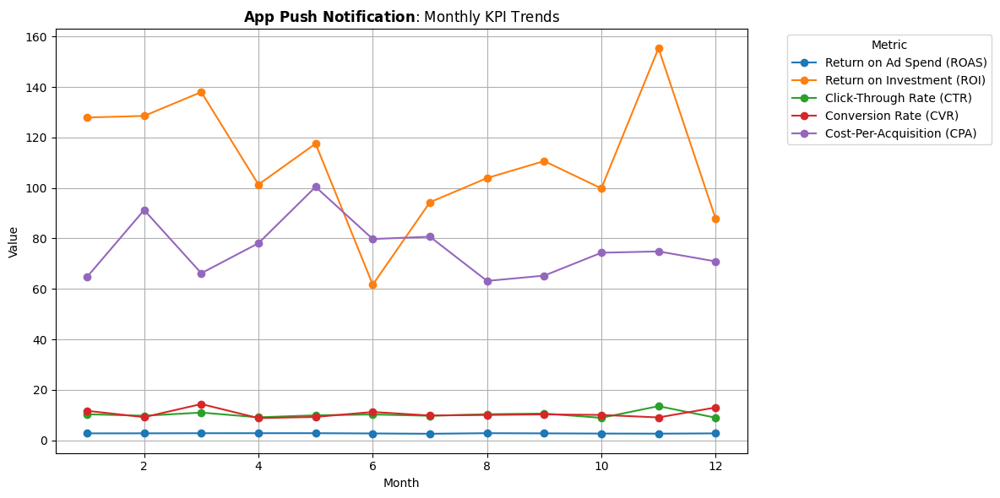

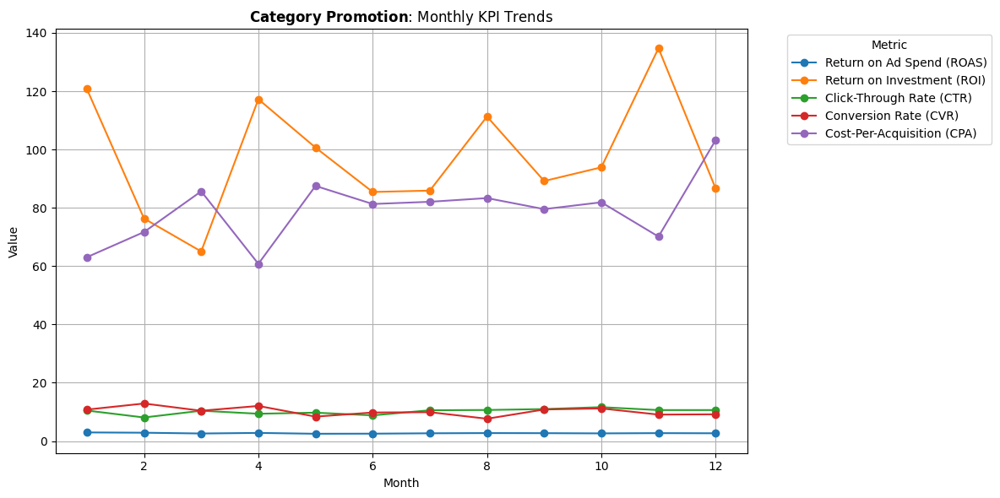

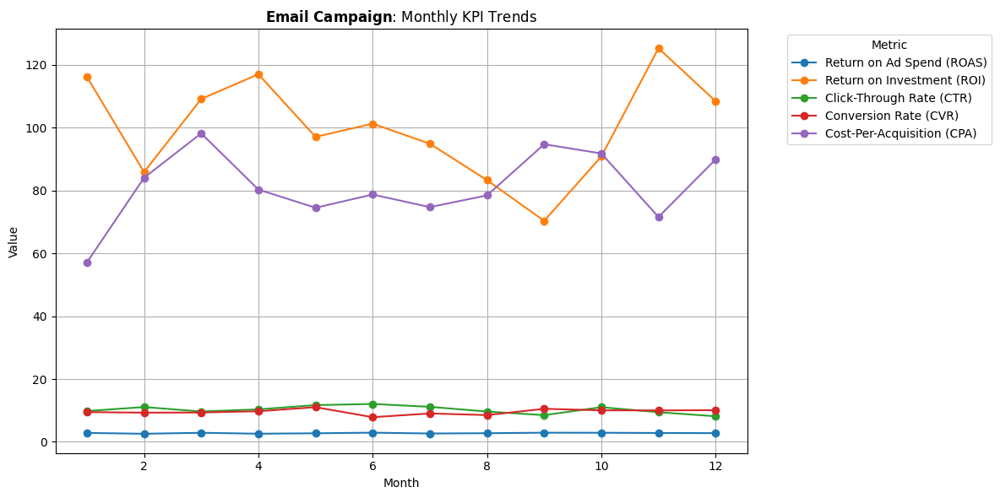

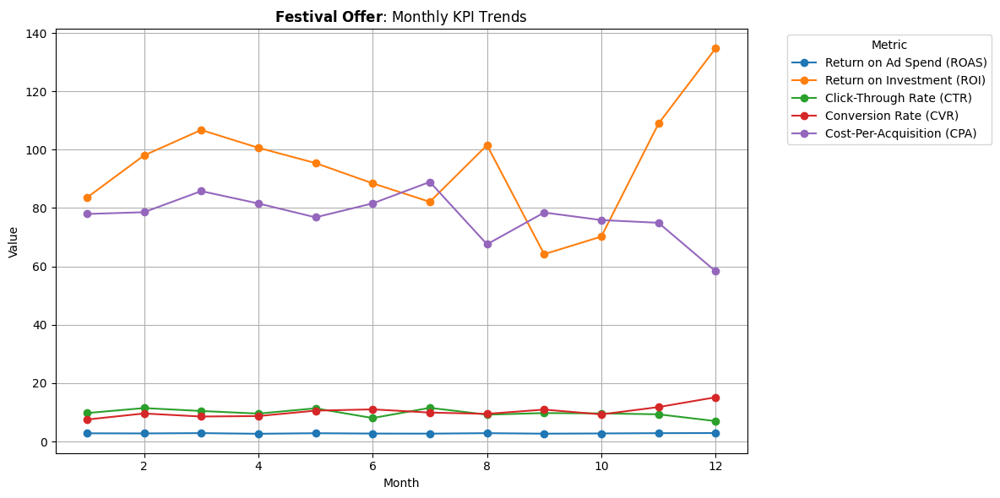

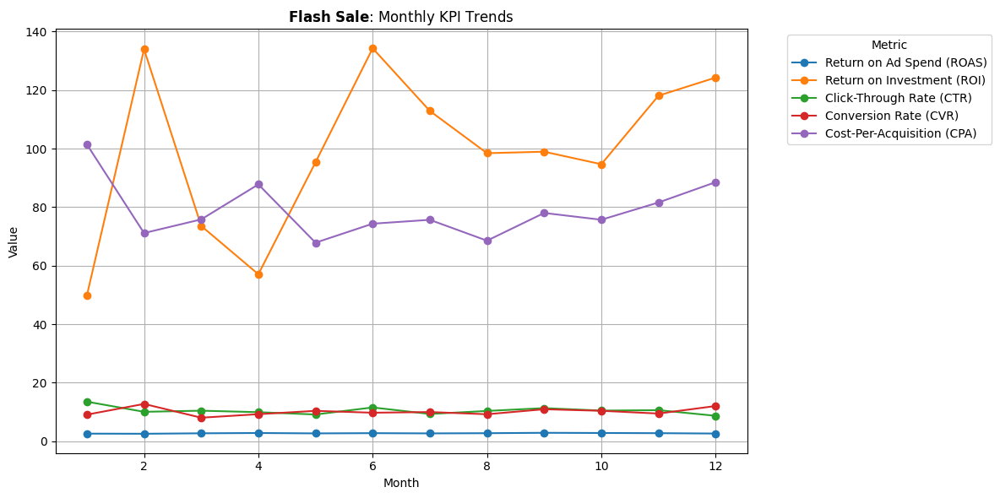

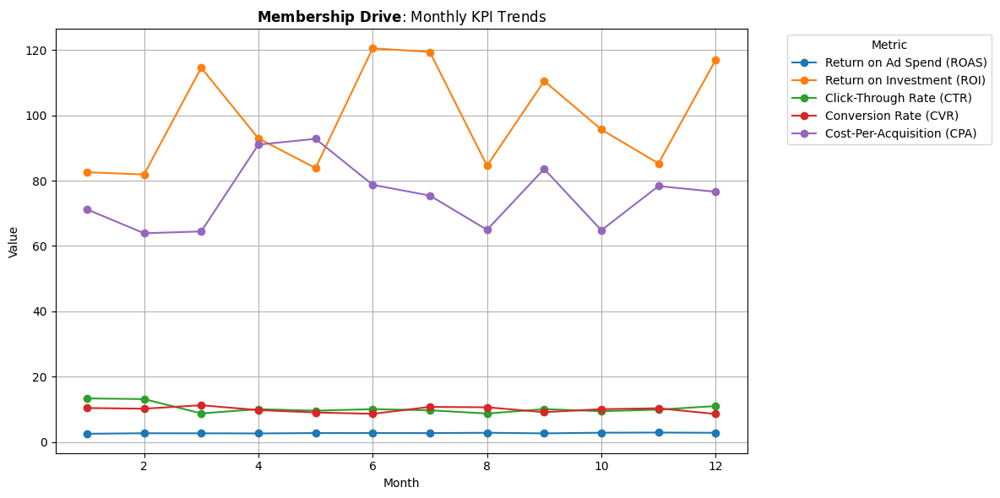

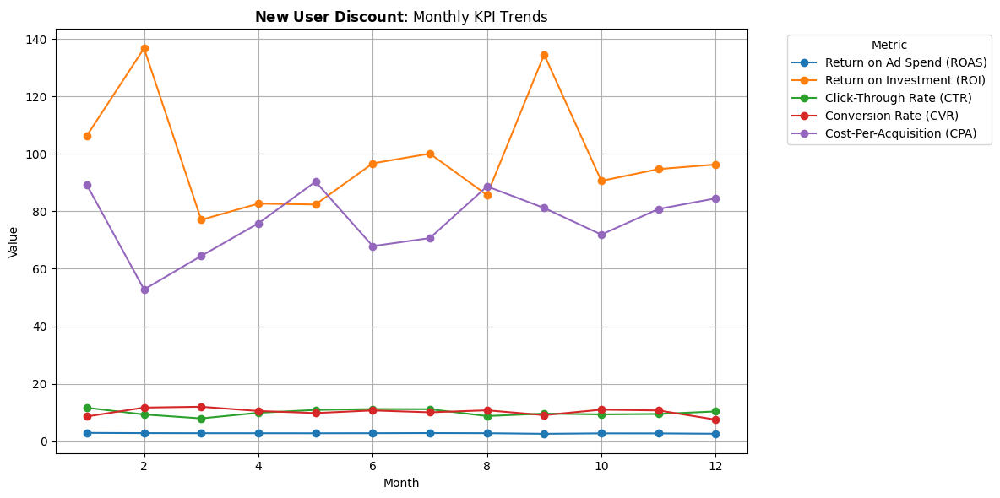

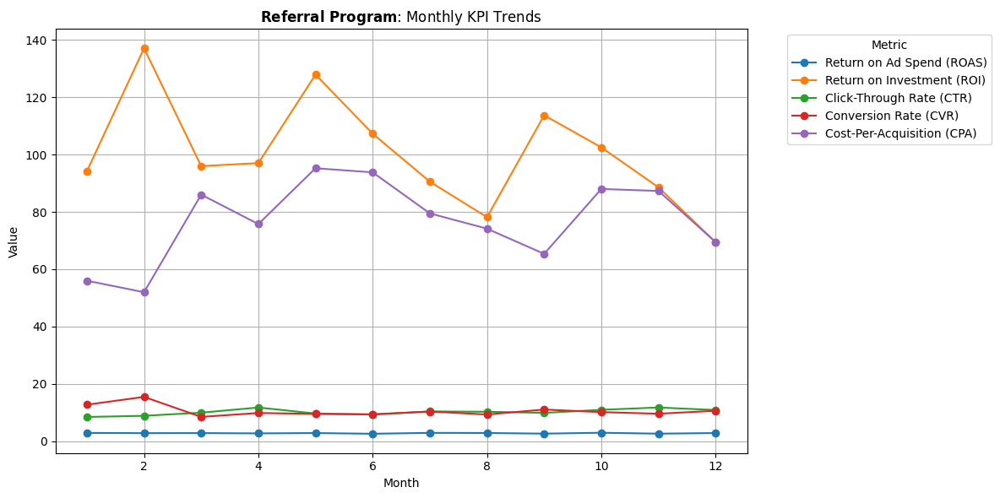

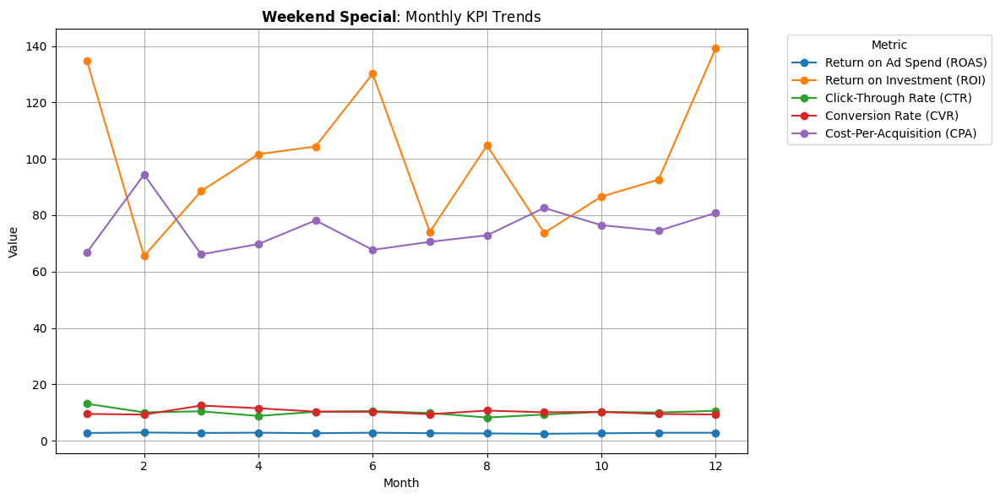

In [53]:
# Flatten columns
df_plot = monthly_trends_campaign.copy()
df_plot.columns = ['_'.join(col).strip() if isinstance(col, tuple) else col for col in df_plot.columns]
df_plot = df_plot.reset_index()

# Map internal metric keys to display names
metric_name_map = {
    'ctr': 'Click-Through Rate (CTR)',
    'cpc': 'Cost-Per-Click (CPC)',
    'conversion rate': 'Conversion Rate (CVR)',
    'cost per conversion': 'Cost-Per-Acquisition (CPA)',
    'frequency': 'Frequency',
    'profit': 'Profit',
    'revenue generated': 'Revenue Generated',
    'revenue per conversion': 'Revenue-Per-Conversion (RPC)',
    'roas': 'Return on Ad Spend (ROAS)',
    'roi': 'Return on Investment (ROI)',
    'spend': 'Investment'
}

# Metrics to plot
selected_metrics = {
    'frequency': 'Frequency',
    'roas_mean': 'Return on Ad Spend (ROAS)',
    'roi_median': 'Return on Investment (ROI)',
    'ctr_median': 'Click-Through Rate (CTR)',
    'conversion_rate_median': 'Conversion Rate (CVR)',
    'cost_per_conversion_mean': 'Cost-Per-Acquisition (CPA)'
}

# Loop through each campaign
for campaign_name in df_plot['campaign_name'].unique():
    subset = df_plot[df_plot['campaign_name'] == campaign_name].sort_values('publish_month')

    plt.figure(figsize=(12, 6))

    for internal_col, display_name in selected_metrics.items():
        if internal_col in subset.columns:
            plt.plot(
                subset['publish_month'],
                subset[internal_col],
                marker='o',
                label=display_name
            )

    # Format title with LaTeX-style math bold
    campaign_name_escaped = r'\ '.join(campaign_name.title().split(' '))
    campaign_name_math = fr"$\mathbf{{{campaign_name_escaped}}}$"
    plt.title(f"{campaign_name_math}: Monthly KPI Trends")

    plt.xlabel("Month")
    plt.ylabel("Value")
    plt.xticks(rotation=0)
    plt.legend(title='Metric', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.grid(True)
    plt.show()


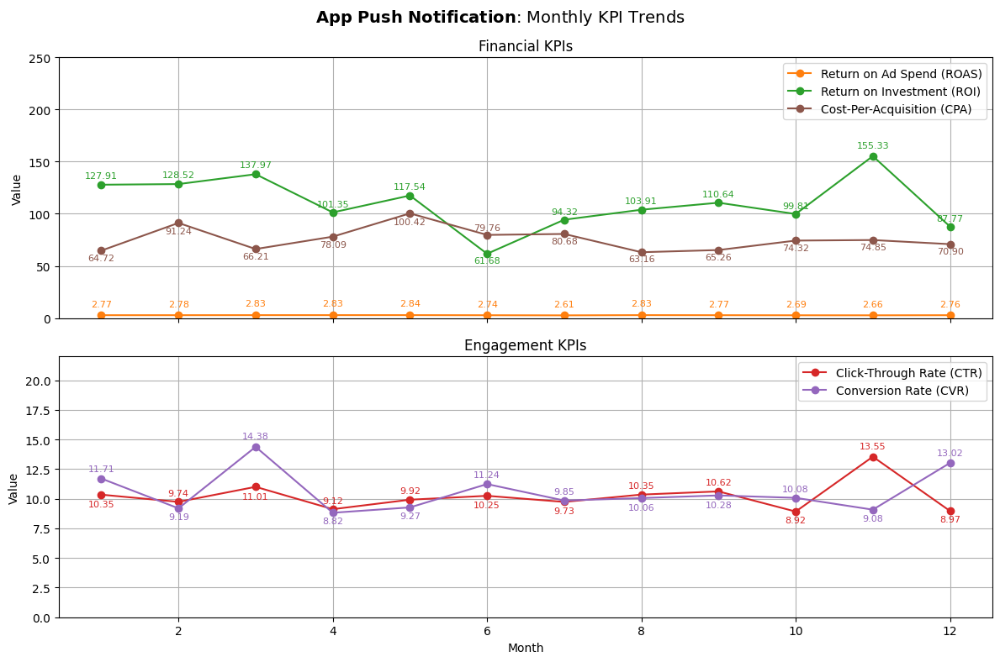

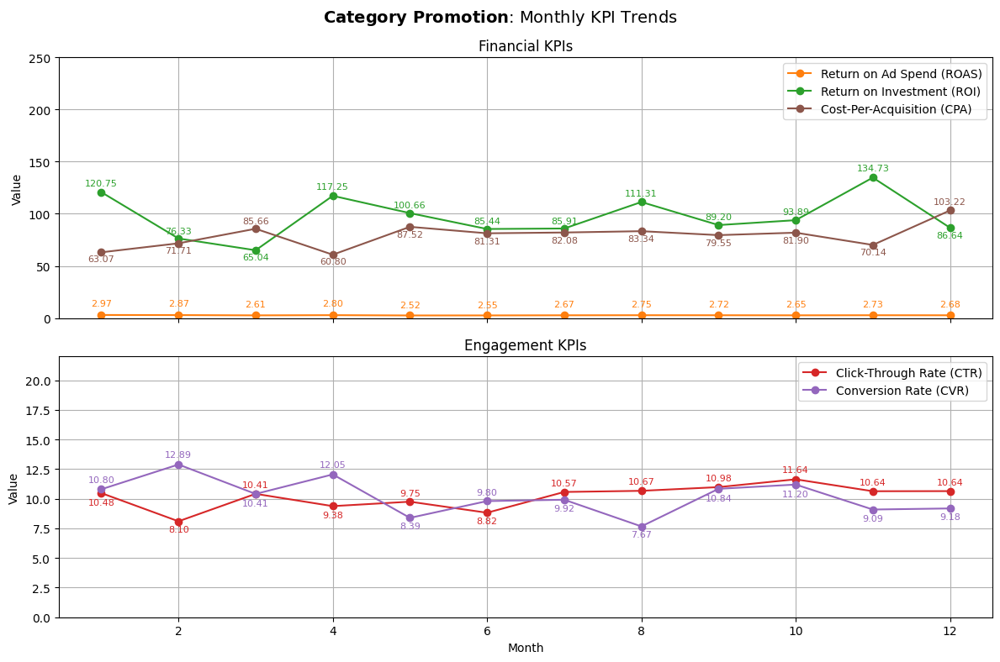

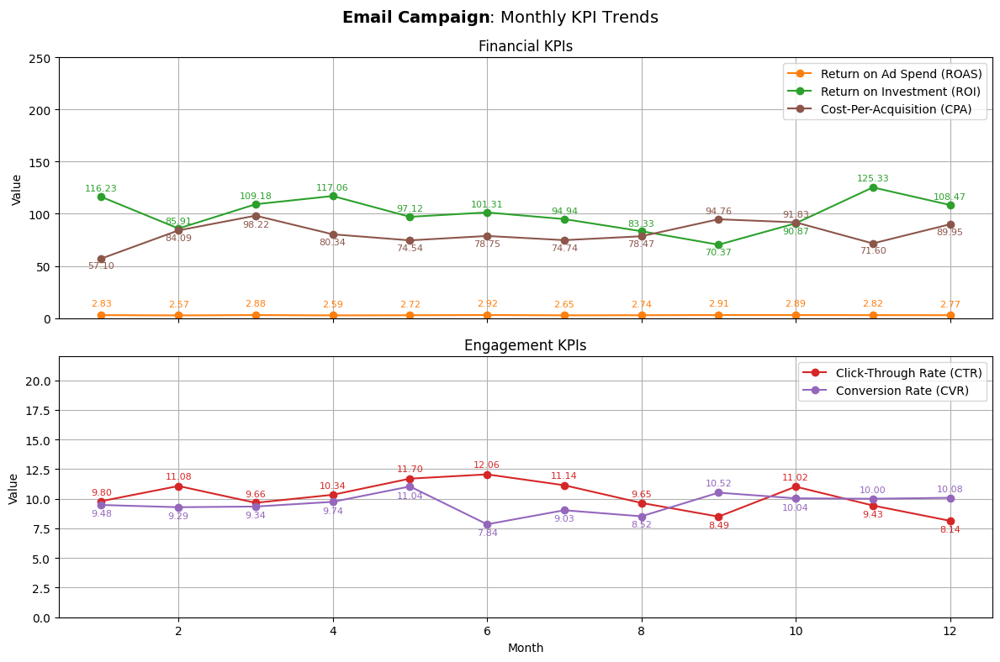

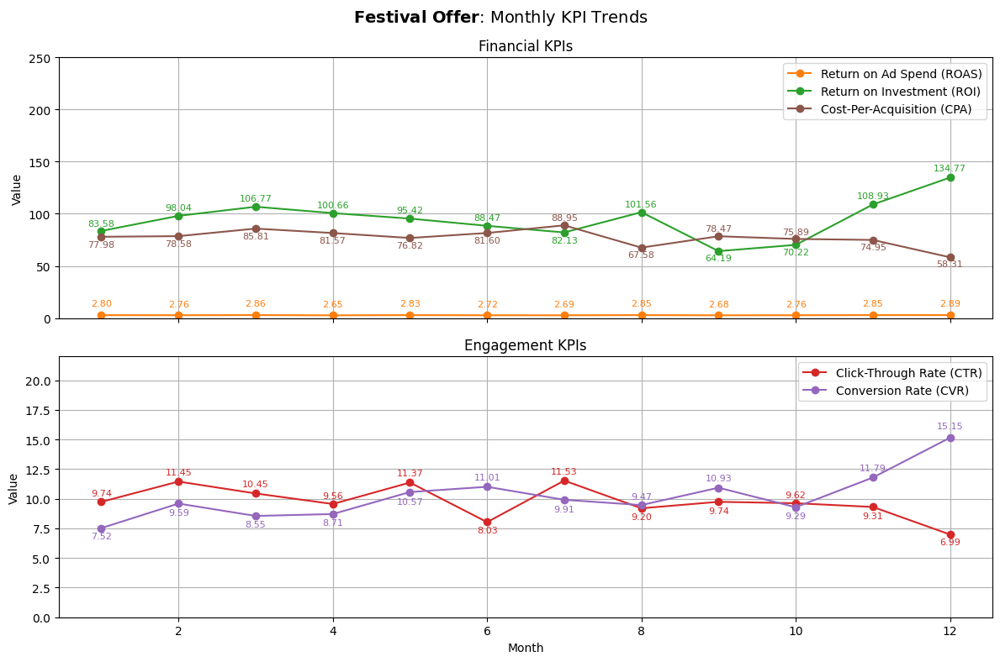

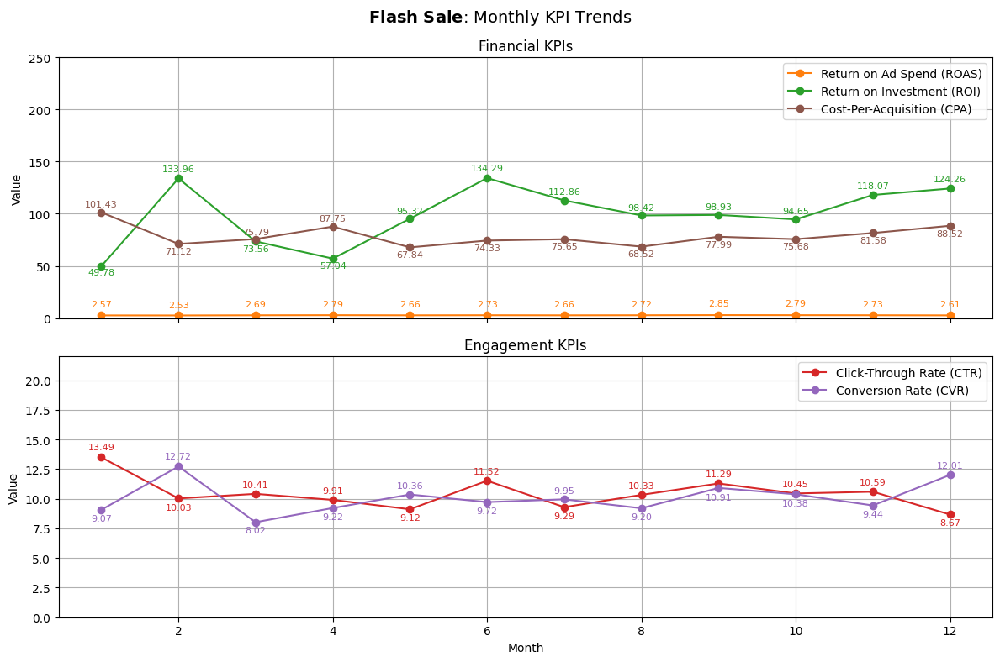

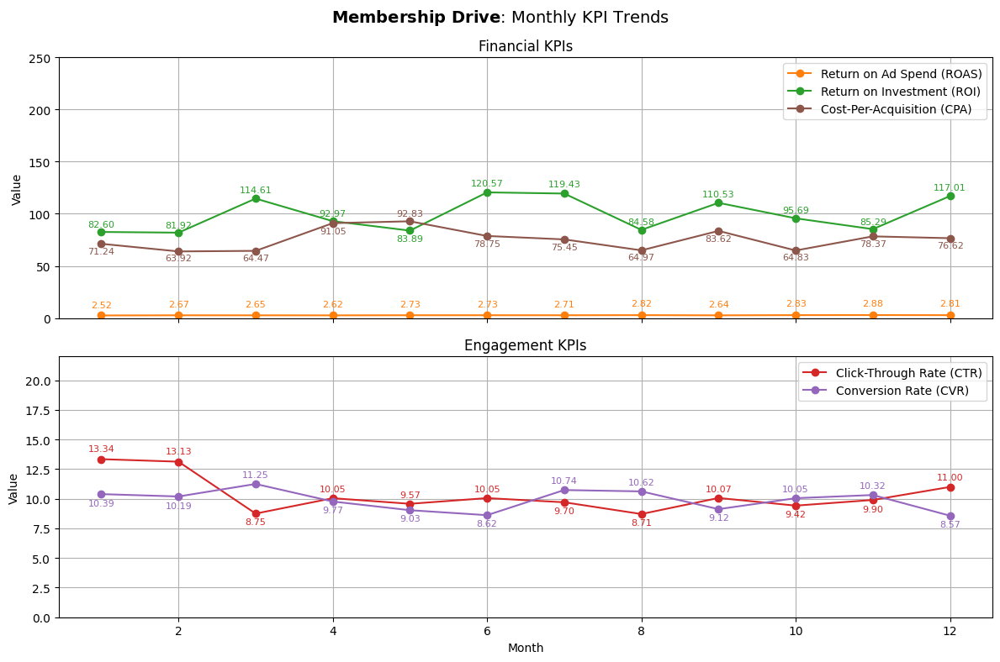

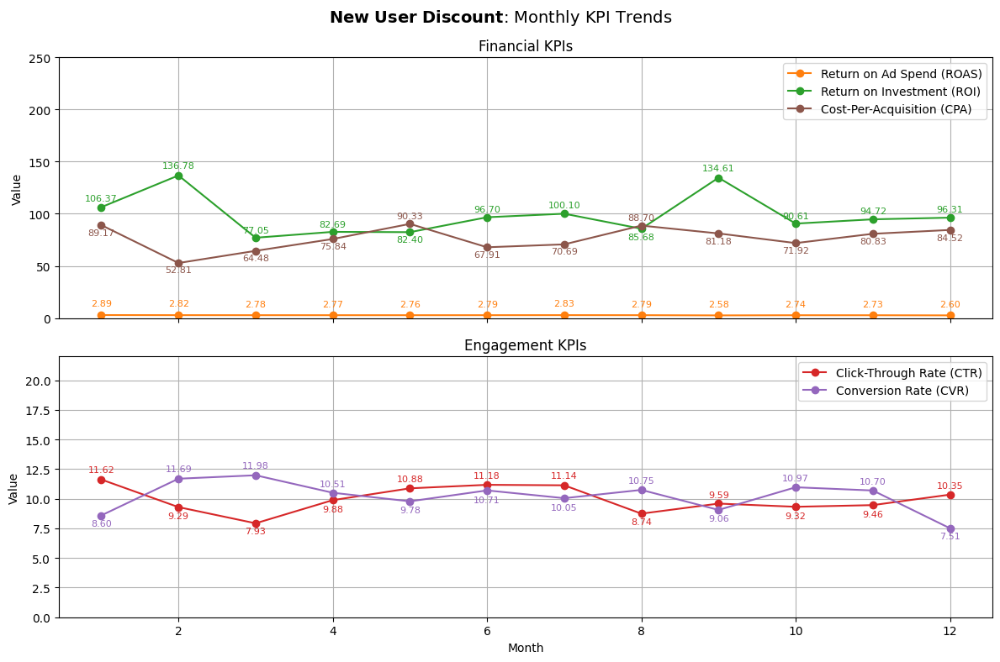

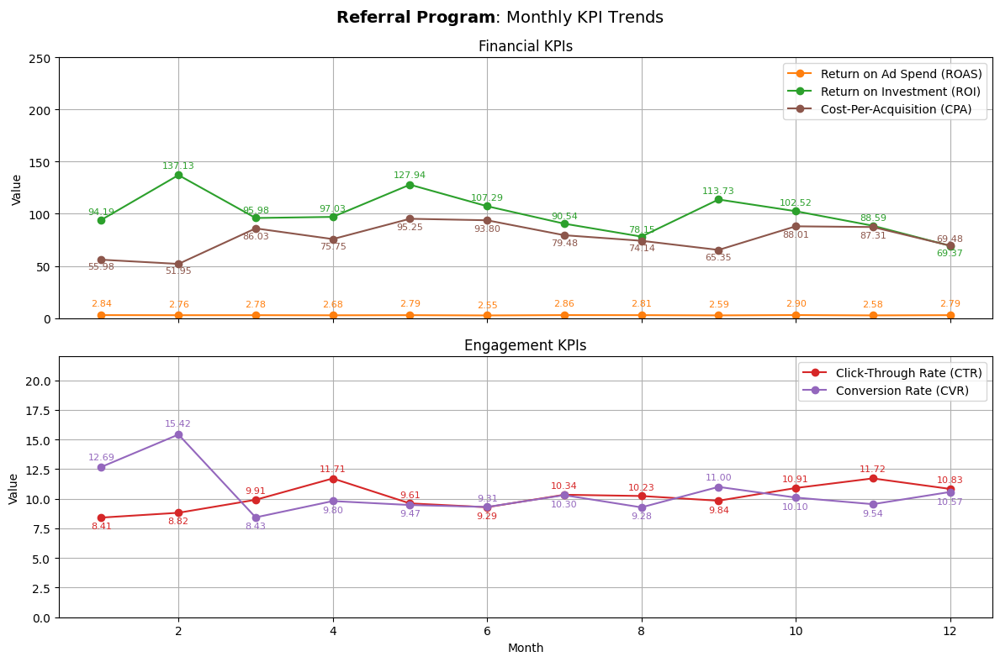

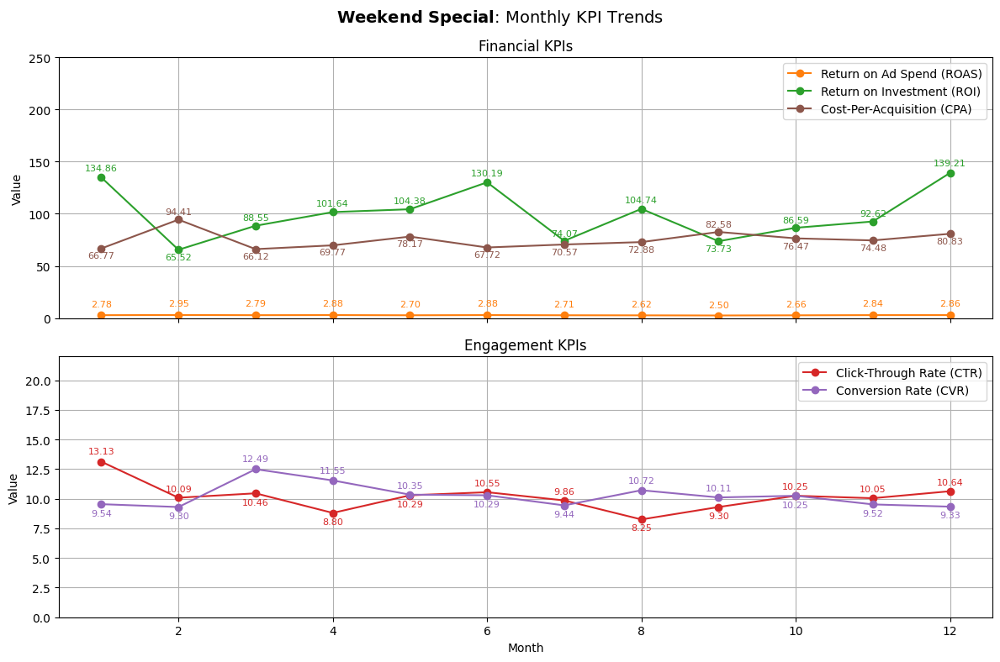

In [54]:
import matplotlib.pyplot as plt
import itertools
import pandas as pd  # needed for pd.notna()

# Flatten columns
df_plot = monthly_trends_campaign.copy()
df_plot.columns = ['_'.join(col).strip() if isinstance(col, tuple) else col for col in df_plot.columns]
df_plot = df_plot.reset_index()

# Map internal metric keys to display names
metric_name_map = {
    'ctr': 'Click-Through Rate (CTR)',
    'cpc': 'Cost-Per-Click (CPC)',
    'conversion rate': 'Conversion Rate (CVR)',
    'cost per conversion': 'Cost-Per-Acquisition (CPA)',
    'frequency': 'Frequency',
    'profit': 'Profit',
    'revenue generated': 'Revenue Generated',
    'revenue per conversion': 'Revenue-Per-Conversion (RPC)',
    'roas': 'Return on Ad Spend (ROAS)',
    'roi': 'Return on Investment (ROI)',
    'spend': 'Investment'
}

# Metrics to plot
selected_metrics = {
    'frequency': 'Frequency',
    'roas_mean': 'Return on Ad Spend (ROAS)',
    'roi_median': 'Return on Investment (ROI)',
    'ctr_median': 'Click-Through Rate (CTR)',
    'conversion_rate_median': 'Conversion Rate (CVR)',
    'cost_per_conversion_mean': 'Cost-Per-Acquisition (CPA)'
}

# Split metrics
financial_metrics = ['roas_mean', 'roi_median', 'cost_per_conversion_mean']
other_metrics = [key for key in selected_metrics if key not in financial_metrics]

# Assign unique colors for all selected metrics
colors = itertools.cycle(plt.get_cmap('tab10').colors)
metric_colors = {metric: next(colors) for metric in selected_metrics}

# Loop through each campaign
for campaign_name in df_plot['campaign_name'].unique():
    subset = df_plot[df_plot['campaign_name'] == campaign_name].sort_values('publish_month')

    fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 8), sharex=True)

    # ---------- Plot Financial KPIs ----------
    max_financial_value = 0
    for internal_col in financial_metrics:
        if internal_col in subset.columns:
            color = metric_colors[internal_col]
            y_values = subset[internal_col]
            max_financial_value = max(max_financial_value, y_values.max())
            axes[0].plot(
                subset['publish_month'],
                y_values,
                marker='o',
                label=selected_metrics[internal_col],
                color=color
            )
    # Add ROAS labels (always above)
    roas_vals = subset.get('roas_mean', pd.Series([None]*len(subset)))
    for x, roas_val in zip(subset['publish_month'], roas_vals):
        if pd.notna(roas_val):
            axes[0].text(
                x,
                roas_val * 3.5,
                f"{roas_val:.2f}",
                fontsize=8,
                ha='center',
                va='bottom',
                color=metric_colors['roas_mean']
            )

    # ROI & CPA labels logic
    roi_vals = subset.get('roi_median', pd.Series([None]*len(subset)))
    cpa_vals = subset.get('cost_per_conversion_mean', pd.Series([None]*len(subset)))
    for x, roi_val, cpa_val in zip(subset['publish_month'], roi_vals, cpa_vals):
        if pd.notna(roi_val) and pd.notna(cpa_val):
            if roi_val > cpa_val:
                axes[0].text(x, roi_val + roi_val * 0.04, f"{roi_val:.2f}", fontsize=8, ha='center', va='bottom', color=metric_colors['roi_median'])
                axes[0].text(x, cpa_val - cpa_val * 0.04, f"{cpa_val:.2f}", fontsize=8, ha='center', va='top', color=metric_colors['cost_per_conversion_mean'])
            else:
                axes[0].text(x, cpa_val + cpa_val * 0.04, f"{cpa_val:.2f}", fontsize=8, ha='center', va='bottom', color=metric_colors['cost_per_conversion_mean'])
                axes[0].text(x, roi_val - roi_val * 0.04, f"{roi_val:.2f}", fontsize=8, ha='center', va='top', color=metric_colors['roi_median'])
        else:
            if pd.notna(roi_val):
                axes[0].text(x, roi_val + roi_val * 0.04, f"{roi_val:.2f}", fontsize=8, ha='center', va='bottom', color=metric_colors['roi_median'])
            if pd.notna(cpa_val):
                axes[0].text(x, cpa_val + cpa_val * 0.04, f"{cpa_val:.2f}", fontsize=8, ha='center', va='bottom', color=metric_colors['cost_per_conversion_mean'])

    axes[0].set_ylabel("Value")
    axes[0].set_title("Financial KPIs")
    axes[0].legend()
    axes[0].grid(True)
    if max_financial_value > 0:
        axes[0].set_ylim(0, 250)

    # ---------- Plot Engagement KPIs ----------
    max_engagement_value = 0

    # Plot all engagement metrics first (except CTR and CVR labels)
    for internal_col in other_metrics:
        if internal_col in subset.columns:
            color = metric_colors[internal_col]
            y_values = subset[internal_col]
            max_engagement_value = max(max_engagement_value, y_values.max())
            axes[1].plot(
                subset['publish_month'],
                y_values,
                marker='o',
                label=selected_metrics[internal_col],
                color=color
            )

    # CTR & CVR label logic
    ctr_vals = subset.get('ctr_median', pd.Series([None]*len(subset)))
    cvr_vals = subset.get('conversion_rate_median', pd.Series([None]*len(subset)))
    for x, ctr_val, cvr_val in zip(subset['publish_month'], ctr_vals, cvr_vals):
        if pd.notna(ctr_val) and pd.notna(cvr_val):
            if ctr_val > cvr_val:
                axes[1].text(x, ctr_val + ctr_val * 0.04, f"{ctr_val:.2f}", fontsize=8, ha='center', va='bottom', color=metric_colors['ctr_median'])
                axes[1].text(x, cvr_val - cvr_val * 0.04, f"{cvr_val:.2f}", fontsize=8, ha='center', va='top', color=metric_colors['conversion_rate_median'])
            else:
                axes[1].text(x, cvr_val + cvr_val * 0.04, f"{cvr_val:.2f}", fontsize=8, ha='center', va='bottom', color=metric_colors['conversion_rate_median'])
                axes[1].text(x, ctr_val - ctr_val * 0.04, f"{ctr_val:.2f}", fontsize=8, ha='center', va='top', color=metric_colors['ctr_median'])
        else:
            if pd.notna(ctr_val):
                axes[1].text(x, ctr_val + ctr_val * 0.04, f"{ctr_val:.2f}", fontsize=8, ha='center', va='bottom', color=metric_colors['ctr_median'])
            if pd.notna(cvr_val):
                axes[1].text(x, cvr_val + cvr_val * 0.04, f"{cvr_val:.2f}", fontsize=8, ha='center', va='bottom', color=metric_colors['conversion_rate_median'])

    axes[1].set_xlabel("Month")
    axes[1].set_ylabel("Value")
    axes[1].set_title("Engagement KPIs")
    axes[1].legend()
    axes[1].grid(True)
    if max_engagement_value > 0:
        axes[1].set_ylim(0, 22)

    # ---------- Campaign Title ----------
    campaign_name_escaped = r'\ '.join(campaign_name.title().split(' '))
    campaign_name_math = fr"$\mathbf{{{campaign_name_escaped}}}$"
    fig.suptitle(f"{campaign_name_math}: Monthly KPI Trends", fontsize=14)

    plt.xticks(rotation=0)
    plt.tight_layout()
    plt.show()


### 5.2 Day-of-week trend analysis

In [55]:
dow_performance = df.groupby('publish_day').agg({
    'campaign_id': 'count',
    'roas': 'mean',
    'ctr': 'mean',
    'conversion_rate': 'mean',
    'cost_per_conversion': 'mean',
    'spend': ['mean', 'sum'],
    'revenue_generated': ['mean', 'sum']
}).reindex(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']).round(3)

dow_performance.rename(columns={'campaign_id': 'frequency'}, level=0, inplace=True)

dow_performance[('profit', 'sum')] = (dow_performance[('revenue_generated', 'sum')] - dow_performance[('spend', 'sum')]).round(3)

dow_performance

frequency   roas     ctr conversion_rate cost_per_conversion  \
                count   mean    mean            mean                mean   
publish_day                                                                
Monday            774  2.731  13.937          14.297              79.546   
Tuesday           774  2.755  14.137          13.707              79.662   
Wednesday         765  2.711  14.806          13.197              79.943   
Thursday          765  2.751  13.860          14.085              73.837   
Friday            774  2.763  13.810          14.620              78.523   
Saturday          774  2.702  14.705          14.959              72.279   
Sunday            774  2.771  14.075          14.589              80.253   

                spend             revenue_generated                  profit  
                 mean         sum              mean         sum         sum  
publish_day                                                                  
Monday       3007.513  2327814.74          6058.492  4689272.60  2361457.86  
Tuesday      2988.688  2313244.28          5920.775  4582679.51  2269435.23  
Wednesday    3006.111  2299674.85          5901.142  4514373.62  2214698.77  
Thursday     3031.411  2319029.62          5937.382  4542096.89  2223067.27  
Friday       3009.861  2329632.19          6003.601  4646787.12  2317154.93  
Saturday     3025.963  2342095.17          6034.837  4670963.61  2328868.44  
Sunday       3085.720  2388347.39          5874.979  4547234.02  2158886.63

In [56]:
days_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
dow_trends_campaign = df.groupby(['campaign_name', 'publish_day']).agg({
    'campaign_id': 'count',
    'roas': 'mean',
    'roi': 'median',
    'ctr': 'median',
    'conversion_rate': 'median',
    'cost_per_conversion': 'mean',
    'spend': ['mean', 'sum'],
    'revenue_generated': ['mean', 'sum']
}).round(3)

dow_trends_campaign.rename(columns={'campaign_id': 'frequency'}, level=0, inplace=True)

dow_trends_campaign[('profit', 'sum')] = (
    dow_trends_campaign[('revenue_generated', 'sum')] - dow_trends_campaign[('spend', 'sum')]
).round(3)

# Sort index on 'publish_day' level by your custom day order
dow_trends_campaign = dow_trends_campaign.reindex(
    pd.MultiIndex.from_product(
        [dow_trends_campaign.index.get_level_values(0).unique(), days_order],
        names=['campaign_name', 'publish_day']
    )
)

dow_trends_campaign

frequency   roas      roi     ctr  \
                                      count   mean   median  median   
campaign_name         publish_day                                     
App Push Notification Monday             86  2.801   94.369   9.898   
                      Tuesday            86  2.646  101.136  10.699   
                      Wednesday          85  2.831  130.752  10.094   
                      Thursday           85  2.788  101.717   9.872   
                      Friday             86  2.836  123.260   9.264   
...                                     ...    ...      ...     ...   
Weekend Special       Wednesday          85  2.749   73.330   9.615   
                      Thursday           85  2.708   89.632  10.229   
                      Friday             86  2.820  119.783   8.324   
                      Saturday           86  2.672  111.207  10.440   
                      Sunday             86  2.837   87.804   9.136   

                                  conversion_rate cost_per_conversion  \
                                           median                mean   
campaign_name         publish_day                                       
App Push Notification Monday               10.300              69.090   
                      Tuesday               8.990              94.523   
                      Wednesday            11.017              68.929   
                      Thursday             11.215              65.841   
                      Friday               10.351              77.790   
...                                           ...                 ...   
Weekend Special       Wednesday            10.112              75.490   
                      Thursday             12.565              69.949   
                      Friday               12.465              74.917   
                      Saturday              9.443              68.781   
                      Sunday                9.751              82.782   

                                      spend            revenue_generated  \
                                       mean        sum              mean   
campaign_name         publish_day                                          
App Push Notification Monday       2950.252  253721.71          5850.804   
                      Tuesday      3045.558  261918.00          5854.724   
                      Wednesday    2830.935  240629.45          5773.144   
                      Thursday     2890.327  245677.79          5974.131   
                      Friday       3030.672  260637.75          5997.147   
...                                     ...        ...               ...   
Weekend Special       Wednesday    3089.260  262587.11          5668.449   
                      Thursday     3014.853  256262.50          5747.729   
                      Friday       2911.484  250387.60          6188.651   
                      Saturday     2936.773  252562.44          5929.967   
                      Sunday       3089.607  265706.23          5958.689   

                                                 profit  
                                         sum        sum  
campaign_name         publish_day                        
App Push Notification Monday       503169.15  249447.44  
                      Tuesday      503506.30  241588.30  
                      Wednesday    490717.26  250087.81  
                      Thursday     507801.11  262123.32  
                      Friday       515754.64  255116.89  
...                                      ...        ...  
Weekend Special       Wednesday    481818.19  219231.08  
                      Thursday     488556.99  232294.49  
                      Friday       532223.98  281836.38  
                      Saturday     509977.20  257414.76  
                      Sunday       512447.29  246741.06  

[63 rows x 11 columns]

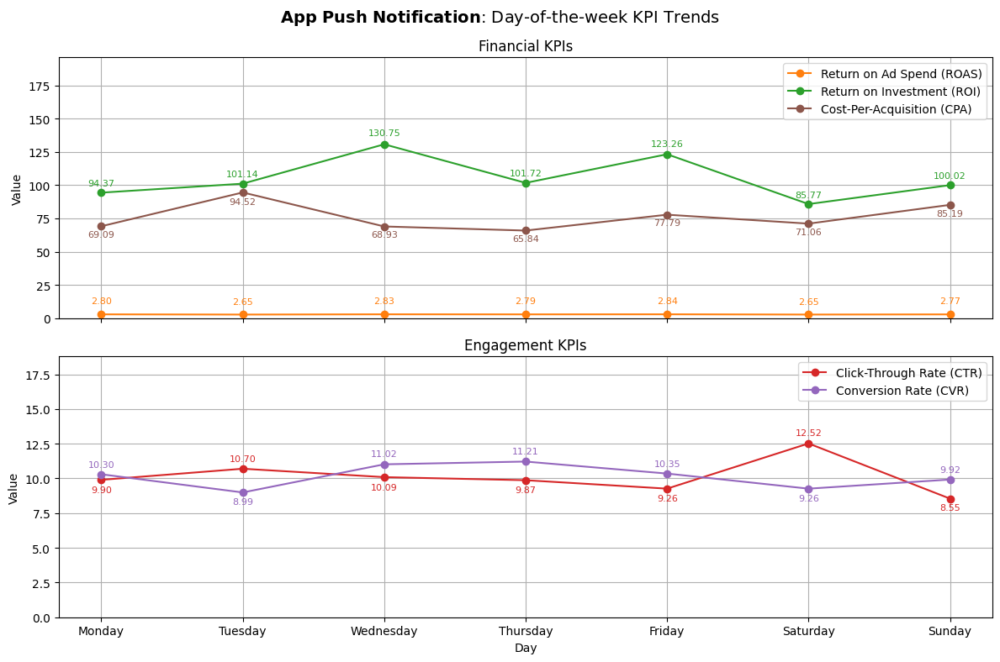

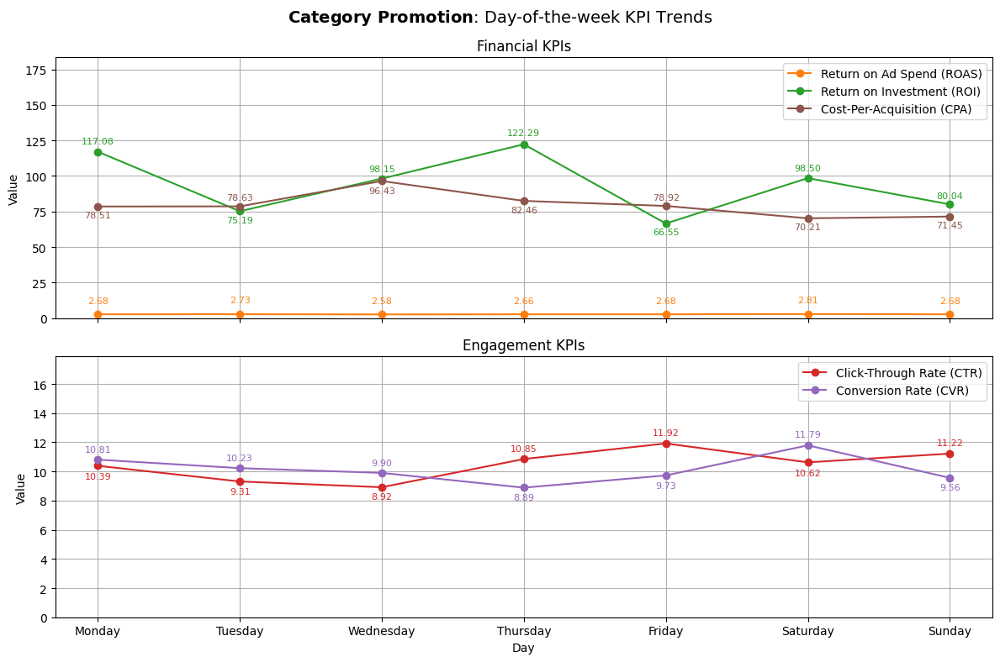

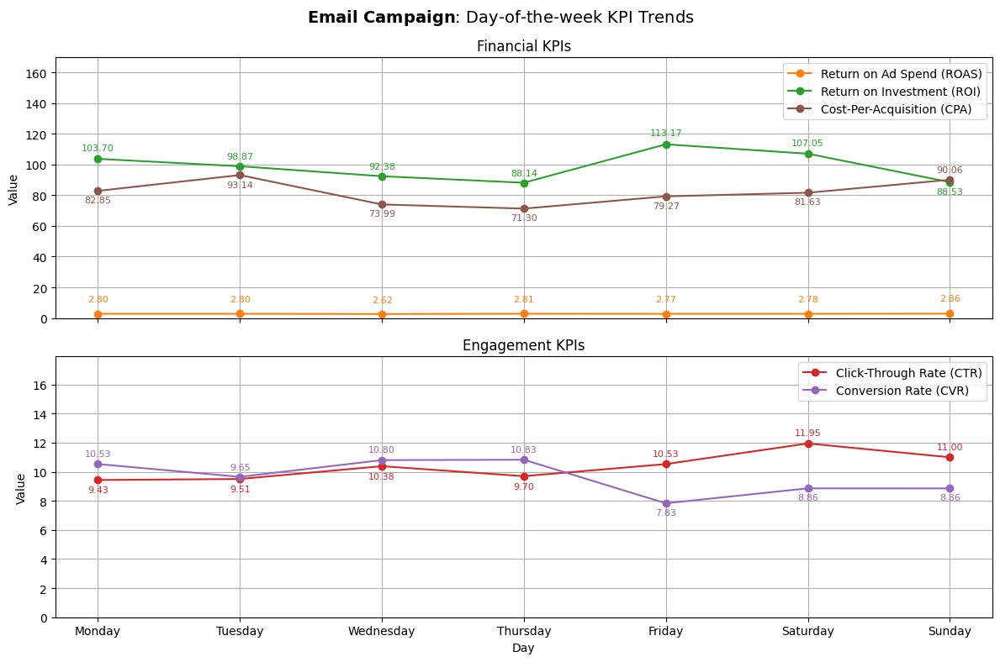

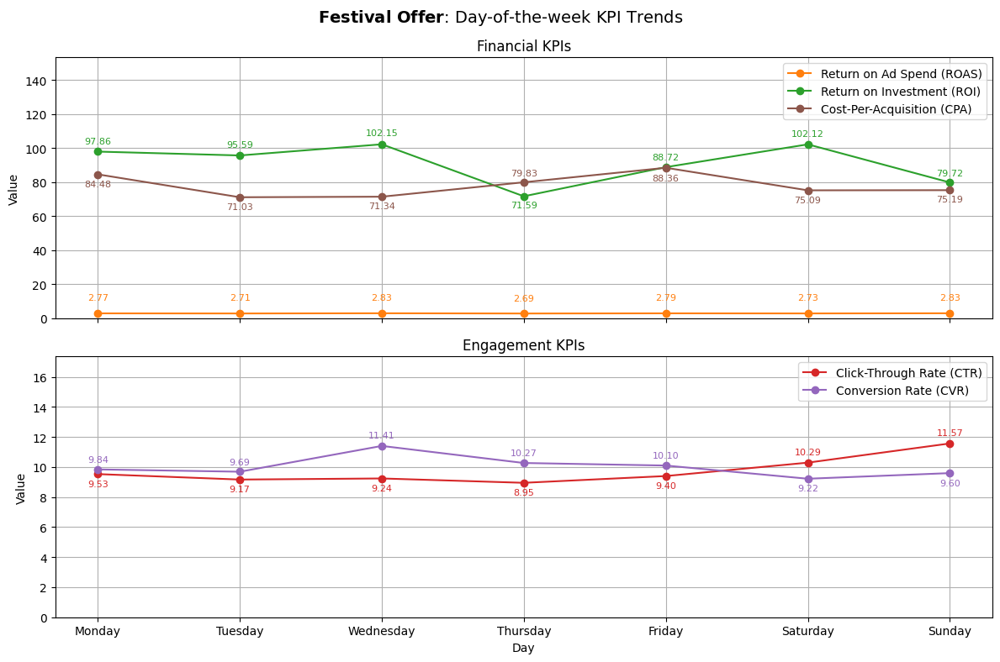

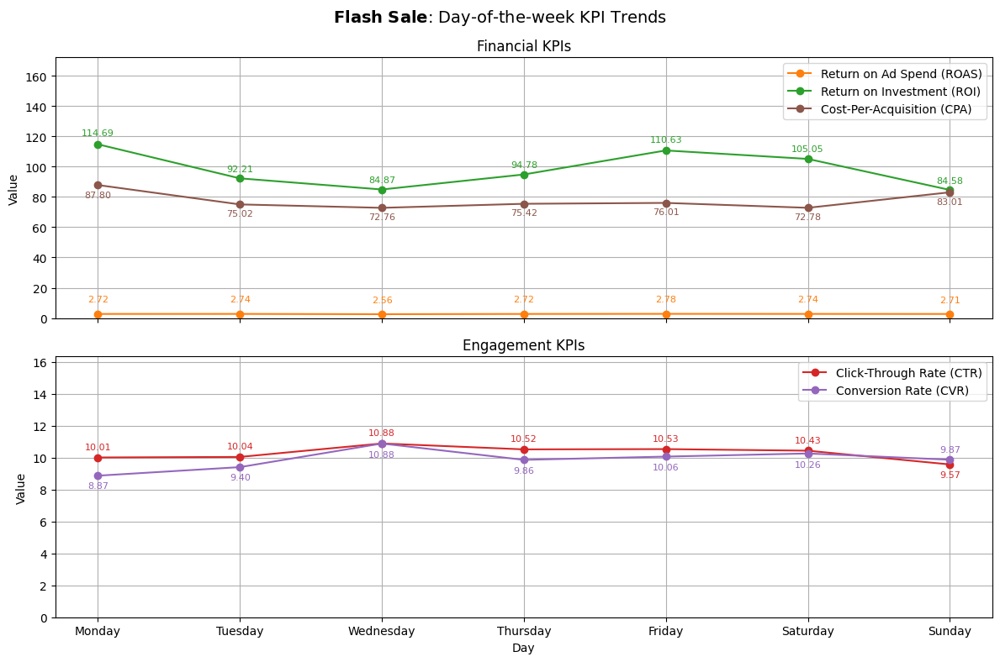

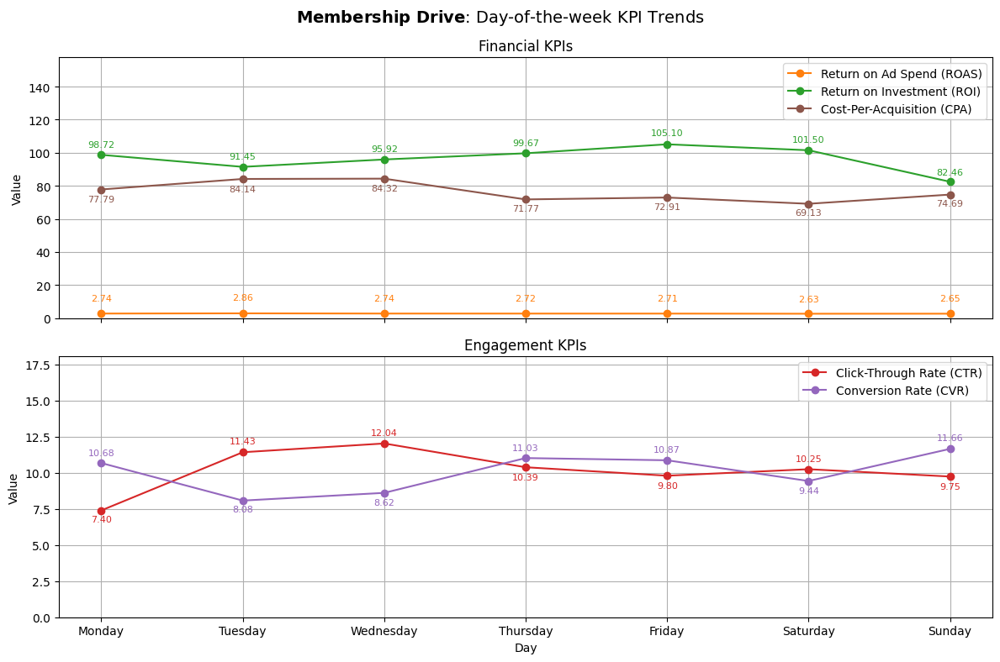

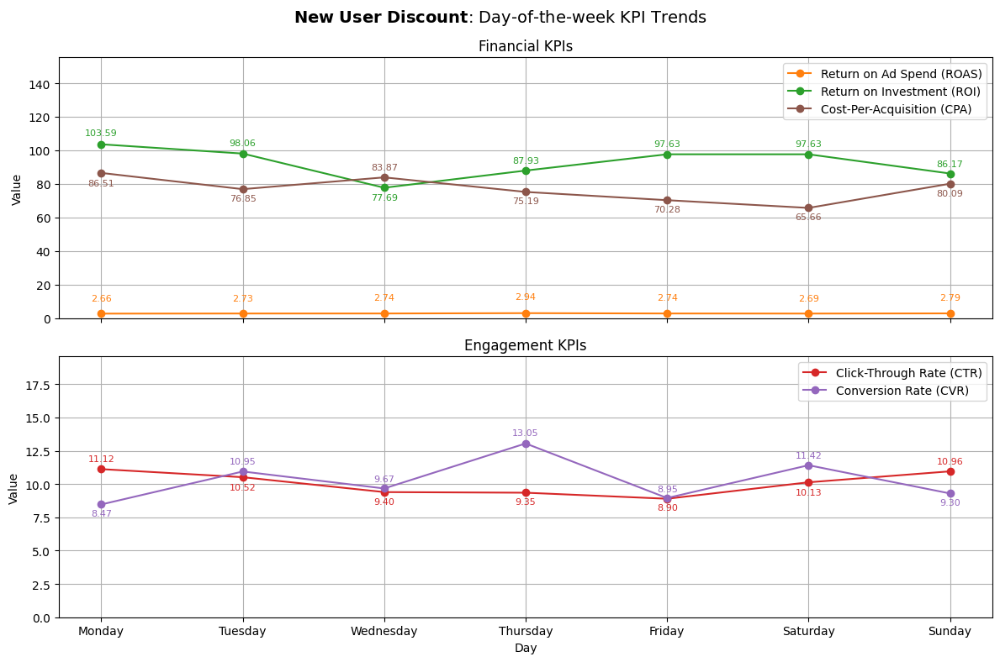

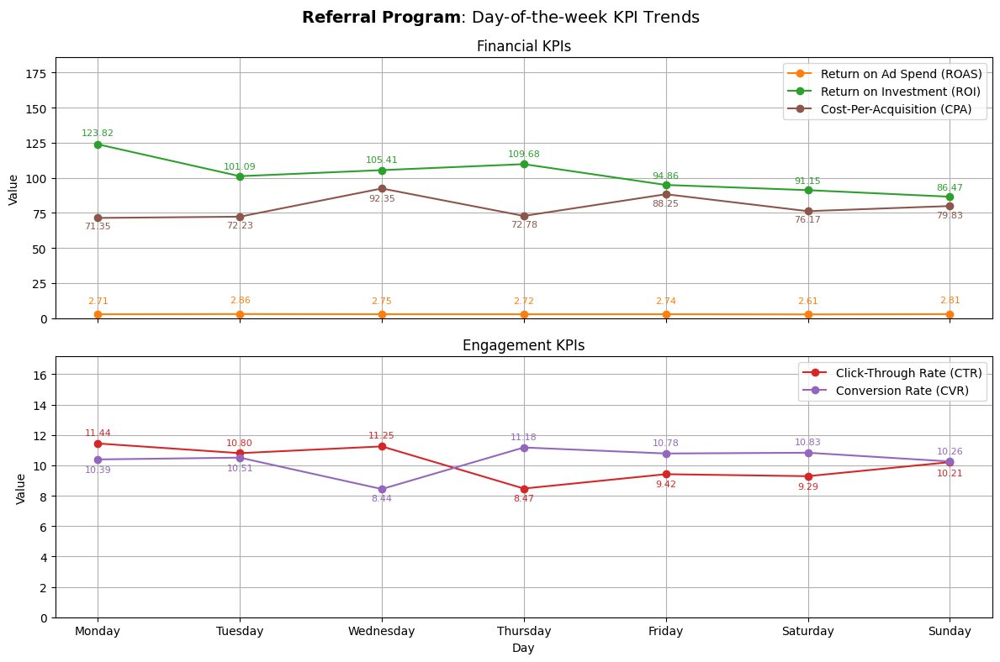

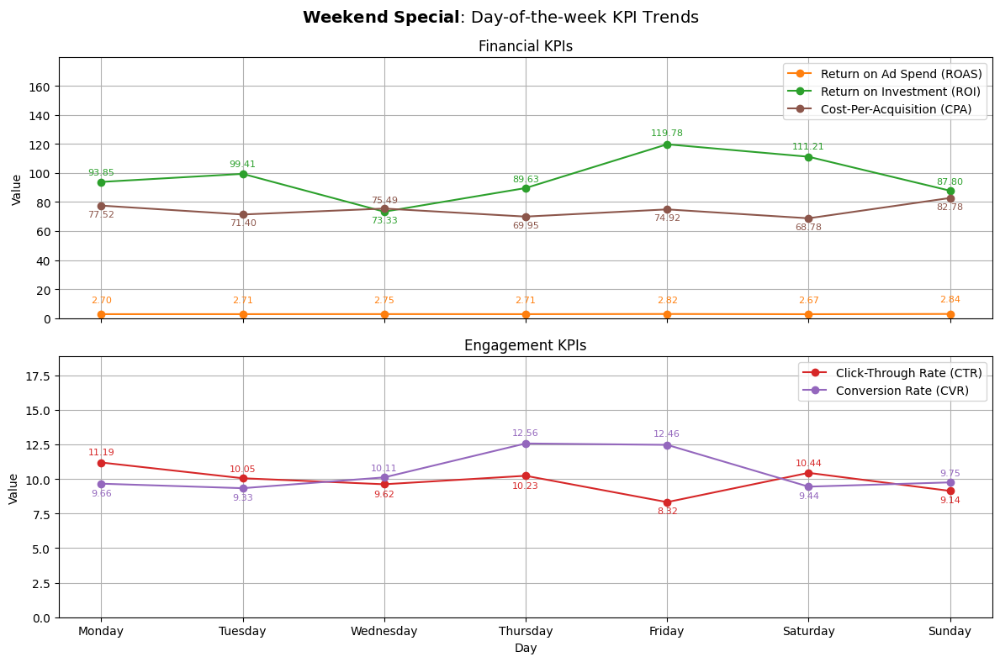

In [57]:
import matplotlib.pyplot as plt
import itertools
import pandas as pd  # needed for pd.notna()

# Flatten columns
df_plot = dow_trends_campaign.copy()
df_plot.columns = ['_'.join(col).strip() if isinstance(col, tuple) else col for col in df_plot.columns]
df_plot = df_plot.reset_index()

# Map internal metric keys to display names
metric_name_map = {
    'ctr': 'Click-Through Rate (CTR)',
    'cpc': 'Cost-Per-Click (CPC)',
    'conversion rate': 'Conversion Rate (CVR)',
    'cost per conversion': 'Cost-Per-Acquisition (CPA)',
    'frequency': 'Frequency',
    'profit': 'Profit',
    'revenue generated': 'Revenue Generated',
    'revenue per conversion': 'Revenue-Per-Conversion (RPC)',
    'roas': 'Return on Ad Spend (ROAS)',
    'roi': 'Return on Investment (ROI)',
    'spend': 'Investment'
}

# Metrics to plot
selected_metrics = {
    'frequency': 'Frequency',
    'roas_mean': 'Return on Ad Spend (ROAS)',
    'roi_median': 'Return on Investment (ROI)',
    'ctr_median': 'Click-Through Rate (CTR)',
    'conversion_rate_median': 'Conversion Rate (CVR)',
    'cost_per_conversion_mean': 'Cost-Per-Acquisition (CPA)'
}

# Split metrics
financial_metrics = ['roas_mean', 'roi_median', 'cost_per_conversion_mean']
other_metrics = [key for key in selected_metrics if key not in financial_metrics]

# Assign unique colors for all selected metrics
colors = itertools.cycle(plt.get_cmap('tab10').colors)
metric_colors = {metric: next(colors) for metric in selected_metrics}

# Ensure correct day order
days_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Loop through each campaign
for campaign_name in df_plot['campaign_name'].unique():
    subset = df_plot[df_plot['campaign_name'] == campaign_name].copy()
    subset['publish_day'] = pd.Categorical(subset['publish_day'], categories=days_order, ordered=True)
    subset = subset.sort_values('publish_day')

    fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 8), sharex=True)

    # ---------- Plot Financial KPIs ----------
    max_financial_value = 0
    for internal_col in financial_metrics:
        if internal_col in subset.columns:
            color = metric_colors[internal_col]
            y_values = subset[internal_col]
            max_financial_value = max(max_financial_value, y_values.max())
            axes[0].plot(
                subset['publish_day'],
                y_values,
                marker='o',
                label=selected_metrics[internal_col],
                color=color
            )

    # Add ROAS labels (always above)
    roas_vals = subset.get('roas_mean', pd.Series([None]*len(subset)))
    for x, roas_val in zip(subset['publish_day'], roas_vals):
        if pd.notna(roas_val):
            axes[0].text(
                x,
                roas_val * 3.5,
                f"{roas_val:.2f}",
                fontsize=8,
                ha='center',
                va='bottom',
                color=metric_colors['roas_mean']
            )

    # ROI & CPA labels logic
    roi_vals = subset.get('roi_median', pd.Series([None]*len(subset)))
    cpa_vals = subset.get('cost_per_conversion_mean', pd.Series([None]*len(subset)))
    for x, roi_val, cpa_val in zip(subset['publish_day'], roi_vals, cpa_vals):
        if pd.notna(roi_val) and pd.notna(cpa_val):
            if roi_val > cpa_val:
                axes[0].text(x, roi_val + roi_val * 0.04, f"{roi_val:.2f}", fontsize=8, ha='center', va='bottom', color=metric_colors['roi_median'])
                axes[0].text(x, cpa_val - cpa_val * 0.04, f"{cpa_val:.2f}", fontsize=8, ha='center', va='top', color=metric_colors['cost_per_conversion_mean'])
            else:
                axes[0].text(x, cpa_val + cpa_val * 0.04, f"{cpa_val:.2f}", fontsize=8, ha='center', va='bottom', color=metric_colors['cost_per_conversion_mean'])
                axes[0].text(x, roi_val - roi_val * 0.04, f"{roi_val:.2f}", fontsize=8, ha='center', va='top', color=metric_colors['roi_median'])
        else:
            if pd.notna(roi_val):
                axes[0].text(x, roi_val + roi_val * 0.04, f"{roi_val:.2f}", fontsize=8, ha='center', va='bottom', color=metric_colors['roi_median'])
            if pd.notna(cpa_val):
                axes[0].text(x, cpa_val + cpa_val * 0.04, f"{cpa_val:.2f}", fontsize=8, ha='center', va='bottom', color=metric_colors['cost_per_conversion_mean'])

    axes[0].set_ylabel("Value")
    axes[0].set_title("Financial KPIs")
    axes[0].legend()
    axes[0].grid(True)
    if max_financial_value > 0:
        axes[0].set_ylim(0, max_financial_value * 1.5)

    # ---------- Plot Engagement KPIs ----------
    max_engagement_value = 0

    for internal_col in other_metrics:
        if internal_col in subset.columns:
            color = metric_colors[internal_col]
            y_values = subset[internal_col]
            max_engagement_value = max(max_engagement_value, y_values.max())
            axes[1].plot(
                subset['publish_day'],
                y_values,
                marker='o',
                label=selected_metrics[internal_col],
                color=color
            )

    # CTR & CVR label logic
    ctr_vals = subset.get('ctr_median', pd.Series([None]*len(subset)))
    cvr_vals = subset.get('conversion_rate_median', pd.Series([None]*len(subset)))
    for x, ctr_val, cvr_val in zip(subset['publish_day'], ctr_vals, cvr_vals):
        if pd.notna(ctr_val) and pd.notna(cvr_val):
            if ctr_val > cvr_val:
                axes[1].text(x, ctr_val + ctr_val * 0.04, f"{ctr_val:.2f}", fontsize=8, ha='center', va='bottom', color=metric_colors['ctr_median'])
                axes[1].text(x, cvr_val - cvr_val * 0.04, f"{cvr_val:.2f}", fontsize=8, ha='center', va='top', color=metric_colors['conversion_rate_median'])
            else:
                axes[1].text(x, cvr_val + cvr_val * 0.04, f"{cvr_val:.2f}", fontsize=8, ha='center', va='bottom', color=metric_colors['conversion_rate_median'])
                axes[1].text(x, ctr_val - ctr_val * 0.04, f"{ctr_val:.2f}", fontsize=8, ha='center', va='top', color=metric_colors['ctr_median'])
        else:
            if pd.notna(ctr_val):
                axes[1].text(x, ctr_val + ctr_val * 0.04, f"{ctr_val:.2f}", fontsize=8, ha='center', va='bottom', color=metric_colors['ctr_median'])
            if pd.notna(cvr_val):
                axes[1].text(x, cvr_val + cvr_val * 0.04, f"{cvr_val:.2f}", fontsize=8, ha='center', va='bottom', color=metric_colors['conversion_rate_median'])

    axes[1].set_xlabel("Day")
    axes[1].set_ylabel("Value")
    axes[1].set_title("Engagement KPIs")
    axes[1].legend()
    axes[1].grid(True)
    if max_engagement_value > 0:
        axes[1].set_ylim(0, max_engagement_value * 1.5)

    # Set x-axis tick order explicitly
    axes[0].set_xticks(days_order)
    axes[1].set_xticks(days_order)

    # ---------- Campaign Title ----------
    campaign_name_escaped = r'\ '.join(campaign_name.title().split(' '))
    campaign_name_math = fr"$\mathbf{{{campaign_name_escaped}}}$"
    fig.suptitle(f"{campaign_name_math}: Day-of-the-week KPI Trends", fontsize=14)

    plt.xticks(rotation=0)
    plt.tight_layout()
    plt.show()

### 5.3 Daily performance analysis

In [58]:
import itertools
days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
months = list(range(1, 13))

day_month_index = list(itertools.product(months, days))

performance_trend = df.groupby(['publish_month', 'publish_day']).agg({
    'campaign_id': 'count',
    'roas': 'mean',
    'roi': 'median',
    'ctr': 'median',
    'conversion_rate': 'median',
    'cost_per_conversion': 'median',
    'spend': ['mean', 'sum'],
    'revenue_generated': ['mean', 'sum']
}).reindex(day_month_index).round(3)

# Rename 'campaign_id' to 'frequency'
performance_trend.rename(columns={'campaign_id': 'frequency'}, level=0, inplace=True)

# Add profit column
performance_trend[('profit', 'sum')] = (
    performance_trend[('revenue_generated', 'sum')] - performance_trend[('spend', 'sum')]
).round(3)

performance_trend

frequency   roas      roi     ctr conversion_rate  \
                              count   mean   median  median          median   
publish_month publish_day                                                     
1             Monday             45  2.590  110.804  10.290           8.824   
              Tuesday            45  2.963   93.967   9.577          10.227   
              Wednesday          45  2.795   70.724  11.530           9.241   
              Thursday           36  2.775   76.557   8.739          12.638   
              Friday             36  2.771  117.202  11.882           9.809   
...                             ...    ...      ...     ...             ...   
12            Wednesday          36  2.731  124.032   9.776           9.845   
              Thursday           36  2.976   90.676   7.918          13.661   
              Friday             45  2.723  110.222  10.636           9.663   
              Saturday           45  2.825   96.310   8.388           9.464   
              Sunday             45  2.590   79.626  11.549           9.966   

                          cost_per_conversion     spend             \
                                       median      mean        sum   
publish_month publish_day                                            
1             Monday                   48.633  2888.998  130004.90   
              Tuesday                  55.138  3019.155  135861.99   
              Wednesday                56.553  2822.529  127013.80   
              Thursday                 64.731  3298.155  118733.59   
              Friday                   59.047  2790.592  100461.33   
...                                       ...       ...        ...   
12            Wednesday                51.195  2928.848  105438.53   
              Thursday                 57.635  3222.610  116013.97   
              Friday                   55.870  2876.892  129460.12   
              Saturday                 57.024  2982.676  134220.44   
              Sunday                   45.182  2843.722  127967.48   

                          revenue_generated                profit  
                                       mean        sum        sum  
publish_month publish_day                                          
1             Monday               6131.216  275904.74  145899.84  
              Tuesday              5900.709  265531.92  129669.93  
              Wednesday            5339.530  240278.84  113265.04  
              Thursday             5449.327  196175.78   77442.19  
              Friday               5829.432  209859.54  109398.21  
...                                     ...        ...        ...  
12            Wednesday            6467.943  232845.94  127407.41  
              Thursday             5713.046  205669.65   89655.68  
              Friday               5903.914  265676.15  136216.03  
              Saturday             6048.477  272181.48  137961.04  
              Sunday               5546.007  249570.30  121602.82  

[84 rows x 11 columns]

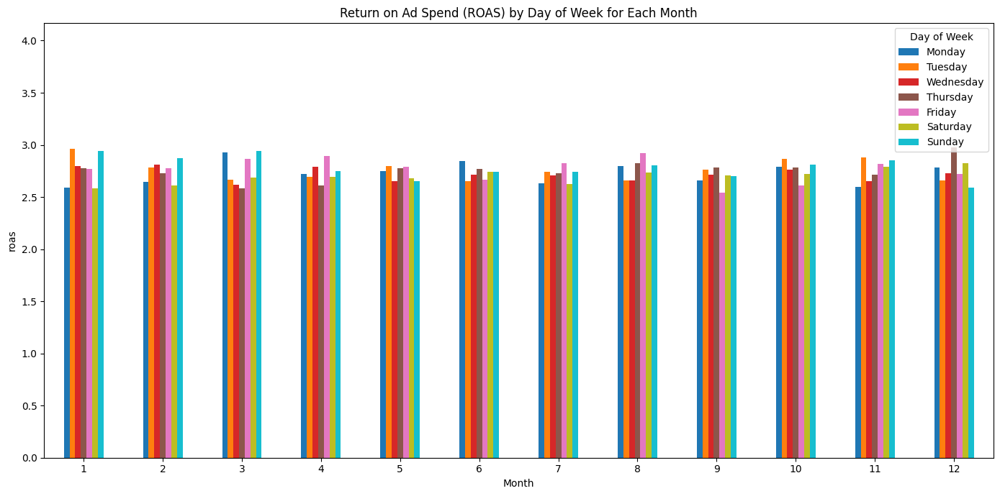

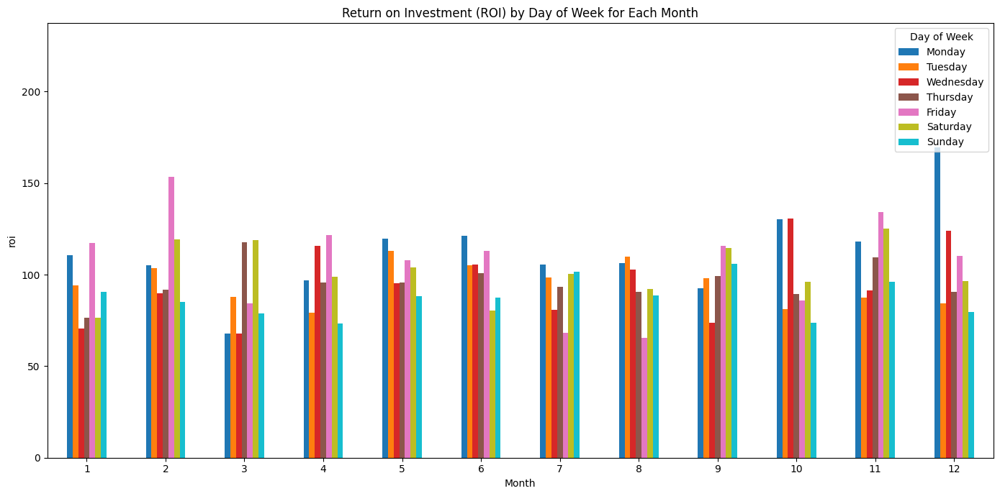

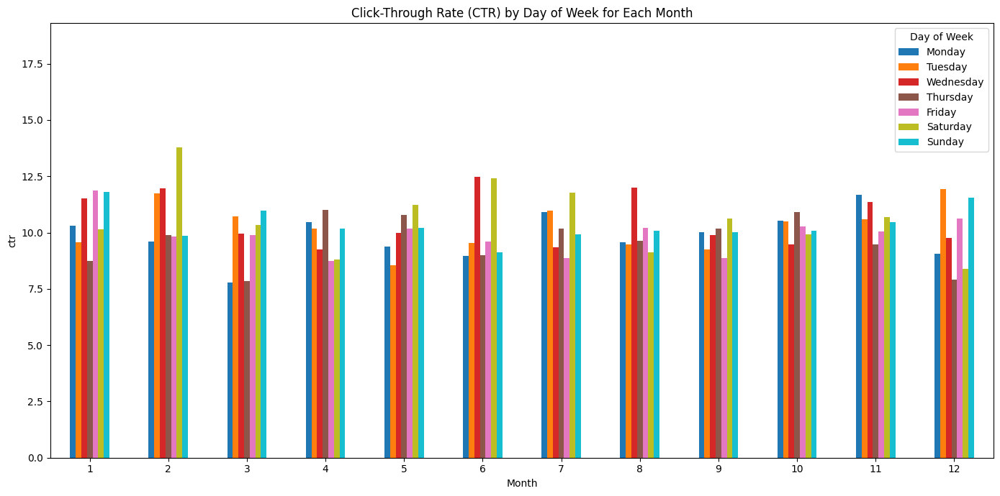

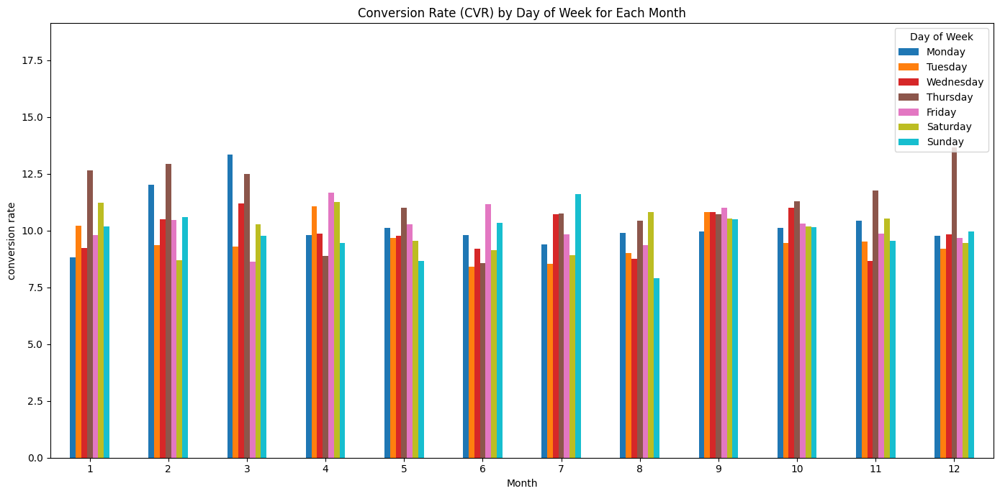

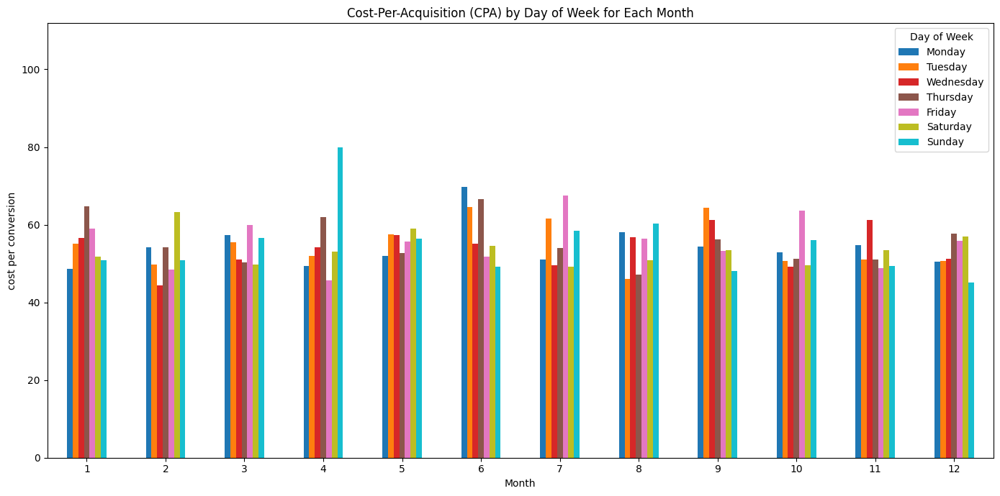

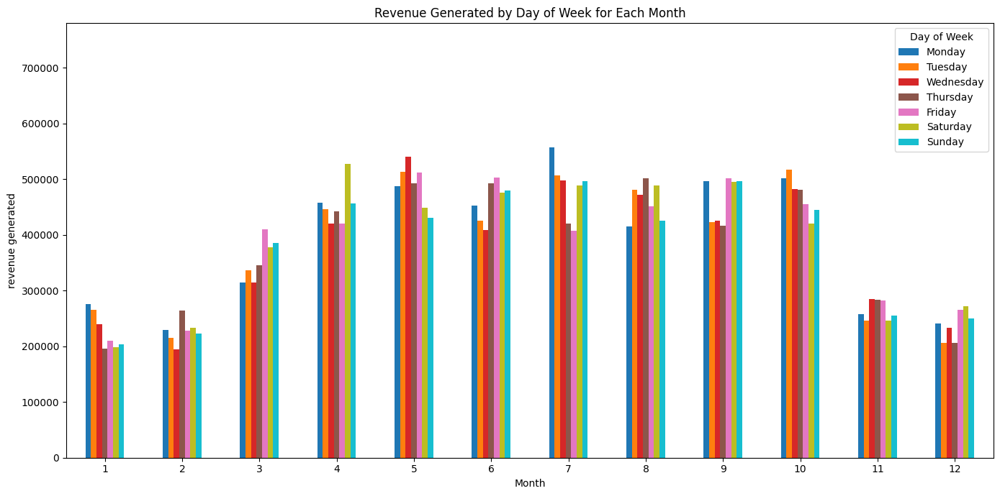

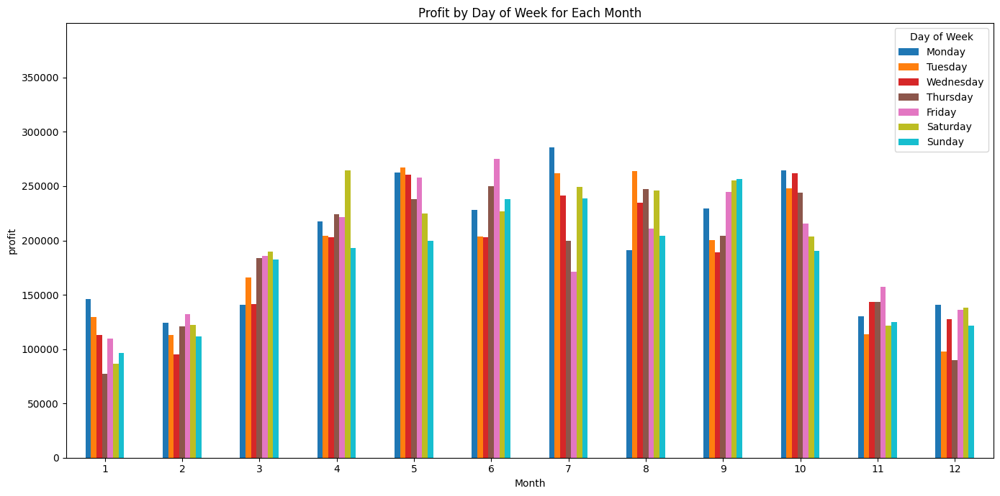

In [59]:
ordered_days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

metrics = [
    ('roas', 'mean'),
    ('roi', 'median'),
    ('ctr', 'median'),
    ('conversion_rate', 'median'),
    ('cost_per_conversion', 'median'),
    ('revenue_generated', 'sum'),
    ('profit', 'sum')
]
# Map internal metric keys to display names
metric_name_map = {
    'ctr': 'Click-Through Rate (CTR)',
    'cpc': 'Cost-Per-Click (CPC)',
    'conversion rate': 'Conversion Rate (CVR)',
    'cost per conversion': 'Cost-Per-Acquisition (CPA)',
    'frequency': 'Frequency',
    'profit': 'Profit',
    'revenue generated': 'Revenue Generated',
    'revenue per conversion': 'Revenue-Per-Conversion (RPC)',
    'roas': 'Return on Ad Spend (ROAS)',
    'roi': 'Return on Investment (ROI)',
    'spend': 'Investment'
}

for metric in metrics:
    df_plot = performance_trend.reset_index()
    df_plot['publish_day'] = pd.Categorical(df_plot['publish_day'], categories=ordered_days, ordered=True)

    pivoted = df_plot.pivot(index='publish_month', columns='publish_day', values=metric)
    pivoted = pivoted[ordered_days]
    max_val = pivoted.max().max()

    metric_name = metric[0].replace('_', ' ')
    display_name = metric_name_map.get(metric_name, metric_name.capitalize())
    title = f"{display_name} by Day of Week for Each Month"

    ax = pivoted.plot(kind='bar', figsize=(14, 7), colormap='tab10', title=title)
    ax.set_xlabel('Month')
    ax.set_ylabel(metric_name)
    ax.legend(title='Day of Week', loc='upper right')
    ax.set_xticks(range(len(pivoted.index)))
    ax.set_xticklabels(pivoted.index, rotation=0)
    plt.ylim(0, max_val * 1.4)
    plt.tight_layout()
    plt.show()

/tmp/ipython-input-1987264150.py:38: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivoted = df_plot.pivot_table(


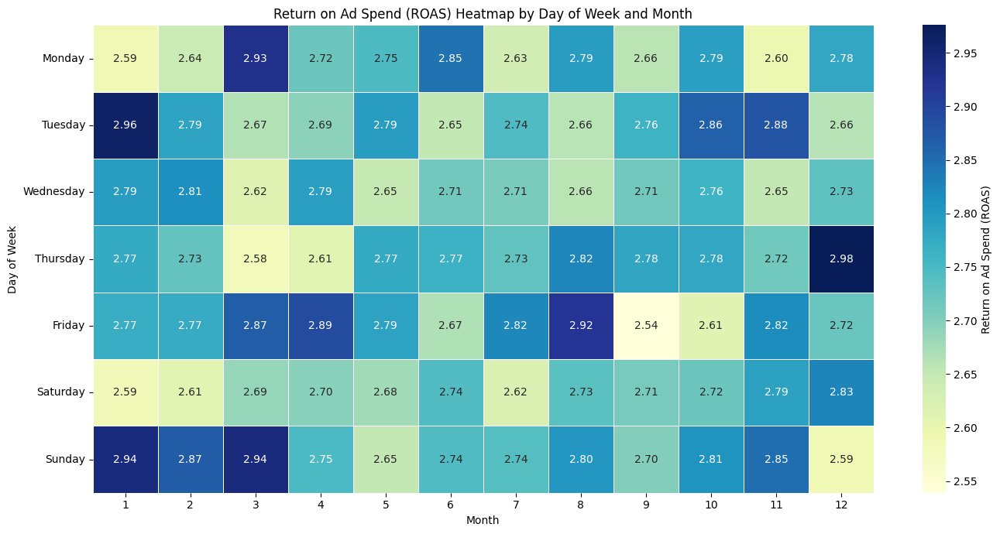

/tmp/ipython-input-1987264150.py:38: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivoted = df_plot.pivot_table(


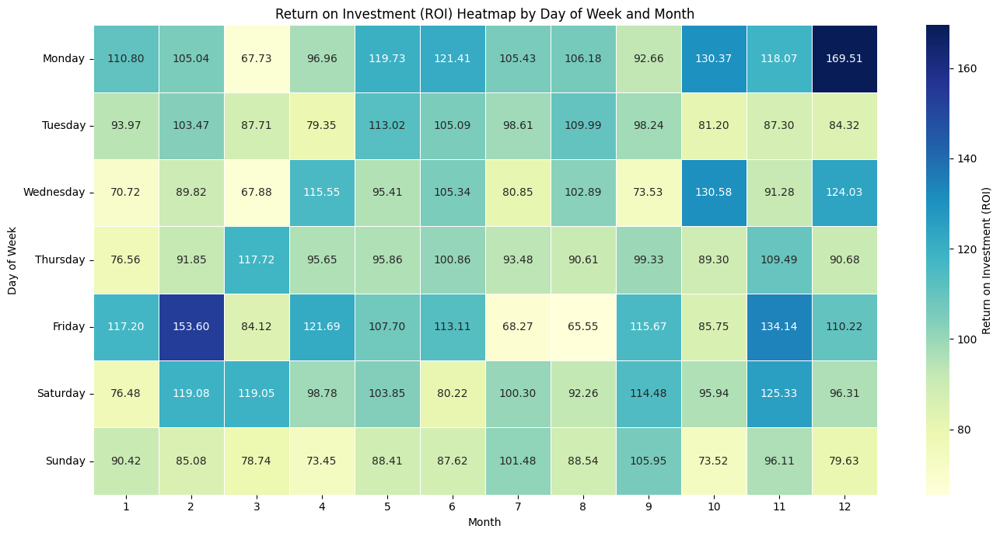

/tmp/ipython-input-1987264150.py:38: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivoted = df_plot.pivot_table(


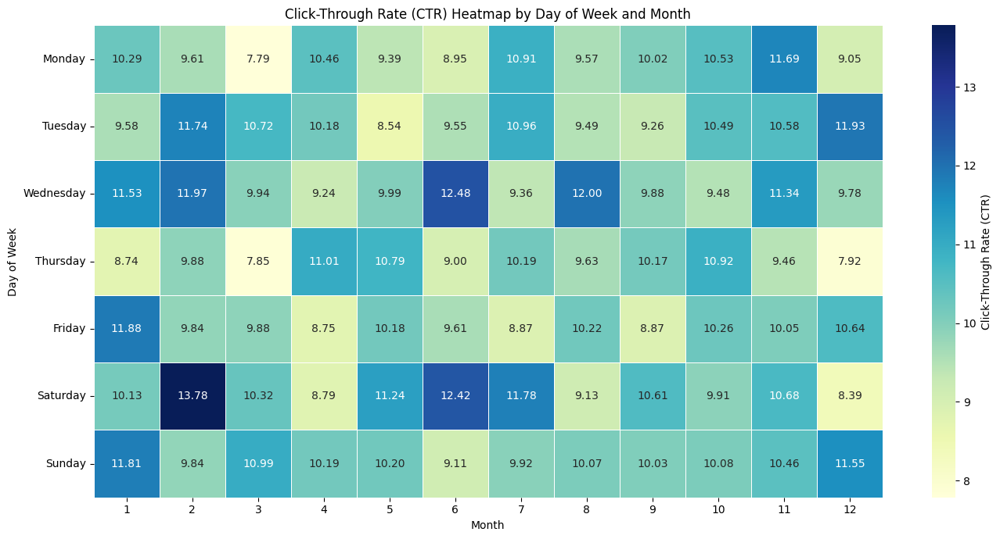

/tmp/ipython-input-1987264150.py:38: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivoted = df_plot.pivot_table(


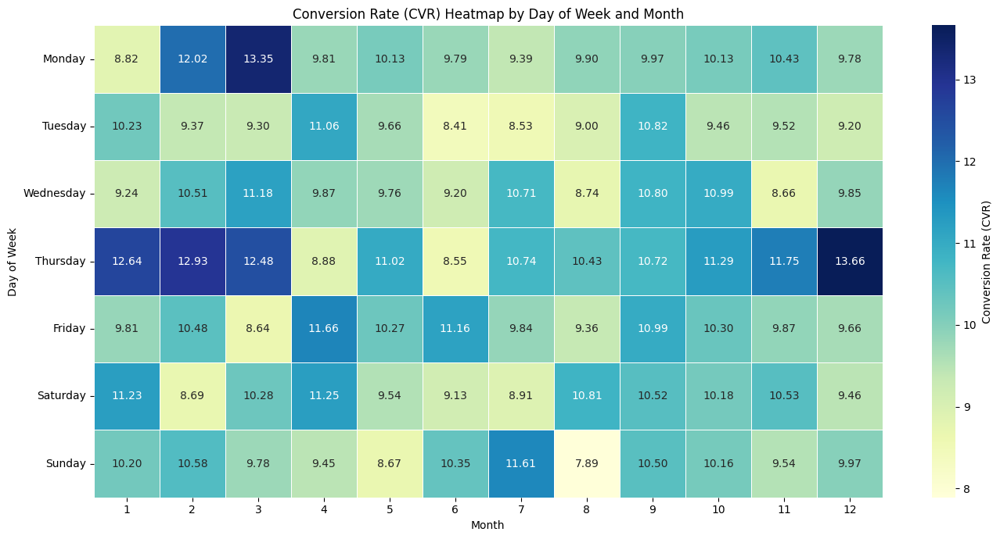

/tmp/ipython-input-1987264150.py:38: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivoted = df_plot.pivot_table(


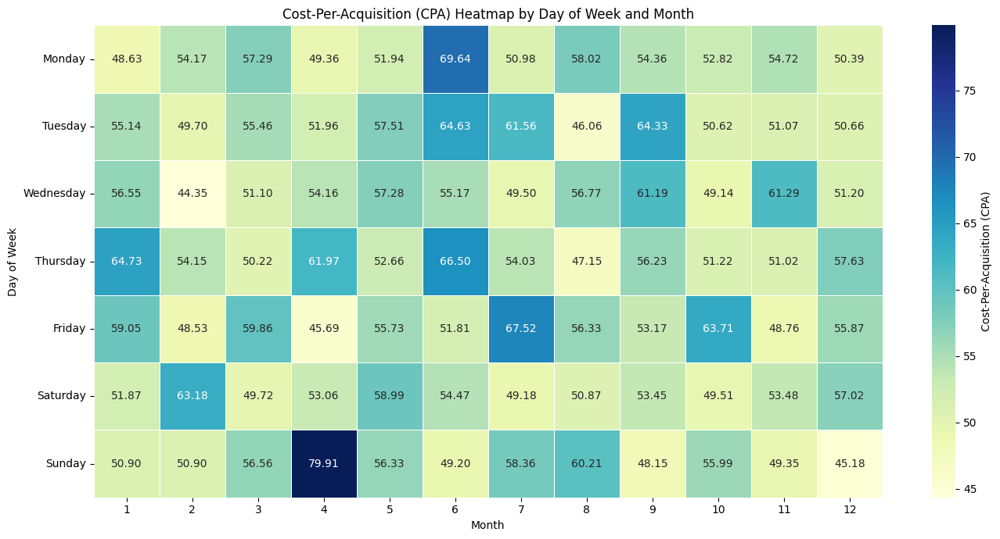

/tmp/ipython-input-1987264150.py:38: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivoted = df_plot.pivot_table(


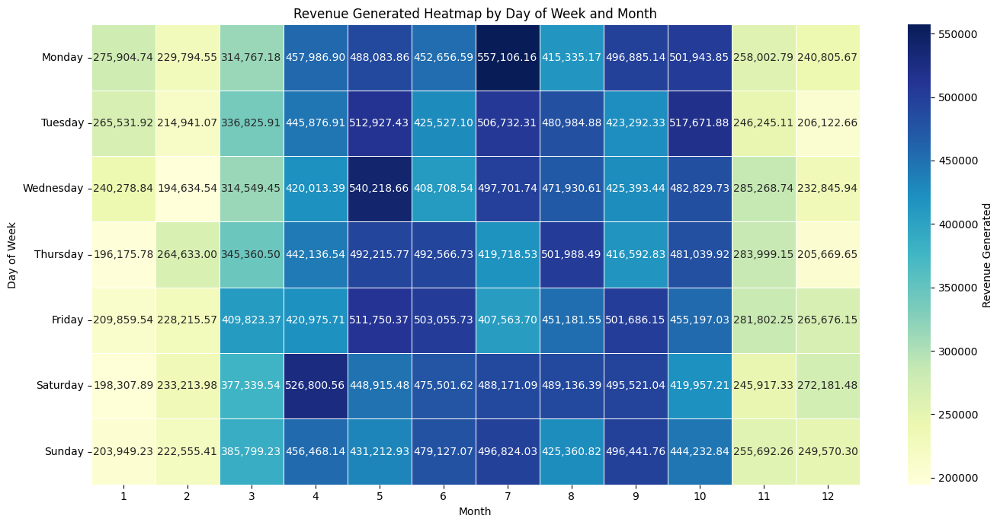

/tmp/ipython-input-1987264150.py:38: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivoted = df_plot.pivot_table(


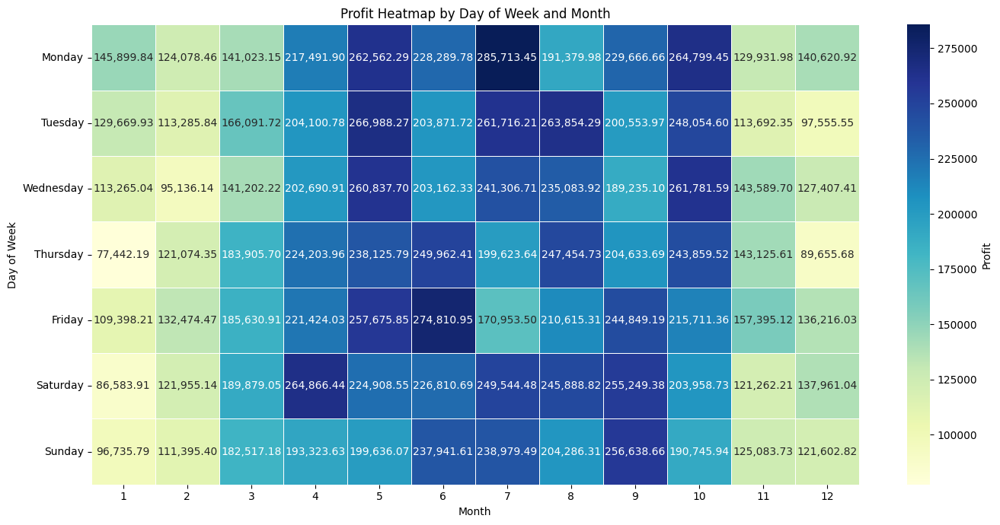

In [60]:
ordered_days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

metrics = [
    'roas_mean',
    'roi_median',
    'ctr_median',
    'conversion_rate_median',
    'cost_per_conversion_median',
    'revenue_generated_sum',
    'profit_sum'
]
# Map internal metric keys to display names
metric_name_map = {
    'ctr': 'Click-Through Rate (CTR)',
    'cpc': 'Cost-Per-Click (CPC)',
    'conversion rate': 'Conversion Rate (CVR)',
    'cost per conversion': 'Cost-Per-Acquisition (CPA)',
    'frequency': 'Frequency',
    'profit': 'Profit',
    'revenue generated': 'Revenue Generated',
    'revenue per conversion': 'Revenue-Per-Conversion (RPC)',
    'roas': 'Return on Ad Spend (ROAS)',
    'roi': 'Return on Investment (ROI)',
    'spend': 'Investment'
}

for metric_column in metrics:
    df_plot = performance_trend.reset_index()

    df_plot.columns = ['_'.join(col).strip('_') if isinstance(col, tuple) else col for col in df_plot.columns]

    day_col = 'publish_day'
    month_col = 'publish_month'

    df_plot[day_col] = pd.Categorical(df_plot[day_col], categories=ordered_days, ordered=True)
    df_plot[month_col] = df_plot[month_col].astype(int)

    pivoted = df_plot.pivot_table(
        index=day_col,
        columns=month_col,
        values=metric_column
    )

    pivoted = pivoted.reindex(ordered_days)
    pivoted = pivoted.sort_index(axis=1)

    metric_name = ' '.join(metric_column.split('_')[:-1])
    display_name = metric_name_map.get(metric_name, metric_name.capitalize())
    title = f"{display_name} Heatmap by Day of Week and Month"

    plt.figure(figsize=(14, 7))
    sns.heatmap(pivoted, annot=True, fmt=",.2f", cmap='YlGnBu', cbar_kws={'label': display_name}, linewidths=0.5)
    plt.title(title)
    plt.xlabel('Month')
    plt.ylabel('Day of Week')
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()